In [1]:
import pennylane as qml
import numpy as np
from sympy import symbols,zeros
import matplotlib.pyplot as plt

np.random.seed = 20

In [2]:
def reduction(num_qubits, pauli_word, sym_mean, wire_map=None):
    if wire_map is None:
        wire_map = dict(zip(range(num_qubits), range(num_qubits)))
        
    order = pauli_word.num_wires
    
    pauli = qml.pauli.pauli_word_to_string(pauli_word, wire_map)
    
    gate_idx = {'X':0, 'Y':1, 'Z':2}
    
    expanded = []
    expanded_coeffs = []
    
    non_identity_idx = pauli_word.wires.labels
    
    for i in non_identity_idx:
        new_pauli = 'I'*i + pauli[i] + 'I'*(num_qubits-i-1)
        coeff = np.prod([sym_mean[j, gate_idx[pauli[j]]] for j in non_identity_idx if j != i])
        expanded.append(new_pauli)
        expanded_coeffs.append(coeff)
    
    if order >= 2:
        new_pauli = 'I'*num_qubits
        coeff = -(order-1) * np.prod([sym_mean[j, gate_idx[pauli[j]]] for j in non_identity_idx])
        expanded.append(new_pauli)
        expanded_coeffs.append(coeff)
    
    expanded_paulis = [qml.pauli.string_to_pauli_word(s, wire_map) for s in expanded]
    #print(expanded_paulis)
    #print(expanded_coeffs)
    return expanded_paulis, expanded_coeffs

In [3]:
def compute_H_mf(H, num_qubits, sym_mean, wire_map=None, is_symbolic=False):
    if wire_map is None:
        wire_map = dict(zip(range(num_qubits), range(num_qubits)))
        
    gate_idx = {'X':0, 'Y':1, 'Z':2}
    identity_str = 'I'*num_qubits
    
    coeffs = H.coeffs
    pauli_words = H.ops
    
    if is_symbolic:
        H_mf = zeros(num_qubits, 3)
        Id_coeff = 0
    else:
        H_mf = np.zeros((num_qubits, 3))
        Id_coeff = 0
    
    for k,each in enumerate(pauli_words):
        expanded_paulis, expanded_coeffs = reduction(num_qubits, pauli_word=each, sym_mean=sym_mean, wire_map=wire_map)
        for idx in range(len(expanded_paulis)):
            pauli = expanded_paulis[idx]
            pauli_str = qml.pauli.pauli_word_to_string(pauli, wire_map)
            
            if pauli_str != identity_str:
                wire = pauli.wires.labels[0] # always 1-qubit pauli
                #print((wire, gate_idx[pauli_str[wire]]))
                #print(expanded_coeffs[idx], coeffs[k])
                H_mf[wire, gate_idx[pauli_str[wire]]] += expanded_coeffs[idx] * coeffs[k]
            else:
                Id_coeff += expanded_coeffs[idx] * coeffs[k]
                
        #print('------')
    return H_mf, Id_coeff

In [83]:
def solve_1q_hamiltonian(a,b,c): # aX + bY + cZ
#     matrix = np.array([[c,a-b*1j],[a+b*1j,-c]])
#     eigvals, eigvecs = np.linalg.eigh(matrix)
#     ground_state = eigvecs[:,0]

#     X_mean = ground_state.conj().T @ np.array([[0,1],[1,0]]) @ ground_state
#     Y_mean = ground_state.conj().T @ np.array([[0,-1j],[1j,0]]) @ ground_state
#     Z_mean = ground_state.conj().T @ np.array([[1,0],[0,-1]]) @ ground_state
#     M_mean = ground_state.conj().T @ matrix @ ground_state


    norm = np.sqrt(a**2 + b**2 + c**2)
    X_mean = -a/norm
    Y_mean = -b/norm
    Z_mean = -c/norm
    eigvals = [-norm, norm]
    
    #print('eigvals:', eigvals[0], eigvals[1])
    return np.real([X_mean, Y_mean, Z_mean]), eigvals[0], eigvals[1]

In [48]:
a = 1.23
b = -2.34
c = -3.45
lamb = np.sqrt(a**2+b**2+c**2)

c1 = 1./(a-b*1j)
c2 = 1./(lamb - c)
print(c1,c2)

diff = c1/(-0.94703865+0.j) - c2/(0.14941009-0.28424359j)
print(diff)

(0.17600343421335055-0.33483580167417903j) 0.128264692317733
(-0.3716921891152366-6.299586463587303e-09j)


In [59]:
a = 1.23
b = -2.34
c = 3.45
print(solve_1q_hamiltonian(a,b,c))

lamb =  -np.sqrt(a**2+b**2+c**2)
print(a/ lamb, b/lamb, c/lamb)

[[ 3.45+0.j    1.23+2.34j]
 [ 1.23-2.34j -3.45+0.j  ]]
[-0.3211196 +0.j          0.44063687-0.83828477j]
(array([-0.28299427,  0.53837934, -0.79376441, -4.3463778 ]), -4.346377802262477, 4.346377802262477)
-0.282994266941022 0.5383793371073101 -0.7937644072735983


In [65]:
qubit_means = np.random.uniform(size=(5,3))
print(qubit_means.shape)
norm = np.linalg.norm(qubit_means,axis=1,keepdims=True)
print(norm)
qubit_means = qubit_means / norm
print(qubit_means)
np.linalg.norm(qubit_means,axis=1)

(5, 3)
[[0.91275258]
 [0.96690182]
 [0.79951381]
 [1.13051861]
 [0.43317931]]
[[0.80279603 0.57377814 0.16216405]
 [0.22135589 0.96648048 0.13006558]
 [0.04096718 0.97665092 0.21089017]
 [0.68568366 0.72407633 0.07450762]
 [0.9702251  0.07225167 0.2311773 ]]


array([1., 1., 1., 1., 1.])

In [84]:
def mf_spectral_gap(num_qubits, H, qubit_means=None):
    
    if qubit_means is None:
        qubit_means = np.random.uniform(low=-1.,high=1.,size=(num_qubits,3))
        qubit_means = qubit_means / np.linalg.norm(qubit_means,axis=0,keepdims=True)

    for i in range(30):
        H_mf, Id_coeff = compute_H_mf(H, num_qubits, sym_mean=qubit_means)
        print(f'iteration {i+1}:')
#         print('Means =', qubit_means)
#         print('H = ', H_mf)
        #print('Id_coeff = ', Id_coeff)
        
        total_ground_energy = 0
        all_qubit_spectral_gap = []
        for q in range(num_qubits):
            a,b,c = H_mf[q,:]
            if abs(a) + abs(b) + abs(c) > 1e-6:
                new_means, qubit_ground_energy, qubit_first_energy = solve_1q_hamiltonian(a,b,c)
            else:
                new_means = qubit_means[q,:]
                qubit_ground_energy, qubit_first_energy = 0,0
            
            all_qubit_spectral_gap.append(qubit_first_energy - qubit_ground_energy)
            qubit_means[q,:] = new_means
            total_ground_energy += qubit_ground_energy

        total_ground_energy += Id_coeff
        smallest_qubit_spectral_gap = min(all_qubit_spectral_gap)
        total_first_energy = total_ground_energy + smallest_qubit_spectral_gap
        total_spectral_gap = smallest_qubit_spectral_gap
        #print('current energies =', total_ground_energy, total_first_energy)
        print('current qubit gaps', all_qubit_spectral_gap)
        print('current gap =', total_spectral_gap)
    print('-----')
    print(total_ground_energy, total_first_energy)
    print(total_spectral_gap)
    return total_spectral_gap

In [85]:
num_qubits = 3
paulis = ['III','XII','IYI','IIZ','ZXI','IYY','ZIY','XYZ']

# num_qubits = 2
# paulis = ['XX', 'YY', 'ZZ']#, 'XZ', 'YX']

# num_qubits = 3
# paulis = ['XYI','YXI']

wire_map = dict(zip(range(num_qubits), range(num_qubits)))
pauli_words = [qml.pauli.string_to_pauli_word(pauli, wire_map=wire_map) for pauli in paulis]

#coeffs = np.random.uniform(size=len(paulis))
coeffs = np.ones(len(pauli_words))
H = qml.Hamiltonian(coeffs, pauli_words)

H_mat = qml.matrix(H,wire_order = range(num_qubits))
eigvals, _ = np.linalg.eigh(H_mat)
spectral_gap = eigvals[1] - eigvals[0]
print('ground energy = ', eigvals[0])
print('first energy = ', eigvals[1])
print('spectral gap =', spectral_gap)
mf_spectral_gap(num_qubits, H)

ground energy =  -3.722935259657391
first energy =  -0.9767606235612661
spectral gap = 2.7461746360961246
iteration 1:
current qubit gaps [0.7585272397566915, 2.3369635009414473, 2.3392985759381753]
current gap = 0.7585272397566915
iteration 2:
current qubit gaps [3.5643518268690944, 1.309511456424988, 3.626399849250022]
current gap = 1.309511456424988
iteration 3:
current qubit gaps [3.1721402550333266, 4.0629838084056695, 2.6761192094012674]
current gap = 2.6761192094012674
iteration 4:
current qubit gaps [3.9904724573921007, 3.4872731845429983, 3.8221427315616485]
current gap = 3.4872731845429983
iteration 5:
current qubit gaps [3.867931771768699, 4.415998646241191, 4.109971733041759]
current gap = 3.867931771768699
iteration 6:
current qubit gaps [3.891348814354462, 4.56134387761914, 4.456825355430205]
current gap = 3.891348814354462
iteration 7:
current qubit gaps [3.8937641421480444, 4.677853076915609, 4.566100810728035]
current gap = 3.8937641421480444
iteration 8:
current qubit

3.8995988474461836

In [86]:
mf_spectral_gap(num_qubits, H)

iteration 1:
current qubit gaps [2.0444172810345056, 2.071811355018029, 3.5847507659744595]
current gap = 2.0444172810345056
iteration 2:
current qubit gaps [4.325333195852059, 4.536338508951031, 3.1653250273584095]
current gap = 3.1653250273584095
iteration 3:
current qubit gaps [3.945462076472025, 4.113292073047897, 4.7944691734773475]
current gap = 3.945462076472025
iteration 4:
current qubit gaps [3.948696191823302, 4.804495518954528, 4.407267457075936]
current gap = 3.948696191823302
iteration 5:
current qubit gaps [3.9012729732384046, 4.564137234610988, 4.805155575520005]
current gap = 3.9012729732384046
iteration 6:
current qubit gaps [3.9101374705609326, 4.789329038184864, 4.606869891488632]
current gap = 3.9101374705609326
iteration 7:
current qubit gaps [3.8987063642636657, 4.6720799854859605, 4.756111339648306]
current gap = 3.8987063642636657
iteration 8:
current qubit gaps [3.9028558329918526, 4.7591762482530156, 4.666835902236804]
current gap = 3.9028558329918526
iteratio

3.8995992704496496

In [87]:
coeffs_init = np.random.uniform(size=len(paulis))
coeffs_end = np.random.uniform(size=len(paulis))

true_gaps = []
approx_gaps = []

steps = 100
coeffs_step = (coeffs_end - coeffs_init)/steps

#coeffs_lst = [coeffs_init + t*coeffs_step for t in range(steps+1)]
coeffs_lst = [np.random.normal(size=len(paulis)) for t in range(steps+1)]

for coeffs in coeffs_lst:
    H = qml.Hamiltonian(coeffs, pauli_words)

    H_mat = qml.matrix(H,wire_order = range(num_qubits))
    eigvals, _ = np.linalg.eigh(H_mat)
    spectral_gap = eigvals[1] - eigvals[0]
    print('ground energy = ', eigvals[0])
    print('first energy = ', eigvals[1])
    print('spectral gap =', spectral_gap)
    mf_gap = mf_spectral_gap(num_qubits, H)
    print('mf gap = ', mf_gap)
    
    true_gaps.append(spectral_gap)
    approx_gaps.append(mf_gap)
    print('-----')

ground energy =  -2.757139792672044
first energy =  -1.7135673100071604
spectral gap = 1.0435724826648836
iteration 1:
current qubit gaps [3.264983410052465, 2.3617383305020665, 2.2733200763783254]
current gap = 2.2733200763783254
iteration 2:
current qubit gaps [3.2051774187776383, 1.220803315401936, 2.3003057531834674]
current gap = 1.220803315401936
iteration 3:
current qubit gaps [3.0239094663024484, 1.6918531944140027, 2.398099389248003]
current gap = 1.6918531944140027
iteration 4:
current qubit gaps [3.1666295613624302, 1.7001996897827059, 2.324251571043983]
current gap = 1.7001996897827059
iteration 5:
current qubit gaps [3.0426713026156618, 1.717467435486179, 2.3864848064804627]
current gap = 1.717467435486179
iteration 6:
current qubit gaps [3.1399723813700615, 1.7025426514448274, 2.336045263714214]
current gap = 1.7025426514448274
iteration 7:
current qubit gaps [3.057726231700303, 1.7156429174401082, 2.37814420928638]
current gap = 1.7156429174401082
iteration 8:
current qu

ground energy =  -1.5588050265905422
first energy =  -0.7727621761603181
spectral gap = 0.7860428504302241
iteration 1:
current qubit gaps [0.19641314739321272, 1.5187122170897445, 1.9657024649173538]
current gap = 0.19641314739321272
iteration 2:
current qubit gaps [1.4200667695597458, 1.6525162552063137, 1.1212804817751307]
current gap = 1.1212804817751307
iteration 3:
current qubit gaps [2.046108924294141, 2.219365021139274, 1.8118016993079022]
current gap = 1.8118016993079022
iteration 4:
current qubit gaps [2.4234138729436046, 2.699747384252825, 1.491989469111634]
current gap = 1.491989469111634
iteration 5:
current qubit gaps [1.9003463129783003, 2.130700874691946, 2.4906797417906166]
current gap = 1.9003463129783003
iteration 6:
current qubit gaps [2.819730922025986, 2.879755604635188, 1.6105533783253585]
current gap = 1.6105533783253585
iteration 7:
current qubit gaps [1.8954024266406242, 2.0857781806233713, 2.570474675518963]
current gap = 1.8954024266406242
iteration 8:
curre

ground energy =  -5.163506465819504
first energy =  -3.795400969732821
spectral gap = 1.3681054960866827
iteration 1:
current qubit gaps [1.3170189553885707, 3.3590927317311072, 2.183734638722915]
current gap = 1.3170189553885707
iteration 2:
current qubit gaps [2.1152618315359604, 4.606986062999617, 1.9757375778808788]
current gap = 1.9757375778808788
iteration 3:
current qubit gaps [2.0796992692445917, 4.1925237115964205, 2.5063482078863584]
current gap = 2.0796992692445917
iteration 4:
current qubit gaps [2.1034898427105815, 4.821885952162266, 1.9465723054764326]
current gap = 1.9465723054764326
iteration 5:
current qubit gaps [1.9326679769561161, 4.423949809007508, 2.496312361151915]
current gap = 1.9326679769561161
iteration 6:
current qubit gaps [2.098771539170975, 4.911201239406324, 1.9257597909532933]
current gap = 1.9257597909532933
iteration 7:
current qubit gaps [1.8488445685728063, 4.567747311832962, 2.4922441233593755]
current gap = 1.8488445685728063
iteration 8:
current 

ground energy =  -3.790710121236864
first energy =  -2.1941147446421363
spectral gap = 1.5965953765947276
iteration 1:
current qubit gaps [3.072816309396015, 2.5921021159161133, 1.3746293189522343]
current gap = 1.3746293189522343
iteration 2:
current qubit gaps [3.364748564178077, 3.8451748364097504, 1.412102049582364]
current gap = 1.412102049582364
iteration 3:
current qubit gaps [3.9565094533046405, 3.4677221836284273, 1.9433111607937692]
current gap = 1.9433111607937692
iteration 4:
current qubit gaps [4.008214287584919, 4.24478300413126, 1.3190250978842637]
current gap = 1.3190250978842637
iteration 5:
current qubit gaps [3.9159727796454056, 3.499217733999156, 2.444083286727385]
current gap = 2.444083286727385
iteration 6:
current qubit gaps [4.06918134894399, 4.160952238974787, 1.8483076193340586]
current gap = 1.8483076193340586
iteration 7:
current qubit gaps [3.834932477535838, 3.8214990497335304, 2.8423588626750265]
current gap = 2.8423588626750265
iteration 8:
current qubit

ground energy =  -5.860391894003954
first energy =  -4.406306519964731
spectral gap = 1.4540853740392237
iteration 1:
current qubit gaps [2.718225016928734, 2.322342416219044, 2.9873092066579976]
current gap = 2.322342416219044
iteration 2:
current qubit gaps [1.7410289800667154, 1.3887976913264113, 1.646706995497885]
current gap = 1.3887976913264113
iteration 3:
current qubit gaps [3.761498505923867, 3.060132327563748, 6.313456739763332]
current gap = 3.060132327563748
iteration 4:
current qubit gaps [1.9128256434477096, 0.8941647700006161, 2.4222094982793596]
current gap = 0.8941647700006161
iteration 5:
current qubit gaps [3.2066840045841234, 3.7464643914508873, 6.4218875739703964]
current gap = 3.2066840045841234
iteration 6:
current qubit gaps [1.950900058019121, 0.9096832147812408, 2.508355825880831]
current gap = 0.9096832147812408
iteration 7:
current qubit gaps [2.9925806419694987, 4.027223312844386, 6.432577227095835]
current gap = 2.9925806419694987
iteration 8:
current qubi

ground energy =  -5.7848976654123
first energy =  -5.386413002527286
spectral gap = 0.3984846628850143
iteration 1:
current qubit gaps [4.729715597796466, 4.024744153127987, 1.5951205248085747]
current gap = 1.5951205248085747
iteration 2:
current qubit gaps [4.952545454538507, 5.540970078570883, 1.737278040943281]
current gap = 1.737278040943281
iteration 3:
current qubit gaps [6.1854461433065575, 5.733763624263366, 1.7455902379800756]
current gap = 1.7455902379800756
iteration 4:
current qubit gaps [6.129988547407211, 5.901971607454025, 1.7800519818172407]
current gap = 1.7800519818172407
iteration 5:
current qubit gaps [6.177175074348149, 5.898920993948346, 1.7777536369973157]
current gap = 1.7777536369973157
iteration 6:
current qubit gaps [6.1724992942703185, 5.903130742626349, 1.7787554160994232]
current gap = 1.7787554160994232
iteration 7:
current qubit gaps [6.173981394641371, 5.9027654560509575, 1.7786296037562752]
current gap = 1.7786296037562752
iteration 8:
current qubit g

ground energy =  -3.6943042170494187
first energy =  -2.149548723297794
spectral gap = 1.5447554937516248
iteration 1:
current qubit gaps [2.8483817600536376, 2.217974377574513, 2.241589031489526]
current gap = 2.217974377574513
iteration 2:
current qubit gaps [3.2661041840442424, 5.506104843058764, 7.204439702782884]
current gap = 3.2661041840442424
iteration 3:
current qubit gaps [3.3307412121409015, 2.4587849243700948, 7.200300029592883]
current gap = 2.4587849243700948
iteration 4:
current qubit gaps [3.3734875655798895, 5.53009077886578, 7.27821211781497]
current gap = 3.3734875655798895
iteration 5:
current qubit gaps [3.3144444675817617, 2.4329211370493544, 7.288797724812142]
current gap = 2.4329211370493544
iteration 6:
current qubit gaps [3.372573787577155, 5.525378346346918, 7.2651008735364915]
current gap = 3.372573787577155
iteration 7:
current qubit gaps [3.3178270670104997, 2.4407402551152164, 7.278114481898023]
current gap = 2.4407402551152164
iteration 8:
current qubit 

ground energy =  -5.6343815112229825
first energy =  -4.621365605115087
spectral gap = 1.0130159061078956
iteration 1:
current qubit gaps [1.8100961414945067, 0.849495885405054, 3.572492878063836]
current gap = 0.849495885405054
iteration 2:
current qubit gaps [6.245396365923929, 3.599795161473575, 0.7547484421850004]
current gap = 0.7547484421850004
iteration 3:
current qubit gaps [4.082624331388859, 1.956818001589537, 8.000982331748492]
current gap = 1.956818001589537
iteration 4:
current qubit gaps [7.655126560561509, 4.231873203112405, 6.7417760408709]
current gap = 4.231873203112405
iteration 5:
current qubit gaps [6.449218032290174, 2.3584172285089777, 7.846468513725286]
current gap = 2.3584172285089777
iteration 6:
current qubit gaps [7.397625489813546, 4.229090051541305, 7.409401104830855]
current gap = 4.229090051541305
iteration 7:
current qubit gaps [6.474087887926323, 2.3560669659547693, 7.79790475675774]
current gap = 2.3560669659547693
iteration 8:
current qubit gaps [7.3

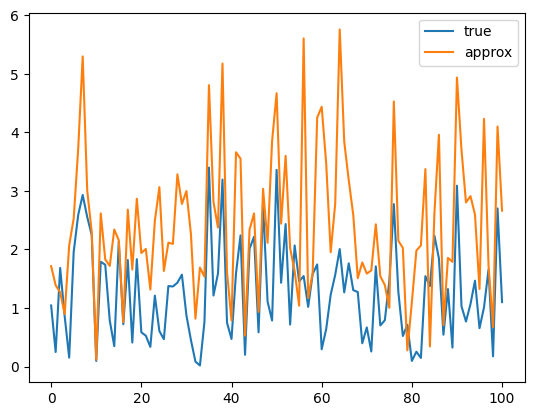

In [88]:
t_range = range(steps+1)
plt.plot(t_range, true_gaps, label='true')
plt.plot(t_range, approx_gaps, label='approx')
plt.legend()

In [139]:
np.corrcoef(true_gaps, approx_gaps)

array([[1.        , 0.59926022],
       [0.59926022, 1.        ]])

In [10]:
def mf_spectral_distribution(w0, w1, w2, radius, num_points=10):
    # w in conv(w0, w1, w2) and |w - w0| <= radius

    dir1 = w1 - w0
    len1 = np.linalg.norm(dir1)
    dir2 = w2 - w0
    len2 = np.linalg.norm(dir2)
    print(dir1, dir2)

    # Check if dir1 and dir2 are parallel
    prod = np.dot(dir1, dir2)
    print(prod)
    assert abs(prod**2 - np.sum(dir1**2) * np.sum(dir2**2)) > 1e-6

    ndir1 = dir1 / len1
    dir3 = dir2 - np.dot(dir2, ndir1)*ndir1
    len3 = np.linalg.norm(dir3)
    ndir3 = dir3 / len3

    max_angle = np.arccos(prod / (len1 * len2))

    r_lst = np.linspace(radius**2, 0, num_points, endpoint = False)
    r = np.sqrt(r_lst)
    
    theta_lst = np.linspace(0, max_angle, num_points, endpoint=True)
    R, Theta = np.meshgrid(r_lst, theta_lst)
    Gap = np.zeros(R.shape)
    Gap_mf = np.zeros(R.shape)
    
    #record = []
    for i in range(R.shape[0]):
        for j in range(R.shape[1]):
            p = w0 + R[i,j]*(ndir1*np.cos(Theta[i,j])) + ndir3*np.sin(Theta[i,j])
            H = qml.Hamiltonian(p, pauli_words)
            Gap_mf[i,j] = mf_spectral_gap(num_qubits, H)
            
            H_mat = qml.matrix(H,wire_order = range(num_qubits))
            eigvals, _ = np.linalg.eigh(H_mat)
            Gap[i,j] = eigvals[1] - eigvals[0]
            #record.append((r,theta,mf_gap))
            
    return R, Theta, Gap, Gap_mf

In [11]:
w0 = np.random.uniform(size=len(paulis))
w1 = np.random.uniform(size=len(paulis))
w2 = np.random.uniform(size=len(paulis))

In [12]:
radius = 0.1*np.linalg.norm(w1 - w0)
R, Theta, Gap, Gap_mf = mf_spectral_distribution(w0, w1, w2, radius, 30)

[-0.66968785 -0.26763986 -0.20476166  0.0762747  -0.5259235  -0.07742596
  0.30259568  0.12225732] [-0.12378545  0.24831946  0.00212774  0.44170932  0.25184597 -0.03715066
  0.49655403 -0.48874813]
0.010619771397127102
iteration 1:
Means = [[0.15358258 0.08874402 0.38210808]
 [0.19510866 0.65489329 0.41342652]
 [0.3582831  0.97685358 0.08296931]]
H =  [[0.35277115 0.         0.57862254]
 [0.24310418 1.12047978 0.        ]
 [0.         0.54332352 0.5906004 ]]
current energies = -2.475822239688515 -1.1204602652355127
current gap = 1.355361974453002
iteration 2:
Means = [[-5.20556359e-01  0.00000000e+00 -8.53827311e-01]
 [-2.12031220e-01 -9.77262893e-01 -1.11022302e-16]
 [ 0.00000000e+00 -6.77037062e-01 -7.35948922e-01]]
H =  [[ 0.89256204  0.         -0.44989637]
 [-0.54322062  0.49800387  0.        ]
 [ 0.         -0.94273367  0.92195422]]
current energies = -2.4579990905484337 -0.9840974597748429
current gap = 1.4739016307735908
iteration 3:
Means = [[-8.92975702e-01  0.00000000e+00  4

iteration 1:
Means = [[0.62100666 0.40109866 0.43540844]
 [0.23330346 0.72372288 0.19776361]
 [0.75378126 0.15663673 0.67800349]]
H =  [[0.70736648 0.         0.22143152]
 [0.2773882  0.99441154 0.        ]
 [0.         0.60641743 0.87361006]]
current energies = -2.7476765781048313 -1.2652471572318955
current gap = 1.4824294208729358
iteration 2:
Means = [[-9.54334102e-01  0.00000000e+00 -2.98741395e-01]
 [-2.68689331e-01 -9.63226891e-01  5.55111512e-17]
 [ 0.00000000e+00 -5.70233250e-01 -8.21482830e-01]]
H =  [[ 0.95134252  0.         -0.43620083]
 [-0.19032093  0.88317281  0.        ]
 [ 0.         -0.67661413  1.25493239]]
current energies = -1.843133702484901 -0.03623993208936316
current gap = 1.806893770395538
iteration 3:
Means = [[-0.90900371  0.          0.41678803]
 [ 0.21066089 -0.9775592   0.        ]
 [ 0.          0.47457896 -0.88021294]]
H =  [[ 1.00749818  0.          0.3547754 ]
 [ 0.26552558  1.47959751  0.        ]
 [ 0.         -0.3520617   1.23006681]]
current energ

iteration 1:
Means = [[0.42771706 0.11631611 0.73849605]
 [0.69643788 0.40946936 0.22970954]
 [0.15317717 0.12398577 0.51204357]]
H =  [[0.47974592 0.         0.50195139]
 [0.47123787 0.81256518 0.        ]
 [0.         0.57145964 0.65077991]]
current energies = -2.2992702817326895 -0.9105855106252982
current gap = 1.3886847711073913
iteration 2:
Means = [[-6.90935668e-01  0.00000000e+00 -7.22916249e-01]
 [-5.01678312e-01 -8.65054259e-01 -5.55111512e-17]
 [ 0.00000000e+00 -6.59829294e-01 -7.51415533e-01]]
H =  [[ 0.83705579  0.         -0.6263993 ]
 [-0.46129633  0.61840809  0.        ]
 [ 0.         -0.81864974  0.99365517]]
current energies = -2.4021446071703045 -0.8591308371527577
current gap = 1.5430137700175468
iteration 3:
Means = [[-0.80063889  0.          0.5991472 ]
 [ 0.59791603 -0.80155875  0.        ]
 [ 0.          0.63586714 -0.77179853]]
H =  [[ 0.81159871  0.          0.67668643]
 [ 0.38231871  1.42212094  0.        ]
 [ 0.         -0.16952241  1.02940835]]
current ener

iteration 1:
Means = [[0.38479128 0.12436874 0.8908366 ]
 [0.72161169 0.75438317 0.54497866]
 [0.8747039  0.20958433 0.65393062]]
H =  [[0.71031049 0.         0.55836603]
 [0.56936375 0.88720621 0.        ]
 [0.         0.83437659 0.7439911 ]]
current energies = -3.2229342453712393 -1.4159327436682179
current gap = 1.8070015017030214
iteration 2:
Means = [[-7.86175866e-01  0.00000000e+00 -6.18002838e-01]
 [-5.40097557e-01 -8.41602417e-01 -5.55111512e-17]
 [ 0.00000000e+00 -7.46376577e-01 -6.65523858e-01]]
H =  [[ 0.76449134  0.         -0.69120172]
 [-0.39498648  0.57351542  0.        ]
 [ 0.         -0.75661652  1.04523879]]
current energies = -2.3346551581672577 -0.9419107393176622
current gap = 1.3927444188495954
iteration 3:
Means = [[-7.41767886e-01  0.00000000e+00  6.70656695e-01]
 [ 5.67205979e-01 -8.23575969e-01 -5.55111512e-17]
 [ 0.00000000e+00  5.86367179e-01 -8.10045389e-01]]
H =  [[ 0.85131039  0.          0.63435007]
 [ 0.42863934  1.38097537  0.        ]
 [ 0.         -0

iteration 1:
Means = [[0.42970797 0.71131399 0.78254679]
 [0.54826415 0.80818512 0.83441186]
 [0.25492295 0.92366725 0.08123683]]
H =  [[0.36399181 0.         0.77863032]
 [0.50109149 1.11091665 0.        ]
 [0.         0.81383156 0.78996048]]
current energies = -3.5367011033579514 -1.8176836943234487
current gap = 1.7190174090345027
iteration 2:
Means = [[-4.23488221e-01  0.00000000e+00 -9.05901610e-01]
 [-4.11169027e-01 -9.11559121e-01  5.55111512e-17]
 [ 0.00000000e+00 -7.17551987e-01 -6.96504951e-01]]
H =  [[ 0.82560086  0.         -0.59543455]
 [-0.5800798   0.40471639  0.        ]
 [ 0.         -0.92869474  0.82138387]]
current energies = -2.6859990863795913 -1.2713783894800466
current gap = 1.4146206968995447
iteration 3:
Means = [[-8.11067349e-01  0.00000000e+00  5.84952780e-01]
 [ 8.20120621e-01 -5.72190674e-01 -1.94289029e-16]
 [ 0.00000000e+00  7.49058118e-01 -6.62504292e-01]]
H =  [[ 0.6181495   0.          0.87188418]
 [ 0.37456528  1.42077012  0.        ]
 [ 0.         -0

current energies = -1.5862818386284214 0.5395266422121425
current gap = 2.125808480840564
iteration 19:
Means = [[-9.62009756e-01  0.00000000e+00 -2.73015072e-01]
 [ 1.14959504e-01 -9.93370179e-01  5.55111512e-17]
 [ 0.00000000e+00  4.69368378e-01 -8.83002449e-01]]
H =  [[ 1.02229855  0.          0.2907463 ]
 [-0.175055    1.51781015  0.        ]
 [ 0.         -0.68144177  1.28295882]]
current energies = -1.5862816412278615 0.5393973043889817
current gap = 2.1256789456168432
iteration 20:
Means = [[-9.61856029e-01  0.00000000e+00 -2.73556173e-01]
 [ 1.14574409e-01 -9.93414669e-01  1.66533454e-16]
 [ 0.00000000e+00  4.69085377e-01 -8.83152823e-01]]
H =  [[ 1.02245151  0.          0.29036852]
 [-0.17540194  1.51765919  0.        ]
 [ 0.         -0.68171684  1.28286971]]
current energies = -1.586281559499926 0.5394850939314937
current gap = 2.1257666534314197
iteration 21:
Means = [[-9.61960249e-01  0.00000000e+00 -2.73189457e-01]
 [ 1.14809767e-01 -9.93387496e-01  5.55111512e-17]
 [ 0.00

current energies = -1.6132348191770323 0.49524174653521325
current gap = 2.1084765657122455
iteration 18:
Means = [[-9.50039405e-01  0.00000000e+00 -3.12129988e-01]
 [ 1.34171657e-01 -9.90958105e-01 -1.11022302e-16]
 [ 0.00000000e+00  4.83787999e-01 -8.75185221e-01]]
H =  [[ 1.00257528  0.          0.32658509]
 [-0.20345762  1.48511927  0.        ]
 [ 0.         -0.70532642  1.27192593]]
current energies = -1.6132316300601275 0.49562114321032835
current gap = 2.108852773270456
iteration 19:
Means = [[-9.50825291e-01  0.00000000e+00 -3.09727729e-01]
 [ 1.35729709e-01 -9.90745904e-01 -5.55111512e-17]
 [ 0.00000000e+00  4.84960232e-01 -8.74536205e-01]]
H =  [[ 1.0019266   0.          0.3281801 ]
 [-0.20189174  1.48582645  0.        ]
 [ 0.         -0.70402103  1.27237758]]
current energies = -1.6132301931569257 0.4953798528984512
current gap = 2.108610046055377
iteration 20:
Means = [[-9.50319476e-01  0.00000000e+00 -3.11276233e-01]
 [ 1.34641163e-01 -9.90894423e-01  1.11022302e-16]
 [ 0.

iteration 1:
Means = [[0.72795438 0.2304362  0.37768264]
 [0.13333513 0.49585813 0.00619324]
 [0.79176279 0.41272796 0.29115704]]
H =  [[0.43721984 0.         0.2908092 ]
 [0.24657527 0.96109868 0.        ]
 [0.         0.4622671  0.81731888]]
current energies = -2.106961108404916 -1.05675887701733
current gap = 1.0502022313875858
iteration 2:
Means = [[-8.32639334e-01  0.00000000e+00 -5.53815618e-01]
 [-2.48507469e-01 -9.68629980e-01 -5.55111512e-17]
 [ 0.00000000e+00 -4.92302809e-01 -8.70424003e-01]]
H =  [[ 0.98399112  0.         -0.40528632]
 [-0.36156609  0.85896516  0.        ]
 [ 0.         -0.81219002  1.165969  ]]
current energies = -2.070651826348173 -0.2067299564063083
current gap = 1.8639218699418645
iteration 3:
Means = [[-9.24640543e-01  0.00000000e+00  3.80841000e-01]
 [ 3.87962714e-01 -9.21675069e-01 -5.55111512e-17]
 [ 0.00000000e+00  5.71577109e-01 -8.20548359e-01]]
H =  [[ 0.91603867  0.          0.53546849]
 [ 0.24863725  1.47729876  0.        ]
 [ 0.         -0.324

iteration 1:
Means = [[0.71216046 0.80536025 0.77771173]
 [0.82143531 0.98497683 0.65276588]
 [0.35643174 0.28604138 0.72887951]]
H =  [[0.88638142 0.         0.67817586]
 [0.50853881 1.13128203 0.        ]
 [0.         0.93150699 1.0834443 ]]
current energies = -4.530507543039417 -2.298383427073928
current gap = 2.232124115965489
iteration 2:
Means = [[-7.94204422e-01  0.00000000e+00 -6.07650670e-01]
 [-4.10003862e-01 -9.12083786e-01  5.55111512e-17]
 [ 0.00000000e+00 -6.51936629e-01 -7.58273455e-01]]
H =  [[ 0.86579183  0.         -0.58956688]
 [-0.39733739  0.67445396  0.        ]
 [ 0.         -0.80709412  1.10137335]]
current energies = -2.28661228600793 -0.7210259467720086
current gap = 1.5655863392359215
iteration 3:
Means = [[-8.26558566e-01  0.00000000e+00  5.62850724e-01]
 [ 5.07589240e-01 -8.61599190e-01 -1.66533454e-16]
 [ 0.00000000e+00  5.91087562e-01 -8.06607398e-01]]
H =  [[ 0.86842286  0.          0.62337251]
 [ 0.3680431   1.41648772  0.        ]
 [ 0.         -0.2018

current energies = -1.6112024519975385 0.4989672295744789
current gap = 2.1101696815720175
iteration 38:
Means = [[-9.50644215e-01  0.00000000e+00 -3.10283058e-01]
 [ 1.35415108e-01 -9.90788953e-01 -1.11022302e-16]
 [ 0.00000000e+00  4.84588776e-01 -8.74742087e-01]]
H =  [[ 1.0030107   0.          0.32737397]
 [-0.20315702  1.4864275   0.        ]
 [ 0.         -0.70422437  1.27120957]]
current energies = -1.6112024519970096 0.4989673770126646
current gap = 2.110169829009674
iteration 39:
Means = [[-9.50644527e-01  0.00000000e+00 -3.10282103e-01]
 [ 1.35415760e-01 -9.90788863e-01 -1.11022302e-16]
 [ 0.00000000e+00  4.84589264e-01 -8.74741816e-01]]
H =  [[ 1.00301043  0.          0.32737463]
 [-0.20315639  1.48642779  0.        ]
 [ 0.         -0.70422385  1.27120974]]
current energies = -1.6112024519967711 0.49896727713981326
current gap = 2.1101697291365844
iteration 40:
Means = [[-0.95064432  0.         -0.31028275]
 [ 0.13541533 -0.99078892  0.        ]
 [ 0.          0.48458894 -0.

iteration 1:
Means = [[0.32598799 0.49993507 0.08784926]
 [0.9986536  0.37933613 0.57389179]
 [0.10737375 0.47180863 0.81747678]]
H =  [[0.56824735 0.         0.88715323]
 [0.05762438 1.03786075 0.        ]
 [0.         0.25438314 0.63109276]]
current energies = -2.3676340064405914 -1.00676831305483
current gap = 1.3608656933857615
iteration 2:
Means = [[-5.39369661e-01  0.00000000e+00 -8.42069100e-01]
 [-5.54368809e-02 -9.98462194e-01  1.11022302e-16]
 [ 0.00000000e+00 -3.73854887e-01 -9.27487209e-01]]
H =  [[ 1.04979868  0.         -0.22026887]
 [-0.55235194  0.74985612  0.        ]
 [ 0.         -0.97005092  0.95544142]]
current energies = -2.2364237526504125 -0.3737623595979527
current gap = 1.8626613930524598
iteration 3:
Means = [[-0.97868889  0.          0.20534861]
 [ 0.5930782  -0.80514486  0.        ]
 [ 0.          0.71245138 -0.70172148]]
H =  [[ 0.76751619  0.          0.73949369]
 [ 0.13469762  1.50039056  0.        ]
 [ 0.         -0.34719339  1.15045512]]
current energi

iteration 1:
Means = [[0.81141659 0.55523217 0.30965642]
 [0.03444187 0.79801108 0.56376424]
 [0.94435796 0.26425814 0.35064375]]
H =  [[0.5495788  0.         0.16126995]
 [0.20661864 0.9264538  0.        ]
 [0.         0.60411097 1.04909506]]
current energies = -2.5120356696743955 -1.36653165888702
current gap = 1.1455040107873755
iteration 2:
Means = [[-9.59540601e-01  0.00000000e+00 -2.81570301e-01]
 [-2.17673316e-01 -9.76021684e-01  1.66533454e-16]
 [ 0.00000000e+00 -4.99018135e-01 -8.66591542e-01]]
H =  [[ 0.97619297  0.         -0.40638331]
 [-0.18787814  0.91593629  0.        ]
 [ 0.         -0.68802377  1.26693645]]
current energies = -1.865322202242134 0.0046911449869568855
current gap = 1.870013347229091
iteration 3:
Means = [[-9.23199013e-01  0.00000000e+00  3.84322238e-01]
 [ 2.00937753e-01 -9.79604011e-01 -1.66533454e-16]
 [ 0.00000000e+00  4.77230220e-01 -8.78778310e-01]]
H =  [[ 0.98753124  0.          0.38381468]
 [ 0.2564395   1.44147981  0.        ]
 [ 0.         -0.3

iteration 1:
Means = [[0.95147194 0.05111956 0.71227144]
 [0.4348593  0.40268853 0.68427138]
 [0.29112389 0.70428207 0.01397448]]
H =  [[0.34351578 0.         0.6587527 ]
 [0.47611413 0.96636215 0.        ]
 [0.         0.59539222 0.84954679]]
current energies = -2.76098928486902 -1.2751114767588798
current gap = 1.48587780811014
iteration 2:
Means = [[-4.62374196e-01  0.00000000e+00 -8.86684895e-01]
 [-4.41957929e-01 -8.97035779e-01  1.11022302e-16]
 [ 0.00000000e+00 -5.73921233e-01 -8.18910507e-01]]
H =  [[ 0.89276521  0.         -0.59536831]
 [-0.5926999   0.5333419   0.        ]
 [ 0.         -0.96047928  0.87337087]]
current energies = -2.7388733825813896 -1.1441988011580186
current gap = 1.594674581423371
iteration 3:
Means = [[-8.31967917e-01  0.00000000e+00  5.54823742e-01]
 [ 7.43349030e-01 -6.68903745e-01 -5.55111512e-17]
 [ 0.00000000e+00  7.39860361e-01 -6.72760467e-01]]
H =  [[ 0.67834409  0.          0.88355505]
 [ 0.37086904  1.3977848   0.        ]
 [ 0.         -0.0806

iteration 1:
Means = [[0.3328735  0.89209042 0.31491286]
 [0.18381102 0.9615906  0.89663952]
 [0.47100313 0.77054248 0.99158352]]
H =  [[1.05794765 0.         0.52534868]
 [0.21077033 1.24212185 0.        ]
 [0.         0.69739692 0.8018471 ]]
current energies = -3.8258926275238228 -1.7005020913312063
current gap = 2.1253905361926164
iteration 2:
Means = [[-8.95651431e-01  0.00000000e+00 -4.44756691e-01]
 [-1.67294331e-01 -9.85906997e-01  5.55111512e-17]
 [ 0.00000000e+00 -6.56252967e-01 -7.54540949e-01]]
H =  [[ 0.90007029  0.         -0.45461996]
 [-0.29767446  0.71173633  0.        ]
 [ 0.         -0.77867007  1.22589192]]
current energies = -2.0569961424930296 -0.514039652802524
current gap = 1.5429564896905057
iteration 3:
Means = [[-8.92601088e-01  0.00000000e+00  4.50847311e-01]
 [ 3.85849452e-01 -9.22561760e-01 -1.66533454e-16]
 [ 0.00000000e+00  5.36168105e-01 -8.44111226e-01]]
H =  [[ 0.92631225  0.          0.53819823]
 [ 0.30175089  1.43113776  0.        ]
 [ 0.         -0.

iteration 1:
Means = [[0.0777487  0.96836392 0.21744334]
 [0.7373656  0.13447403 0.57057857]
 [0.48318242 0.2923778  0.53825942]]
H =  [[0.3949037  0.         0.64695279]
 [0.14583084 0.76056212 0.        ]
 [0.         0.18792391 0.56840978]]
current energies = -1.5680897588987464 -0.3707509269497957
current gap = 1.1973388319489506
iteration 2:
Means = [[-5.21011580e-01  0.00000000e+00 -8.53549608e-01]
 [-1.88310536e-01 -9.82109537e-01 -1.11022302e-16]
 [ 0.00000000e+00 -3.13902633e-01 -9.49455179e-01]]
H =  [[ 1.04250612  0.         -0.28994468]
 [-0.57244272  0.7653604   0.        ]
 [ 0.         -0.98953627  0.94581478]]
current energies = -2.359585018121779 -0.4480754461924974
current gap = 1.9115095719292814
iteration 3:
Means = [[-0.96343215  0.          0.26795241]
 [ 0.59894309 -0.80079159  0.        ]
 [ 0.          0.72289658 -0.69095625]]
H =  [[ 0.75701989  0.          0.77856767]
 [ 0.17970532  1.46898842  0.        ]
 [ 0.         -0.30431131  1.14144465]]
current energ

iteration 1:
Means = [[0.22417159 0.77516774 0.89307551]
 [0.07195081 0.54996956 0.43794779]
 [0.22669253 0.24854249 0.34278126]]
H =  [[0.48987588 0.         0.18639654]
 [0.60899936 0.75853642 0.        ]
 [0.         0.79691928 0.67638777]]
current energies = -2.123211355554509 -1.0749326812184616
current gap = 1.0482786743360473
iteration 2:
Means = [[-0.9346291   0.         -0.35562403]
 [-0.62605447 -0.77977933  0.        ]
 [ 0.         -0.7624082  -0.64709639]]
H =  [[ 0.71904948  0.         -0.84818373]
 [-0.24250447  0.58353777  0.        ]
 [ 0.         -0.62674913  1.11542696]]
current energies = -2.2469750980362155 -0.983132153963231
current gap = 1.2638429440729846
iteration 3:
Means = [[-0.64665239  0.          0.76278483]
 [ 0.3837573  -0.92343399  0.        ]
 [ 0.          0.48985832 -0.87180206]]
H =  [[ 0.93690202  0.          0.53236057]
 [ 0.52015252  1.24472637  0.        ]
 [ 0.         -0.08803376  1.01996223]]
current energies = -2.1298242185501737 -0.08231558

iteration 1:
Means = [[0.97114462 0.51581102 0.95495435]
 [0.15573742 0.67935527 0.28563895]
 [0.95558643 0.71721511 0.60930261]]
H =  [[0.65373459 0.         0.50223624]
 [0.65216519 1.3908137  0.        ]
 [0.         0.90204353 1.06505654]]
current energies = -4.364085490373934 -2.7153160633712448
current gap = 1.648769427002689
iteration 2:
Means = [[-7.92996984e-01  0.00000000e+00 -6.09225560e-01]
 [-4.24551965e-01 -9.05403573e-01 -1.66533454e-16]
 [ 0.00000000e+00 -6.46293670e-01 -7.63088784e-01]]
H =  [[ 0.85449076  0.         -0.64667098]
 [-0.41605727  0.64800142  0.        ]
 [ 0.         -0.83597033  1.10726339]]
current energies = -2.4283370893957295 -0.8881949044717266
current gap = 1.540142184924003
iteration 3:
Means = [[-7.97393216e-01  0.00000000e+00  6.03460072e-01]
 [ 5.40284234e-01 -8.41482588e-01 -5.55111512e-17]
 [ 0.00000000e+00  6.02544588e-01 -7.98085221e-01]]
H =  [[ 0.84048091  0.          0.70155978]
 [ 0.41211986  1.35990207  0.        ]
 [ 0.         -0.13

current energies = -1.6626270720226777 0.43179067330334897
current gap = 2.0944177453260266
iteration 19:
Means = [[-9.19322506e-01  0.00000000e+00 -3.93504931e-01]
 [ 1.90996738e-01 -9.81590671e-01  5.55111512e-17]
 [ 0.00000000e+00  5.25751649e-01 -8.50638115e-01]]
H =  [[ 0.95929359  0.          0.42050227]
 [-0.26920184  1.42340897  0.        ]
 [ 0.         -0.75885087  1.24051313]]
current energies = -1.6625984464411463 0.4322202591736266
current gap = 2.094818705614773
iteration 20:
Means = [[-9.15872661e-01  0.00000000e+00 -4.01468889e-01]
 [ 1.85830522e-01 -9.82581812e-01 -1.11022302e-16]
 [ 0.00000000e+00  5.21830229e-01 -8.53049361e-01]]
H =  [[ 0.96162111  0.          0.41480617]
 [-0.27465009  1.42071788  0.        ]
 [ 0.         -0.76378847  1.23871727]]
current energies = -1.6625835138197589 0.4319611339947249
current gap = 2.094544647814484
iteration 21:
Means = [[-9.18214955e-01  0.00000000e+00 -3.96082437e-01]
 [ 1.89803704e-01 -9.81822058e-01 -1.11022302e-16]
 [ 0.0

iteration 1:
Means = [[0.01048308 0.4658459  0.66726146]
 [0.81286448 0.41404041 0.83723419]
 [0.93898306 0.49122301 0.39721608]]
H =  [[0.47402727 0.         0.82752323]
 [0.45727287 0.84130059 0.        ]
 [0.         0.59605231 0.58964896]]
current energies = -2.6902068300072615 -1.013347566759334
current gap = 1.6768592632479276
iteration 2:
Means = [[-0.49705311  0.         -0.86772012]
 [-0.47754903 -0.8786051   0.        ]
 [ 0.         -0.71091513 -0.70327781]]
H =  [[ 0.80244393  0.         -0.71869542]
 [-0.59464677  0.42758065  0.        ]
 [ 0.         -0.96298385  0.90280726]]
current energies = -2.926894534166438 -1.4620669126406078
current gap = 1.4648276215258302
iteration 3:
Means = [[-7.44909423e-01  0.00000000e+00  6.67165611e-01]
 [ 8.11899990e-01 -5.83796546e-01 -1.38777878e-16]
 [ 0.00000000e+00  7.29533461e-01 -6.83945122e-01]]
H =  [[0.6441032  0.         0.95807674]
 [0.45720718 1.33889609 0.        ]
 [0.         0.04493864 0.90147615]]
current energies = -2.7

iteration 1:
Means = [[0.32888026 0.99838929 0.14594568]
 [0.62665182 0.69699226 0.93820764]
 [0.58818642 0.56089713 0.77130044]]
H =  [[0.74466487 0.         0.73858355]
 [0.10016449 1.06090634 0.        ]
 [0.         0.46529485 0.75232798]]
current energies = -2.851087393499753 -1.0819105412795342
current gap = 1.7691768522202187
iteration 2:
Means = [[-0.70999995  0.         -0.70420172]
 [-0.09399606 -0.99557257  0.        ]
 [ 0.         -0.52600151 -0.85048364]]
H =  [[ 0.96848636  0.         -0.35382147]
 [-0.48330315  0.71404163  0.        ]
 [ 0.         -0.93728339  1.09815182]]
current energies = -2.277251681728672 -0.5527953770654348
current gap = 1.724456304663237
iteration 3:
Means = [[-9.39280100e-01  0.00000000e+00  3.43151415e-01]
 [ 5.60528150e-01 -8.28135371e-01 -1.11022302e-16]
 [ 0.00000000e+00  6.49196958e-01 -7.60620345e-01]]
H =  [[ 0.81149842  0.          0.74176855]
 [ 0.23550945  1.44330051  0.        ]
 [ 0.         -0.26872637  1.14955489]]
current energie

iteration 1:
Means = [[0.78054548 0.1285613  0.96200402]
 [0.18801679 0.82685966 0.18290757]
 [0.15438713 0.71827081 0.73253856]]
H =  [[0.78985286 0.         0.54845265]
 [0.67080851 1.3591361  0.        ]
 [0.         1.01349348 1.06209231]]
current energies = -4.742095933845493 -2.818902919470954
current gap = 1.9231930143745393
iteration 2:
Means = [[-8.21397384e-01  0.00000000e+00 -5.70356325e-01]
 [-4.42584141e-01 -8.96726981e-01 -5.55111512e-17]
 [ 0.00000000e+00 -6.90361004e-01 -7.23465054e-01]]
H =  [[ 0.81983037  0.         -0.70974643]
 [-0.39771131  0.60046077  0.        ]
 [ 0.         -0.82433452  1.12558493]]
current energies = -2.486789204929864 -1.0463345340319015
current gap = 1.4404546708979626
iteration 3:
Means = [[-7.56041888e-01  0.00000000e+00  6.54523234e-01]
 [ 5.52202460e-01 -8.33710048e-01 -5.55111512e-17]
 [ 0.00000000e+00  5.90853429e-01 -8.06778919e-01]]
H =  [[ 0.8364537   0.          0.72836522]
 [ 0.45640116  1.31568397  0.        ]
 [ 0.         -0.07

iteration 1:
Means = [[0.11509064 0.43155897 0.47852576]
 [0.36523102 0.8659903  0.82588052]
 [0.45088267 0.44322227 0.46547209]]
H =  [[0.64930244 0.         0.51235676]
 [0.33431895 0.84763434 0.        ]
 [0.         0.75388266 0.68179674]]
current energies = -2.5580303538075477 -0.9038198400839121
current gap = 1.6542105137236356
iteration 2:
Means = [[-7.85030000e-01  0.00000000e+00 -6.19457746e-01]
 [-3.66906777e-01 -9.30257716e-01 -5.55111512e-17]
 [ 0.00000000e+00 -7.41676517e-01 -6.70757739e-01]]
H =  [[ 0.80306514  0.         -0.68671281]
 [-0.43278018  0.52532396  0.        ]
 [ 0.         -0.87100239  1.1207831 ]]
current energies = -2.561974745560097 -1.2007048325125076
current gap = 1.3612699130475894
iteration 3:
Means = [[-7.60017732e-01  0.00000000e+00  6.49902336e-01]
 [ 6.35847715e-01 -7.71814540e-01  1.11022302e-16]
 [ 0.00000000e+00  6.13625480e-01 -7.89597221e-01]]
H =  [[ 0.79293306  0.          0.80030196]
 [ 0.4540501   1.32179729  0.        ]
 [ 0.         -0.

iteration 1:
Means = [[0.094087   0.58910416 0.7259869 ]
 [0.28871651 0.95418202 0.41753365]
 [0.99620381 0.40979956 0.30542367]]
H =  [[0.57208717 0.         0.43956813]
 [0.50805754 0.81248643 0.        ]
 [0.         0.94564931 0.6747166 ]]
current energies = -2.694726628083579 -1.2518075482851307
current gap = 1.4429190797984484
iteration 2:
Means = [[-0.79295807  0.         -0.6092762 ]
 [-0.53018918 -0.84787938  0.        ]
 [ 0.         -0.81403758 -0.58081221]]
H =  [[ 0.71197394  0.         -0.84285078]
 [-0.42638148  0.43977526  0.        ]
 [ 0.         -0.81952987  1.08009097]]
current energies = -2.702356490533327 -1.4772794452635725
current gap = 1.2250770452697544
iteration 3:
Means = [[-6.45304235e-01  0.00000000e+00  7.63925680e-01]
 [ 6.96089249e-01 -7.17955261e-01 -5.55111512e-17]
 [ 0.00000000e+00  6.04456940e-01 -7.96637815e-01]]
H =  [[0.76728849 0.         0.83747755]
 [0.53460772 1.25728571 0.        ]
 [0.         0.04784459 0.93463437]]
current energies = -2.6

iteration 1:
Means = [[0.3613159  0.58910862 0.3146664 ]
 [0.4860227  0.09799859 0.62599729]
 [0.44103659 0.22449646 0.70914678]]
H =  [[0.41831369 0.         0.47072299]
 [0.22063047 0.86934246 0.        ]
 [0.         0.23606329 0.63667921]]
current energies = -1.680081719357816 -0.4206112303958771
current gap = 1.2594704889619388
iteration 2:
Means = [[-0.66426914  0.         -0.74749349]
 [-0.24599159 -0.96927196  0.        ]
 [ 0.         -0.3476461  -0.93762583]]
H =  [[ 1.00209566  0.         -0.37370603]
 [-0.52411011  0.80950333  0.        ]
 [ 0.         -0.96602985  1.05988128]]
current energies = -2.3721632424832797 -0.44344652701276654
current gap = 1.9287167154705132
iteration 3:
Means = [[-9.36966967e-01  0.00000000e+00  3.49417947e-01]
 [ 5.43480653e-01 -8.39421693e-01 -5.55111512e-17]
 [ 0.00000000e+00  6.73627243e-01 -7.39071267e-01]]
H =  [[ 0.80148595  0.          0.77097959]
 [ 0.24499676  1.41992171  0.        ]
 [ 0.         -0.25965409  1.15910245]]
current ener

current energies = -1.7200635790971002 0.391012159059978
current gap = 2.111075738157078
iteration 30:
Means = [[-8.63694530e-01  0.00000000e+00 -5.04015634e-01]
 [ 2.55940899e-01 -9.66692431e-01  5.55111512e-17]
 [ 0.00000000e+00  5.72861196e-01 -8.19652396e-01]]
H =  [[ 0.91191954  0.          0.53138851]
 [-0.35887348  1.35308256  0.        ]
 [ 0.         -0.8365489   1.19594213]]
current energies = -1.7200634294165837 0.3908330567449365
current gap = 2.1108964861615203
iteration 31:
Means = [[-8.64011612e-01  0.00000000e+00 -5.03471881e-01]
 [ 2.56362886e-01 -9.66580607e-01  1.66533454e-16]
 [ 0.00000000e+00  5.73181534e-01 -8.19428416e-01]]
H =  [[ 0.91171361  0.          0.53188422]
 [-0.35848632  1.35330233  0.        ]
 [ 0.         -0.83615626  1.1960824 ]]
current energies = -1.7200633450941663 0.3909767174894232
current gap = 2.1110400625835894
iteration 32:
Means = [[-8.63757756e-01  0.00000000e+00 -5.03907273e-01]
 [ 2.56065597e-01 -9.66659407e-01 -1.66533454e-16]
 [ 0.00

iteration 1:
Means = [[0.25093977 0.73773002 0.33631428]
 [0.26674353 0.51986389 0.71357415]
 [0.90371635 0.47296105 0.97354097]]
H =  [[0.72108809 0.         0.47818626]
 [0.23985458 0.98901894 0.        ]
 [0.         0.48951972 0.7249696 ]]
current energies = -2.512376387032548 -0.7819080879103979
current gap = 1.73046829912215
iteration 2:
Means = [[-0.83340226  0.         -0.55266688]
 [-0.23568579 -0.97182931  0.        ]
 [ 0.         -0.55960262 -0.82876107]]
H =  [[ 0.92102097  0.         -0.50878551]
 [-0.39415419  0.72159858  0.        ]
 [ 0.         -0.8688117   1.17884843]]
current energies = -2.3107015172031904 -0.6662416788283216
current gap = 1.6444598383748688
iteration 3:
Means = [[-0.8753219   0.          0.48354067]
 [ 0.47937223 -0.87761168  0.        ]
 [ 0.          0.59328159 -0.804995  ]]
H =  [[ 0.85492925  0.          0.70308368]
 [ 0.34485436  1.36242188  0.        ]
 [ 0.         -0.18633759  1.15097189]]
current energies = -2.1963683877008595 0.0174343933

iteration 1:
Means = [[0.06428431 0.9822126  0.4496095 ]
 [0.56063065 0.38489834 0.11265024]
 [0.5440261  0.31926561 0.88937197]]
H =  [[0.61224532 0.         0.59470797]
 [0.32124982 0.78038997 0.        ]
 [0.         0.48429925 0.65415594]]
current energies = -2.163318897321616 -0.5354789083874025
current gap = 1.6278399889342134
iteration 2:
Means = [[-7.17305511e-01  0.00000000e+00 -6.96758784e-01]
 [-3.80661432e-01 -9.24714483e-01 -5.55111512e-17]
 [ 0.00000000e+00 -5.95020704e-01 -8.03710372e-01]]
H =  [[ 0.87990883  0.         -0.63379402]
 [-0.4978401   0.62614489  0.        ]
 [ 0.         -0.93037969  1.08051076]]
current energies = -2.6292629471722124 -1.029385226888575
current gap = 1.5998777202836374
iteration 3:
Means = [[-0.81142078  0.          0.58446242]
 [ 0.62234768 -0.78274093  0.        ]
 [ 0.          0.65249892 -0.75778965]]
H =  [[ 0.77972341  0.          0.8414311 ]
 [ 0.41760338  1.3353645   0.        ]
 [ 0.         -0.07352441  1.0617018 ]]
current energi

iteration 1:
Means = [[0.22054116 0.3292562  0.1865281 ]
 [0.85946754 0.57886989 0.93760602]
 [0.441781   0.27281942 0.88866089]]
H =  [[0.72760476 0.         0.78080046]
 [0.1334918  0.84806692 0.        ]
 [0.         0.43059354 0.7226727 ]]
current energies = -2.437004398431556 -0.7545459246629806
current gap = 1.6824584737685755
iteration 2:
Means = [[-6.81746006e-01  0.00000000e+00 -7.31588944e-01]
 [-1.55492619e-01 -9.87837054e-01  5.55111512e-17]
 [ 0.00000000e+00 -5.11862311e-01 -8.59067503e-01]]
H =  [[ 0.9506539   0.         -0.42218282]
 [-0.52357325  0.67803431  0.        ]
 [ 0.         -0.98582845  1.08693947]]
current energies = -2.4643740118427155 -0.7510620415998677
current gap = 1.7133119702428479
iteration 3:
Means = [[-9.13929262e-01  0.00000000e+00  4.05873507e-01]
 [ 6.11182625e-01 -7.91489607e-01 -1.11022302e-16]
 [ 0.00000000e+00  6.71814800e-01 -7.40719160e-01]]
H =  [[ 0.77556003  0.          0.84545878]
 [ 0.29046983  1.38778059  0.        ]
 [ 0.         -0.

iteration 1:
Means = [[0.16492021 0.2671379  0.50930957]
 [0.56143917 0.08158851 0.02663956]
 [0.39941906 0.33220454 0.11998195]]
H =  [[0.40289888 0.         0.61969658]
 [0.37004116 0.76042238 0.        ]
 [0.         0.36919364 0.67162294]]
current energies = -1.981407932386146 -0.5030962484393253
current gap = 1.4783116839468207
iteration 2:
Means = [[-5.45079742e-01  0.00000000e+00 -8.38384205e-01]
 [-4.37567020e-01 -8.99185800e-01  5.55111512e-17]
 [ 0.00000000e+00 -4.81719410e-01 -8.76325516e-01]]
H =  [[ 0.90132099  0.         -0.62501246]
 [-0.60913181  0.60967179  0.        ]
 [ 0.         -1.02500012  0.97692622]]
current energies = -2.8824283794460155 -1.1587796267313686
current gap = 1.723648752714647
iteration 3:
Means = [[-8.21756300e-01  0.00000000e+00  5.69839085e-01]
 [ 7.06793432e-01 -7.07419991e-01 -1.11022302e-16]
 [ 0.00000000e+00  7.23878430e-01 -6.89927546e-01]]
H =  [[ 0.70923143  0.          0.97499652]
 [ 0.41401915  1.32454396  0.        ]
 [ 0.         -0.0

iteration 1:
Means = [[0.95899821 0.99981561 0.22565821]
 [0.9165694  0.7454359  0.22334144]
 [0.2517388  0.83378255 0.8106976 ]]
H =  [[0.78411062 0.         1.19797146]
 [0.16420991 1.51970312 0.        ]
 [0.         0.55048963 1.12051771]]
current energies = -4.856576962738742 -2.3596998992928557
current gap = 2.496877063445886
iteration 2:
Means = [[-0.54765128  0.         -0.83670669]
 [-0.10742861 -0.9942128   0.        ]
 [ 0.         -0.44094252 -0.89753534]]
H =  [[ 0.96850669  0.         -0.35898711]
 [-0.60886564  0.64103896  0.        ]
 [ 0.         -1.07538903  1.01143007]]
current energies = -2.6033968436815864 -0.8351793017861324
current gap = 1.768217541895454
iteration 3:
Means = [[-9.37660149e-01  0.00000000e+00  3.47553513e-01]
 [ 6.88677301e-01 -7.25067979e-01  5.55111512e-17]
 [ 0.00000000e+00  7.28436857e-01 -6.85112944e-01]]
H =  [[ 0.71524195  0.          0.96504708]
 [ 0.25291228  1.37575145  0.        ]
 [ 0.         -0.17432794  1.09810708]]
current energie

iteration 1:
Means = [[0.6520437  0.05108339 0.27655436]
 [0.28922451 0.58759449 0.75292034]
 [0.69687373 0.1007004  0.03446197]]
H =  [[0.41074681 0.         0.27486055]
 [0.20156156 0.63675766 0.        ]
 [0.         0.49668672 0.90786683]]
current energies = -1.6169851766851306 -0.6285292695730144
current gap = 0.9884559071121163
iteration 2:
Means = [[-8.31087784e-01  0.00000000e+00 -5.56141255e-01]
 [-3.01785067e-01 -9.53375987e-01  5.55111512e-17]
 [ 0.00000000e+00 -4.79958911e-01 -8.77290969e-01]]
H =  [[ 0.93304228  0.         -0.52529553]
 [-0.40533333  0.77201545  0.        ]
 [ 0.         -0.87422338  1.16973939]]
current energies = -2.350052282508799 -0.6061452193874797
current gap = 1.7439070631213192
iteration 3:
Means = [[-8.71392207e-01  0.00000000e+00  4.90587018e-01]
 [ 4.64856570e-01 -8.85386000e-01 -5.55111512e-17]
 [ 0.00000000e+00  5.98648802e-01 -8.01011618e-01]]
H =  [[ 0.8516499   0.          0.71965651]
 [ 0.35755533  1.34087715  0.        ]
 [ 0.         -0.

iteration 1:
Means = [[0.20829353 0.36708328 0.22683513]
 [0.36275703 0.09404586 0.90353366]
 [0.27589414 0.76124779 0.78341613]]
H =  [[0.44557806 0.         0.74858909]
 [0.16561978 1.08797715 0.        ]
 [0.         0.1954945  0.67501615]]
current energies = -2.196099048608997 -0.7905886043872634
current gap = 1.4055104442217337
iteration 2:
Means = [[-5.11474807e-01  0.00000000e+00 -8.59298273e-01]
 [-1.50493540e-01 -9.88610993e-01 -1.11022302e-16]
 [ 0.00000000e+00 -2.78182921e-01 -9.60528116e-01]]
H =  [[ 1.00586096  0.         -0.28664918]
 [-0.62740188  0.73026699  0.        ]
 [ 0.         -1.08586834  0.98592808]]
current energies = -2.5436378595026845 -0.6181010561071167
current gap = 1.9255368033955678
iteration 3:
Means = [[-9.61710532e-01  0.00000000e+00  2.74067243e-01]
 [ 6.51664384e-01 -7.58507436e-01  5.55111512e-17]
 [ 0.00000000e+00  7.40355636e-01 -6.72215391e-01]]
H =  [[ 0.72459853  0.          0.94625409]
 [ 0.20010549  1.38571259  0.        ]
 [ 0.         -0.

current energies = -1.7474859949559352 0.3916888803003373
current gap = 2.1391748752562725
iteration 32:
Means = [[-8.30196687e-01  0.00000000e+00 -5.57470592e-01]
 [ 2.94523381e-01 -9.55644274e-01  5.55111512e-17]
 [ 0.00000000e+00  5.99124067e-01 -8.00656201e-01]]
H =  [[ 0.88820177  0.          0.59570037]
 [-0.40757162  1.32056587  0.        ]
 [ 0.         -0.87589725  1.16965062]]
current energies = -1.7474858746656095 0.3914496680871391
current gap = 2.1389355427527486
iteration 33:
Means = [[-8.30508213e-01  0.00000000e+00 -5.57006380e-01]
 [ 2.94907791e-01 -9.55525716e-01  5.55111512e-17]
 [ 0.00000000e+00  5.99412636e-01 -8.00440187e-01]]
H =  [[ 0.88800909  0.          0.59616462]
 [-0.40723223  1.32076826  0.        ]
 [ 0.         -0.87553778  1.16977802]]
current energies = -1.7474858063122896 0.3916471011460181
current gap = 2.1391329074583076
iteration 34:
Means = [[-8.30251439e-01  0.00000000e+00 -5.57389045e-01]
 [ 2.94642316e-01 -9.55607611e-01  5.55111512e-17]
 [ 0.

iteration 1:
Means = [[0.52872479 0.50202746 0.94722072]
 [0.35487439 0.78663866 0.89828853]
 [0.32845287 0.43415072 0.0153979 ]]
H =  [[0.41850248 0.         0.55171778]
 [0.70264571 0.80812555 0.        ]
 [0.         1.05703008 0.94237818]]
current energies = -3.198631167150046 -1.813659207401442
current gap = 1.384971959748604
iteration 2:
Means = [[-6.04347950e-01  0.00000000e+00 -7.96720500e-01]
 [-6.56140344e-01 -7.54638886e-01 -1.66533454e-16]
 [ 0.00000000e+00 -7.46428148e-01 -6.65466017e-01]]
H =  [[ 0.71891138  0.         -0.98268983]
 [-0.59100507  0.40785528  0.        ]
 [ 0.         -0.93963343  0.96698905]]
current energies = -3.304096463987867 -1.8679447802337839
current gap = 1.4361516837540833
iteration 3:
Means = [[-5.90440472e-01  0.00000000e+00  8.07081191e-01]
 [ 8.23039895e-01 -5.67983566e-01 -2.77555756e-17]
 [ 0.00000000e+00  6.96889709e-01 -7.17178314e-01]]
H =  [[0.66077507 0.         1.07357947]
 [0.5986906  1.20553972 0.        ]
 [0.         0.22749087 0.

iteration 1:
Means = [[0.05250029 0.50056452 0.05449977]
 [0.13222476 0.0423531  0.74312107]
 [0.6640546  0.44702669 0.26168034]]
H =  [[0.41851739 0.         0.39495291]
 [0.04049732 0.81913301 0.        ]
 [0.         0.05920522 0.68860482]]
current energies = -1.4206773621625475 -0.2697740434807936
current gap = 1.1509033186817539
iteration 2:
Means = [[-7.27285056e-01  0.00000000e+00 -6.86335521e-01]
 [-4.93789349e-02 -9.98780116e-01  1.11022302e-16]
 [ 0.00000000e+00 -8.56624803e-02 -9.96324214e-01]]
H =  [[ 1.02142043  0.         -0.093548  ]
 [-0.50999754  0.96498851  0.        ]
 [ 0.         -0.99869575  1.13229935]]
current energies = -2.152266886335117 -0.10087621474155384
current gap = 2.051390671593563
iteration 3:
Means = [[-9.95832187e-01  0.00000000e+00  9.12044738e-02]
 [ 4.67258759e-01 -8.84120609e-01 -5.55111512e-17]
 [ 0.00000000e+00  6.61475675e-01 -7.49966620e-01]]
H =  [[ 0.81797794  0.          0.78624162]
 [ 0.0677716   1.38492055  0.        ]
 [ 0.         -0.

iteration 1:
Means = [[0.31791977 0.62981722 0.89513225]
 [0.62813033 0.51445214 0.71558637]
 [0.31121311 0.76871927 0.82970059]]
H =  [[0.67370582 0.         0.9771681 ]
 [0.66614819 1.14776708 0.        ]
 [0.         0.87339804 0.78724635]]
current energies = -4.245839498700185 -1.8941754471967736
current gap = 2.3516640515034117
iteration 2:
Means = [[-5.67616920e-01  0.00000000e+00 -8.23292798e-01]
 [-5.01968015e-01 -8.64886184e-01 -2.22044605e-16]
 [ 0.00000000e+00 -7.42791505e-01 -6.69522801e-01]]
H =  [[ 0.76692988  0.         -0.86608731]
 [-0.61268601  0.39671891  0.        ]
 [ 0.         -1.01639536  0.9877375 ]]
current energies = -3.263952487543737 -1.8041305262242224
current gap = 1.4598219613195147
iteration 3:
Means = [[-6.62949975e-01  0.00000000e+00  7.48663696e-01]
 [ 8.39398259e-01 -5.43516847e-01  2.77555756e-17]
 [ 0.00000000e+00  7.17144656e-01 -6.96924345e-01]]
H =  [[0.64427783 0.         1.10019358]
 [0.5571478  1.24112406 0.        ]
 [0.         0.2007542  

iteration 1:
Means = [[0.31744334 0.77846372 0.49862332]
 [0.68356403 0.50378014 0.9205791 ]
 [0.93565259 0.99867292 0.29687799]]
H =  [[0.504496   0.         1.17103729]
 [0.37170656 1.16968664 0.        ]
 [0.         0.60440524 0.78478899]]
current energies = -3.707148274867727 -1.726038033100865
current gap = 1.981110241766862
iteration 2:
Means = [[-3.95656420e-01  0.00000000e+00 -9.18398605e-01]
 [-3.02858513e-01 -9.53035530e-01  1.11022302e-16]
 [ 0.00000000e+00 -6.10168202e-01 -7.92271901e-01]]
H =  [[ 0.87514444  0.         -0.62991111]
 [-0.68463462  0.42838732  0.        ]
 [ 0.         -1.12691492  0.91771573]]
current energies = -3.166780581885889 -1.5515527325512206
current gap = 1.6152278493346683
iteration 3:
Means = [[-8.11619156e-01  0.00000000e+00  5.84186909e-01]
 [ 8.47725126e-01 -5.30435774e-01  5.55111512e-17]
 [ 0.00000000e+00  7.75407220e-01 -6.31461513e-01]]
H =  [[0.61797864 0.         1.14553532]
 [0.43549128 1.30422437 0.        ]
 [0.         0.09828089 0.

iteration 1:
Means = [[0.51117326 0.74725845 0.37200622]
 [0.67392756 0.04252669 0.58960159]
 [0.56969763 0.4225437  0.97865828]]
H =  [[0.44945651 0.         0.80174851]
 [0.28138708 1.08970378 0.        ]
 [0.         0.28010279 0.72412438]]
current energies = -2.462595612791869 -0.9097740632692479
current gap = 1.5528215495226212
iteration 2:
Means = [[-4.88998674e-01  0.00000000e+00 -8.72284527e-01]
 [-2.50022306e-01 -9.68240077e-01 -1.11022302e-16]
 [ 0.00000000e+00 -3.60766226e-01 -9.32656276e-01]]
H =  [[ 0.95436382  0.         -0.4384152 ]
 [-0.65979972  0.63944786  0.        ]
 [ 0.         -1.12730256  0.98889954]]
current energies = -2.8313162281849267 -0.9936772619368606
current gap = 1.837638966248066
iteration 3:
Means = [[-9.08704396e-01  0.00000000e+00  4.17440200e-01]
 [ 7.18095049e-01 -6.95945041e-01  8.32667268e-17]
 [ 0.00000000e+00  7.51746667e-01 -6.59452006e-01]]
H =  [[ 0.69406485  0.          1.06264336]
 [ 0.31575354  1.32606396  0.        ]
 [ 0.         -0.0

iteration 1:
Means = [[0.50970937 0.21611792 0.33384097]
 [0.12567029 0.15498522 0.56914228]
 [0.85515214 0.36370734 0.87821696]]
H =  [[0.50580858 0.         0.34621779]
 [0.25319524 1.02766884 0.        ]
 [0.         0.31431014 0.75735481]]
current energies = -2.024827004362002 -0.7989247721308315
current gap = 1.2259022322311706
iteration 2:
Means = [[-8.25202145e-01  0.00000000e+00 -5.64837516e-01]
 [-2.39224469e-01 -9.70964290e-01  1.11022302e-16]
 [ 0.00000000e+00 -3.83311553e-01 -9.23619106e-01]]
H =  [[ 0.95131862  0.         -0.44586484]
 [-0.42839011  0.80696887  0.        ]
 [ 0.         -0.91595694  1.18034829]]
current energies = -2.3511375400568335 -0.5238807499782099
current gap = 1.8272567900786236
iteration 3:
Means = [[-9.05482991e-01  0.00000000e+00  4.24382556e-01]
 [ 4.68888786e-01 -8.83257214e-01  2.22044605e-16]
 [ 0.00000000e+00  6.13067908e-01 -7.90030214e-01]]
H =  [[ 0.83477048  0.          0.77854804]
 [ 0.32186476  1.31962837  0.        ]
 [ 0.         -0.

iteration 1:
Means = [[0.10245232 0.63787578 0.60899329]
 [0.61115069 0.16448425 0.77294251]
 [0.92020183 0.09039808 0.71641578]]
H =  [[0.49555791 0.         0.52640002]
 [0.46244878 0.66070758 0.        ]
 [0.         0.50896931 0.72081896]]
current energies = -2.059503276813015 -0.6135784783972216
current gap = 1.4459247984157935
iteration 2:
Means = [[-6.85454614e-01  0.00000000e+00 -7.28115356e-01]
 [-5.73423629e-01 -8.19259020e-01 -2.22044605e-16]
 [ 0.00000000e+00 -5.76801136e-01 -8.16884600e-01]]
H =  [[ 0.81837444  0.         -0.83303756]
 [-0.55290603  0.58381083  0.        ]
 [ 0.         -0.9460859   1.03972008]]
current energies = -3.008107619805069 -1.3999531981705475
current gap = 1.6081544216345214
iteration 3:
Means = [[-7.00800659e-01  0.00000000e+00  7.13357159e-01]
 [ 6.87628029e-01 -7.26063147e-01  5.55111512e-17]
 [ 0.00000000e+00  6.73017733e-01 -7.39626345e-01]]
H =  [[0.7409638  0.         0.98608428]
 [0.54169916 1.237075   0.        ]
 [0.         0.09807508 

iteration 1:
Means = [[0.06090269 0.70328945 0.31003396]
 [0.99699678 0.92808473 0.6472078 ]
 [0.56440227 0.36396416 0.16677182]]
H =  [[0.52487006 0.         1.02844583]
 [0.23860003 0.7697378  0.        ]
 [0.         0.723385   0.76657168]]
current energies = -2.8417589830186327 -1.2300192375781298
current gap = 1.611739745440503
iteration 2:
Means = [[-0.45457534  0.         -0.89070829]
 [-0.29607761 -0.95516389  0.        ]
 [ 0.         -0.68632291 -0.72729695]]
H =  [[ 0.82732022  0.         -0.72033297]
 [-0.68548305  0.38237645  0.        ]
 [ 0.         -1.15466565  0.97813807]]
current energies = -3.352312550989529 -1.7824733829619812
current gap = 1.5698391680275479
iteration 3:
Means = [[-7.54188254e-01  0.00000000e+00  6.56658266e-01]
 [ 8.73316273e-01 -4.87153659e-01 -3.05311332e-16]
 [ 0.00000000e+00  7.63023398e-01 -6.46370864e-01]]
H =  [[0.61455797 0.         1.21960865]
 [0.50535974 1.2525168  0.        ]
 [0.         0.20825425 0.9407241 ]]
current energies = -3.3

current energies = -1.849304847741549 0.4221273069553071
current gap = 2.271432154696856
iteration 40:
Means = [[-7.23386483e-01  0.00000000e+00 -6.90443334e-01]
 [ 3.96998641e-01 -9.17819197e-01  5.55111512e-17]
 [ 0.00000000e+00  6.66965967e-01 -7.45088182e-01]]
H =  [[ 0.82157127  0.          0.78412353]
 [-0.53198941  1.2298517   0.        ]
 [ 0.         -0.99056978  1.10656498]]
current energies = -1.8493048475231944 0.42210798498040614
current gap = 2.2714128325036005
-----
-1.8493048475231944 0.42210798498040614
2.2714128325036005
iteration 1:
Means = [[0.47534667 0.39804899 0.41992279]
 [0.07047034 0.8276249  0.68872756]
 [0.2015317  0.24331685 0.93021087]]
H =  [[0.86978451 0.         0.22875256]
 [0.32361598 0.94697249 0.        ]
 [0.         0.74788729 0.95503942]]
current energies = -3.041900065412981 -1.243175161507769
current gap = 1.7987249039052118
iteration 2:
Means = [[-9.67112319e-01  0.00000000e+00 -2.54349684e-01]
 [-3.23376088e-01 -9.46270525e-01  5.55111512e-17

iteration 1:
Means = [[0.6908863  0.23797095 0.22910875]
 [0.61525929 0.93284101 0.63917637]
 [0.16140323 0.98678634 0.6871814 ]]
H =  [[0.79802728 0.         1.18167267]
 [0.17680748 1.36706478 0.        ]
 [0.         0.66789565 1.09531485]]
current energies = -4.663658964039025 -2.0978848397735814
current gap = 2.565774124265444
iteration 2:
Means = [[-5.59664701e-01  0.00000000e+00 -8.28719145e-01]
 [-1.28265344e-01 -9.91739886e-01 -5.55111512e-17]
 [ 0.00000000e+00 -5.20619209e-01 -8.53788990e-01]]
H =  [[ 0.91315923  0.         -0.47192042]
 [-0.63953798  0.55471401  0.        ]
 [ 0.         -1.12922331  1.04525298]]
current energies = -2.8654938951055433 -1.1723117341327094
current gap = 1.693182160972834
iteration 3:
Means = [[-8.88377703e-01  0.00000000e+00  4.59113339e-01]
 [ 7.55427257e-01 -6.55232524e-01 -2.22044605e-16]
 [ 0.00000000e+00  7.33865688e-01 -6.79294599e-01]]
H =  [[ 0.68836383  0.          1.108668  ]
 [ 0.3543063   1.30251155  0.        ]
 [ 0.         -0.02

current energies = -1.8476739110507934 0.42573082678082574
current gap = 2.273404737831619
iteration 36:
Means = [[-7.23363803e-01  0.00000000e+00 -6.90467094e-01]
 [ 3.97729467e-01 -9.17502736e-01 -1.11022302e-16]
 [ 0.00000000e+00  6.66886504e-01 -7.45159305e-01]]
H =  [[ 0.82232585  0.          0.78466373]
 [-0.53368488  1.23070797  0.        ]
 [ 0.         -0.9897791   1.1056981 ]]
current energies = -1.8476738969390616 0.4255766167006554
current gap = 2.273250513639717
iteration 37:
Means = [[-7.23480183e-01  0.00000000e+00 -6.90345149e-01]
 [ 3.97844721e-01 -9.17452766e-01 -5.55111512e-17]
 [ 0.00000000e+00  6.66970840e-01 -7.45083820e-01]]
H =  [[ 0.82226628  0.          0.78481317]
 [-0.53359062  1.23077149  0.        ]
 [ 0.         -0.98966483  1.10573761]]
current energies = -1.8476738896721674 0.4256967720534961
current gap = 2.2733706617256635
iteration 38:
Means = [[-0.72338954  0.         -0.69044013]
 [ 0.39776829 -0.9174859   0.        ]
 [ 0.          0.66691486 -0.7

iteration 1:
Means = [[0.09599782 0.73561808 0.39048886]
 [0.49735531 0.69574737 0.37406688]
 [0.82358246 0.67777797 0.43856752]]
H =  [[0.61434427 0.         0.89301317]
 [0.30570902 0.95488288 0.        ]
 [0.         0.66437219 0.7934328 ]]
current energies = -3.0766567041697055 -1.0714042708792997
current gap = 2.005252433290406
iteration 2:
Means = [[-0.56677795  0.         -0.82387059]
 [-0.30490827 -0.95238172  0.        ]
 [ 0.         -0.6419951  -0.76670874]]
H =  [[ 0.84169155  0.         -0.71575935]
 [-0.64499836  0.45494212  0.        ]
 [ 0.         -1.12443875  1.04641627]]
current energies = -3.227612833845197 -1.6490119065017228
current gap = 1.5786009273434742
iteration 3:
Means = [[-7.61795695e-01  0.00000000e+00  6.47817350e-01]
 [ 8.17177226e-01 -5.76386486e-01  2.49800181e-16]
 [ 0.00000000e+00  7.32048175e-01 -6.81252867e-01]]
H =  [[0.66116118 0.         1.18372471]
 [0.5071684  1.23912843 0.        ]
 [0.         0.17136553 0.99255674]]
current energies = -3.2

iteration 1:
Means = [[0.63822851 0.54401438 0.62686036]
 [0.71916127 0.78050872 0.18885173]
 [0.6711334  0.76169069 0.4461065 ]]
H =  [[0.63794112 0.         1.12938824]
 [0.4915925  1.1303561  0.        ]
 [0.         0.88527719 1.02379608]]
current energies = -4.468505786798505 -2.0032527773947955
current gap = 2.4652530094037095
iteration 2:
Means = [[-4.91818410e-01  0.00000000e+00 -8.70697796e-01]
 [-3.98817080e-01 -9.17030499e-01 -1.11022302e-16]
 [ 0.00000000e+00 -6.54080892e-01 -7.56424608e-01]]
H =  [[ 0.82261172  0.         -0.79828989]
 [-0.68281317  0.41527138  0.        ]
 [ 0.         -1.13973592  0.99860288]]
current energies = -3.43373806076541 -1.8353837212748363
current gap = 1.5983543394905737
iteration 3:
Means = [[-7.17636225e-01  0.00000000e+00  6.96418157e-01]
 [ 8.54395245e-01 -5.19623677e-01  8.32667268e-17]
 [ 0.00000000e+00  7.52140272e-01 -6.59003043e-01]]
H =  [[0.63486407 0.         1.22835119]
 [0.54614069 1.22582183 0.        ]
 [0.         0.23737696 0

iteration 1:
Means = [[0.57162009 0.91639613 0.73267363]
 [0.576482   0.68989373 0.13087627]
 [0.68398591 0.96131514 0.60805198]]
H =  [[0.67653943 0.         1.16570836]
 [0.57543617 1.27189367 0.        ]
 [0.         0.91469132 0.96803925]]
current energies = -4.861285417867988 -2.1976336307230584
current gap = 2.6636517871449295
iteration 2:
Means = [[-5.01956010e-01  0.00000000e+00 -8.64893152e-01]
 [-4.12200988e-01 -9.11092940e-01 -5.55111512e-17]
 [ 0.00000000e+00 -6.86794969e-01 -7.26851203e-01]]
H =  [[ 0.80622646  0.         -0.83308987]
 [-0.67928035  0.39407336  0.        ]
 [ 0.         -1.131804    1.00168289]]
current energies = -3.476556935979487 -1.90593208920649
current gap = 1.5706248467729969
iteration 3:
Means = [[-6.95426087e-01  0.00000000e+00  7.18597632e-01]
 [ 8.64981027e-01 -5.01804567e-01  5.55111512e-17]
 [ 0.00000000e+00  7.48841673e-01 -6.62748934e-01]]
H =  [[0.63010042 0.         1.23471572]
 [0.56438098 1.21807814 0.        ]
 [0.         0.26285428 0.

iteration 1:
Means = [[0.28815028 0.55851781 0.59765934]
 [0.48730219 0.8805876  0.50600137]
 [0.90054643 0.37748046 0.96932556]]
H =  [[0.90877724 0.         0.66295417]
 [0.47001328 0.92158214 0.        ]
 [0.         0.9169748  0.89270248]]
current energies = -3.5941088563293664 -1.5250741874715934
current gap = 2.069034668857773
iteration 2:
Means = [[-8.07878813e-01  0.00000000e+00 -5.89348643e-01]
 [-4.54330981e-01 -8.90832958e-01 -5.55111512e-17]
 [ 0.00000000e+00 -7.16526415e-01 -6.97559959e-01]]
H =  [[ 0.78479365  0.         -0.88827167]
 [-0.46347755  0.4843861   0.        ]
 [ 0.         -0.91633207  1.14152953]]
current energies = -2.967546470806793 -1.6267387461412057
current gap = 1.3408077246655874
iteration 3:
Means = [[-6.62107497e-01  0.00000000e+00  7.49408876e-01]
 [ 6.91340812e-01 -7.22528810e-01 -5.55111512e-17]
 [ 0.00000000e+00  6.25989021e-01 -7.79831870e-01]]
H =  [[0.75384222 0.         1.00756985]
 [0.58935266 1.18194854 0.        ]
 [0.         0.16635208 

iteration 1:
Means = [[0.44952957 0.16859924 0.58739129]
 [0.97374389 0.52424843 0.12889631]
 [0.06651294 0.31241915 0.45870321]]
H =  [[0.58656907 0.         1.01498415]
 [0.46760346 0.84084024 0.        ]
 [0.         0.73192757 0.89999457]]
current energies = -3.41580769385441 -1.491577654111932
current gap = 1.9242300397424779
iteration 2:
Means = [[-5.00363153e-01  0.00000000e+00 -8.65815635e-01]
 [-4.86016173e-01 -8.73949815e-01 -5.55111512e-17]
 [ 0.00000000e+00 -6.30946680e-01 -7.75826197e-01]]
H =  [[ 0.80982987  0.         -0.87122629]
 [-0.6892482   0.42798547  0.        ]
 [ 0.         -1.1331169   1.00287317]]
current energies = -3.5447339906037545 -1.9221007693134853
current gap = 1.6226332212902692
iteration 3:
Means = [[-6.80827529e-01  0.00000000e+00  7.32443770e-01]
 [ 8.49542815e-01 -5.27519674e-01  1.94289029e-16]
 [ 0.00000000e+00  7.48832384e-01 -6.62759429e-01]]
H =  [[0.64225901 0.         1.25110912]
 [0.58307511 1.19981255 0.        ]
 [0.         0.27944438 0

iteration 1:
Means = [[0.56735338 0.21027728 0.37866227]
 [0.25045867 0.98365339 0.68425074]
 [0.75236758 0.72695896 0.51223004]]
H =  [[0.72134825 0.         0.75723972]
 [0.30181834 1.10656444 0.        ]
 [0.         0.81790717 1.06422981]]
current energies = -3.822582916124716 -1.7309277839003312
current gap = 2.0916551322243846
iteration 2:
Means = [[-6.89739183e-01  0.00000000e+00 -7.24057911e-01]
 [-2.63140162e-01 -9.64757615e-01  1.11022302e-16]
 [ 0.00000000e+00 -6.09368476e-01 -7.92887168e-01]]
H =  [[ 0.85450535  0.         -0.67715088]
 [-0.57712103  0.5206955   0.        ]
 [ 0.         -1.07270774  1.11898046]]
current energies = -3.0108267094168877 -1.4562303163384465
current gap = 1.5545963930784412
iteration 3:
Means = [[-0.7837478   0.          0.62107921]
 [ 0.74247056 -0.66987869  0.        ]
 [ 0.          0.69202355 -0.72187493]]
H =  [[0.71100107 0.         1.12260814]
 [0.49504034 1.22816184 0.        ]
 [0.         0.11718954 1.04736728]]
current energies = -3.

iteration 1:
Means = [[0.28042971 0.11870606 0.15133926]
 [0.32102001 0.99696684 0.16842173]
 [0.3482164  0.65755982 0.63710949]]
H =  [[0.78873437 0.         0.76018436]
 [0.12079957 1.0127613  0.        ]
 [0.         0.65074788 0.92195276]]
current energies = -3.216468301208618 -1.1765879205320307
current gap = 2.0398803806765873
iteration 2:
Means = [[-7.20018029e-01  0.00000000e+00 -6.93955357e-01]
 [-1.18437896e-01 -9.92961462e-01 -1.66533454e-16]
 [ 0.00000000e+00 -5.76658175e-01 -8.16985526e-01]]
H =  [[ 0.87847919  0.         -0.53648062]
 [-0.55391778  0.55952001  0.        ]
 [ 0.         -1.06445309  1.14388117]]
current energies = -2.787478201698669 -1.2128194373126036
current gap = 1.5746587643860654
iteration 3:
Means = [[-8.53440769e-01  0.00000000e+00  5.21189845e-01]
 [ 7.03540089e-01 -7.10655573e-01  5.55111512e-17]
 [ 0.00000000e+00  6.81233479e-01 -7.32066218e-01]]
H =  [[0.73014928 0.         1.0836565 ]
 [0.4160157  1.25286254 0.        ]
 [0.         0.01824399 

iteration 1:
Means = [[0.26897732 0.76107254 0.56438478]
 [0.31212249 0.8233713  0.56811613]
 [0.85995434 0.36397126 0.84749264]]
H =  [[0.82100223 0.         0.52818237]
 [0.45105656 0.88079813 0.        ]
 [0.         0.87398257 0.89213513]]
current energies = -3.1879175146858376 -1.2354613314427596
current gap = 1.952456183243078
iteration 2:
Means = [[-0.84099427  0.         -0.54104402]
 [-0.45580867 -0.89007778  0.        ]
 [ 0.         -0.69980201 -0.71433686]]
H =  [[ 0.78941964  0.         -0.90020001]
 [-0.43240261  0.49998935  0.        ]
 [ 0.         -0.89189842  1.16069072]]
current energies = -2.92154447837942 -1.5994833993476043
current gap = 1.3220610790318157
iteration 3:
Means = [[-6.59329489e-01  0.00000000e+00  7.51854125e-01]
 [ 6.54134094e-01 -7.56378601e-01  1.66533454e-16]
 [ 0.00000000e+00  6.09306982e-01 -7.92934424e-01]]
H =  [[0.77104824 0.         0.9893995 ]
 [0.60088214 1.16265937 0.        ]
 [0.         0.16995447 1.03338993]]
current energies = -3.02

iteration 1:
Means = [[0.98977507 0.61130604 0.71345778]
 [0.91152711 0.57585923 0.67562195]
 [0.58627773 0.46319032 0.31970761]]
H =  [[0.56558841 0.         1.10357135]
 [0.57684273 0.969823   0.        ]
 [0.         0.87235226 1.07837286]]
current energies = -4.195384699509894 -1.9385690666139683
current gap = 2.256815632895926
iteration 2:
Means = [[-4.56095962e-01  0.00000000e+00 -8.89930600e-01]
 [-5.11200584e-01 -8.59461438e-01 -2.77555756e-16]
 [ 0.00000000e+00 -6.28929792e-01 -7.77462100e-01]]
H =  [[ 0.80113191  0.         -0.91107298]
 [-0.71952401  0.40484455  0.        ]
 [ 0.         -1.16355474  0.99177639]]
current energies = -3.7033945441455014 -2.052196301985588
current gap = 1.6511982421599136
iteration 3:
Means = [[-0.66034341  0.          0.75096377]
 [ 0.87151741 -0.49036456  0.        ]
 [ 0.          0.76104943 -0.64869389]]
H =  [[0.63078355 0.         1.30695969]
 [0.60716696 1.18343373 0.        ]
 [0.         0.33232768 0.95859838]]
current energies = -3.70

iteration 1:
Means = [[0.43585583 0.5305987  0.51712327]
 [0.36614818 0.885579   0.85458594]
 [0.76687925 0.20327236 0.25414009]]
H =  [[0.58595354 0.         0.45715343]
 [0.418599   0.73124783 0.        ]
 [0.         0.8822959  0.98862589]]
current energies = -2.670328099500597 -1.1839488609190727
current gap = 1.4863792385815244
iteration 2:
Means = [[-7.88430737e-01  0.00000000e+00 -6.15123543e-01]
 [-4.96803633e-01 -8.67862979e-01 -1.66533454e-16]
 [ 0.00000000e+00 -6.65845356e-01 -7.46089781e-01]]
H =  [[ 0.79140617  0.         -0.92875824]
 [-0.4979279   0.49895097  0.        ]
 [ 0.         -0.95033433  1.13368548]]
current energies = -3.119454028281136 -1.7096536665520827
current gap = 1.409800361729053
iteration 3:
Means = [[-6.48581258e-01  0.00000000e+00  7.61145420e-01]
 [ 7.06380719e-01 -7.07832098e-01  2.22044605e-16]
 [ 0.00000000e+00  6.42414354e-01 -7.66357487e-01]]
H =  [[0.74031506 0.         1.07987467]
 [0.61612914 1.15381719 0.        ]
 [0.         0.22366779 1

iteration 1:
Means = [[0.36777803 0.89824335 0.04749504]
 [0.23837797 0.48435625 0.42549374]
 [0.36373886 0.01861656 0.52093489]]
H =  [[0.5997651  0.         0.20796567]
 [0.03850468 0.67229084 0.        ]
 [0.         0.29648862 0.88730963]]
current energies = -1.6785083405322112 -0.4089132913207809
current gap = 1.2695950492114303
iteration 2:
Means = [[-0.94481324  0.         -0.32760945]
 [-0.05718014 -0.99836388  0.        ]
 [ 0.         -0.31691912 -0.94845257]]
H =  [[ 0.93737247  0.         -0.29677837]
 [-0.26559612  0.83533649  0.        ]
 [ 0.         -0.79264047  1.25920795]]
current energies = -2.0742559906396867 -0.32116917626252617
current gap = 1.7530868143771605
iteration 3:
Means = [[-9.53358689e-01  0.00000000e+00  3.01839710e-01]
 [ 3.03003953e-01 -9.52989299e-01  1.66533454e-16]
 [ 0.00000000e+00  5.32719819e-01 -8.46291672e-01]]
H =  [[ 0.86913293  0.          0.66659061]
 [ 0.24470435  1.24619204  0.        ]
 [ 0.         -0.27100553  1.24232872]]
current ene

iteration 1:
Means = [[0.25206647 0.28832592 0.21684567]
 [0.69885456 0.89827308 0.1977465 ]
 [0.9066309  0.93650013 0.60189769]]
H =  [[0.74028768 0.         1.3067215 ]
 [0.17600687 1.1441264  0.        ]
 [0.         0.65161161 0.91059124]]
current energies = -3.9734696294566767 -1.734028545016753
current gap = 2.2394410844399237
iteration 2:
Means = [[-4.92917897e-01  0.00000000e+00 -8.70075828e-01]
 [-1.52046574e-01 -9.88373330e-01 -5.55111512e-17]
 [ 0.00000000e+00 -5.81941284e-01 -8.13230805e-01]]
H =  [[ 0.8681143   0.         -0.5829263 ]
 [-0.70621344  0.45312299  0.        ]
 [ 0.         -1.21560233  1.03727869]]
current energies = -3.2412319647616066 -1.5630688343939694
current gap = 1.6781631303676372
iteration 3:
Means = [[-8.30199197e-01  0.00000000e+00  5.57466854e-01]
 [ 8.41650528e-01 -5.40022581e-01  1.94289029e-16]
 [ 0.00000000e+00  7.60697554e-01 -6.49106487e-01]]
H =  [[0.64791283 0.         1.2838066 ]
 [0.45247848 1.23820982 0.        ]
 [0.         0.15139201

iteration 1:
Means = [[0.84062088 0.13673055 0.14462774]
 [0.42644047 0.57844932 0.09287628]
 [0.93063892 0.30212866 0.40212373]]
H =  [[0.59556702 0.         0.59591605]
 [0.11866621 0.88629    0.        ]
 [0.         0.42587789 1.04702983]]
current energies = -2.565732451620028 -0.8807208633648265
current gap = 1.6850115882552017
iteration 2:
Means = [[-7.06899612e-01  0.00000000e+00 -7.07313889e-01]
 [-1.32706728e-01 -9.91155348e-01  1.11022302e-16]
 [ 0.00000000e+00 -3.76773419e-01 -9.26305452e-01]]
H =  [[ 0.91352231  0.         -0.41569266]
 [-0.58034688  0.67160441  0.        ]
 [ 0.         -1.10389976  1.14646999]]
current energies = -2.7117156532718694 -0.9364917401699557
current gap = 1.7752239131019136
iteration 3:
Means = [[-9.10195528e-01  0.00000000e+00  4.14178827e-01]
 [ 6.53829503e-01 -7.56641911e-01 -2.77555756e-16]
 [ 0.00000000e+00  6.93606353e-01 -7.20354237e-01]]
H =  [[ 0.74048598  0.          1.10126871]
 [ 0.33983129  1.24213307  0.        ]
 [ 0.         -0.

current energies = -1.98989411376016 0.5271573922044466
current gap = 2.5170515059646066
iteration 18:
Means = [[-0.60804449  0.         -0.79390295]
 [ 0.47740868 -0.87868137  0.        ]
 [ 0.          0.7093562  -0.70485018]]
H =  [[ 0.7753263   0.          0.96941437]
 [-0.65222662  1.14560898  0.        ]
 [ 0.         -1.11415703  1.06902035]]
current energies = -1.989489724912243 0.49316618154255387
current gap = 2.482655906454797
iteration 19:
Means = [[-6.24594250e-01  0.00000000e+00 -7.80949437e-01]
 [ 4.94761827e-01 -8.69028616e-01  5.55111512e-17]
 [ 0.00000000e+00  7.21571847e-01 -6.92339563e-01]]
H =  [[ 0.76713209  0.          0.9936106 ]
 [-0.64158473  1.15390273  0.        ]
 [ 0.         -1.09847381  1.07296679]]
current energies = -1.9893249228313516 0.5212556208976546
current gap = 2.5105805437290063
iteration 20:
Means = [[-6.11119285e-01  0.00000000e+00 -7.91538514e-01]
 [ 4.85948298e-01 -8.73987558e-01  5.55111512e-17]
 [ 0.00000000e+00  7.15363521e-01 -6.9875248

iteration 1:
Means = [[6.21831496e-03 8.85602394e-01 6.39100033e-01]
 [6.77193131e-01 3.31728831e-01 8.66562275e-01]
 [2.36348648e-01 4.15018366e-02 3.60668208e-04]]
H =  [[0.48853437 0.         0.59045739]
 [0.52538478 0.59130395 0.        ]
 [0.         0.69661152 0.82221852]]
current energies = -2.355720758412427 -0.8230032136159382
current gap = 1.5327175447964887
iteration 2:
Means = [[-6.37474759e-01  0.00000000e+00 -7.70471240e-01]
 [-6.64209355e-01 -7.47546609e-01 -1.11022302e-16]
 [ 0.00000000e+00 -6.46422403e-01 -7.62979735e-01]]
H =  [[ 0.75281961  0.         -1.07182382]
 [-0.63338107  0.45014318  0.        ]
 [ 0.         -1.02504734  1.04212094]]
current energies = -3.6309119239925622 -2.0768199495317328
current gap = 1.5540919744608295
iteration 3:
Means = [[-5.74764627e-01  0.00000000e+00  8.18318778e-01]
 [ 8.15114012e-01 -5.79300568e-01 -5.55111512e-17]
 [ 0.00000000e+00  7.01242575e-01 -7.12922752e-01]]
H =  [[0.67988651 0.         1.24046848]
 [0.67271508 1.13277127

iteration 1:
Means = [[0.82846538 0.51366756 0.50247458]
 [0.52717829 0.09595481 0.83676105]
 [0.06469705 0.30420543 0.58569094]]
H =  [[0.51504616 0.         0.6811867 ]
 [0.41359693 0.95651113 0.        ]
 [0.         0.45955394 0.85793365]]
current energies = -2.60501230675773 -0.8970452540005216
current gap = 1.7079670527572086
iteration 2:
Means = [[-6.03110184e-01  0.00000000e+00 -7.97657888e-01]
 [-3.96887298e-01 -9.17867350e-01  1.66533454e-16]
 [ 0.00000000e+00 -4.72178802e-01 -8.81502796e-01]]
H =  [[ 0.86380301  0.         -0.71046892]
 [-0.65656825  0.56417702  0.        ]
 [ 0.         -1.13758042  1.0775352 ]]
current energies = -3.231348938681554 -1.5000169953303446
current gap = 1.7313319433512093
iteration 3:
Means = [[-7.72324203e-01  0.00000000e+00  6.35228561e-01]
 [ 7.58454499e-01 -6.51725995e-01 -5.55111512e-17]
 [ 0.00000000e+00  7.26007667e-01 -6.87686605e-01]]
H =  [[0.69661926 0.         1.21439215]
 [0.52286941 1.20260241 0.        ]
 [0.         0.16891907 1

iteration 1:
Means = [[0.82830607 0.57778607 0.82944333]
 [0.11390473 0.30971275 0.78579573]
 [0.52349199 0.09497905 0.19410071]]
H =  [[0.52541872 0.         0.17418099]
 [0.69006836 0.69030112 0.        ]
 [0.         0.85800424 0.95444305]]
current energies = -2.3602700053820556 -1.2531948546831255
current gap = 1.10707515069893
iteration 2:
Means = [[-9.49201537e-01  0.00000000e+00 -3.14668781e-01]
 [-7.06987540e-01 -7.07226002e-01  1.66533454e-16]
 [ 0.00000000e+00 -6.68536501e-01 -7.43679331e-01]]
H =  [[ 0.73135697  0.         -1.14718215]
 [-0.26179362  0.52583556  0.        ]
 [ 0.         -0.63867437  1.13780364]]
current energies = -2.766473395138113 -1.5916730954697984
current gap = 1.1748002996683145
iteration 3:
Means = [[-5.37572151e-01  0.00000000e+00  8.43217755e-01]
 [ 4.45681906e-01 -8.95191398e-01 -1.11022302e-16]
 [ 0.00000000e+00  4.89480806e-01 -8.72014071e-01]]
H =  [[0.84394285 0.         0.78006849]
 [0.70152821 1.03595801 0.        ]
 [0.         0.22966822 1

iteration 1:
Means = [[0.85780174 0.27722248 0.18451587]
 [0.71141399 0.33322932 0.2183005 ]
 [0.3431141  0.50157717 0.88188455]]
H =  [[0.62914411 0.         1.01163327]
 [0.15367256 1.16982649 0.        ]
 [0.         0.33119021 0.96721425]]
current energies = -3.2337776663560645 -1.1890866295949656
current gap = 2.044691036761099
iteration 2:
Means = [[-5.28110292e-01  0.00000000e+00 -8.49175789e-01]
 [-1.30244577e-01 -9.91481896e-01 -1.11022302e-16]
 [ 0.00000000e+00 -3.23951350e-01 -9.46073741e-01]]
H =  [[ 0.91377992  0.         -0.3791798 ]
 [-0.70722921  0.61783295  0.        ]
 [ 0.         -1.2362505   1.07227912]]
current energies = -2.9617322492624 -1.0835515256574249
current gap = 1.8781807236049752
iteration 3:
Means = [[-9.23636420e-01  0.00000000e+00  3.83269831e-01]
 [ 7.53100273e-01 -6.57905752e-01 -2.22044605e-16]
 [ 0.00000000e+00  7.55428322e-01 -6.55231295e-01]]
H =  [[ 0.68977495  0.          1.2584795 ]
 [ 0.31920319  1.23781384  0.        ]
 [ 0.         -0.029

iteration 1:
Means = [[0.36869597 0.01880796 0.95577395]
 [0.93609226 0.10407403 0.64737095]
 [0.20763274 0.3698363  0.07168265]]
H =  [[0.50309297 0.         1.0893912 ]
 [0.7969658  0.77769111 0.        ]
 [0.         0.85342842 0.85770634]]
current energies = -3.9282780576332677 -1.7012100806511228
current gap = 2.227067976982145
iteration 2:
Means = [[-0.41926223  0.         -0.90786518]
 [-0.71570855 -0.69839908  0.        ]
 [ 0.         -0.70533677 -0.70887237]]
H =  [[ 0.7184477   0.         -1.18578995]
 [-0.75701739  0.32602009  0.        ]
 [ 0.         -1.12919676  0.97007972]]
current energies = -4.19503387967589 -2.5465625616428635
current gap = 1.6484713180330264
iteration 3:
Means = [[-5.18189418e-01  0.00000000e+00  8.55265881e-01]
 [ 9.18447750e-01 -3.95542324e-01  1.52655666e-16]
 [ 0.00000000e+00  7.58526973e-01 -6.51641643e-01]]
H =  [[0.6136339  0.         1.3992599 ]
 [0.71315781 1.12167001 0.        ]
 [0.         0.50404294 0.93128243]]
current energies = -4.17

iteration 1:
Means = [[0.72480184 0.90640199 0.7467889 ]
 [0.11864221 0.86950388 0.19437504]
 [0.77770606 0.52320012 0.35953721]]
H =  [[0.63819355 0.         0.53569743]
 [0.62326591 0.96289903 0.        ]
 [0.         1.0853722  1.11887551]]
current energies = -3.7207198119404485 -2.0542712045099965
current gap = 1.6664486074304519
iteration 2:
Means = [[-0.76593247  0.         -0.64292103]
 [-0.54338254 -0.83948521  0.        ]
 [ 0.         -0.69627874 -0.71777149]]
H =  [[ 0.76619433  0.         -1.03464024]
 [-0.53657836  0.44249549  0.        ]
 [ 0.         -0.98272804  1.12451355]]
current energies = -3.384476572195554 -1.9934789554706525
current gap = 1.3909976167249014
iteration 3:
Means = [[-5.95124307e-01  0.00000000e+00  8.03633660e-01]
 [ 7.71501479e-01 -6.36227529e-01 -2.49800181e-16]
 [ 0.00000000e+00  6.58041303e-01 -7.52981835e-01]]
H =  [[0.71167636 0.         1.19311289]
 [0.67070823 1.11734462 0.        ]
 [0.         0.33262887 1.0078079 ]]
current energies = -3.

current energies = -2.0214411833750026 0.5431103623785036
current gap = 2.564551545753506
iteration 35:
Means = [[-0.5938055   0.         -0.80460862]
 [ 0.50909724 -0.86070901  0.        ]
 [ 0.          0.72698305 -0.68665541]]
H =  [[ 0.76142171  0.          1.03173229]
 [-0.67222699  1.13650824  0.        ]
 [ 0.         -1.12866188  1.06605403]]
current energies = -2.0214411833733066 0.5431129958768071
current gap = 2.5645541792501136
iteration 36:
Means = [[-5.93804347e-01  0.00000000e+00 -8.04609469e-01]
 [ 5.09096342e-01 -8.60709542e-01  5.55111512e-17]
 [ 0.00000000e+00  7.26982417e-01 -6.86656075e-01]]
H =  [[ 0.76142212  0.          1.03173101]
 [-0.6722277   1.13650773  0.        ]
 [ 0.         -1.12866288  1.06605373]]
current energies = -2.0214411833726675 0.5431114331425628
current gap = 2.5645526165152304
iteration 37:
Means = [[-5.93805032e-01  0.00000000e+00 -8.04608963e-01]
 [ 5.09096910e-01 -8.60709205e-01 -1.11022302e-16]
 [ 0.00000000e+00  7.26982815e-01 -6.86655

iteration 1:
Means = [[0.46840283 0.59580619 0.04611413]
 [0.8330746  0.62280129 0.90348206]
 [0.09566844 0.78082606 0.64480023]]
H =  [[0.67919485 0.         1.37174206]
 [0.03892431 1.11025418 0.        ]
 [0.         0.36937883 0.98228996]]
current energies = -3.5167818632433936 -1.4178923589531935
current gap = 2.0988895042902
iteration 2:
Means = [[-4.43720927e-01  0.00000000e+00 -8.96165018e-01]
 [-3.50373885e-02 -9.99386002e-01 -5.55111512e-17]
 [ 0.00000000e+00 -3.51975487e-01 -9.36009218e-01]]
H =  [[ 0.90401564  0.         -0.33094139]
 [-0.75644057  0.55792824  0.        ]
 [ 0.         -1.29668076  1.04618649]]
current energies = -3.0484739276692028 -1.1685949364447146
current gap = 1.8798789912244882
iteration 3:
Means = [[-0.93905447  0.          0.34376838]
 [ 0.80477581 -0.59357888  0.        ]
 [ 0.          0.77827336 -0.62792562]]
H =  [[ 0.66704146  0.          1.34566979]
 [ 0.29017016  1.23003151  0.        ]
 [ 0.         -0.02007645  1.09417604]]
current energie

iteration 1:
Means = [[0.31065642 0.43728616 0.25615859]
 [0.36241685 0.57806733 0.16151302]
 [0.09934436 0.45154336 0.61018763]]
H =  [[0.65897619 0.         0.6926147 ]
 [0.2164328  0.88881328 0.        ]
 [0.         0.52547497 0.93490866]]
current energies = -2.6966122438189957 -0.8670415732189447
current gap = 1.829570670600051
iteration 2:
Means = [[-6.89294797e-01  0.00000000e+00 -7.24480975e-01]
 [-2.36594083e-01 -9.71608584e-01 -1.66533454e-16]
 [ 0.00000000e+00 -4.89969990e-01 -8.71739301e-01]]
H =  [[ 0.86702805  0.         -0.61918798]
 [-0.61212643  0.56312477  0.        ]
 [ 0.         -1.13474116  1.14122819]]
current energies = -3.0612278240929647 -1.3977275745216096
current gap = 1.6635002495713551
iteration 3:
Means = [[-8.13785750e-01  0.00000000e+00  5.81164997e-01]
 [ 7.35949907e-01 -6.77035992e-01  1.66533454e-16]
 [ 0.00000000e+00  7.05088501e-01 -7.09119317e-01]]
H =  [[0.71259073 0.         1.22518722]
 [0.49103629 1.18626412 0.        ]
 [0.         0.13861863

current energies = -2.3620045170194937 0.13868463377993656
current gap = 2.50068915079943
iteration 16:
Means = [[-0.52089541  0.         -0.85362051]
 [ 0.10948423 -0.99398853  0.        ]
 [ 0.          0.42245978 -0.90638167]]
H =  [[ 0.88994815  0.          0.45392454]
 [-0.72184661  0.99259221  0.        ]
 [ 0.         -1.25686239  1.07707342]]
current energies = -2.2211173878556045 -0.223063128639291
current gap = 1.9980542592163135
iteration 17:
Means = [[-8.90814801e-01  0.00000000e+00 -4.54366581e-01]
 [ 5.88151111e-01 -8.08751056e-01 -5.55111512e-17]
 [ 0.00000000e+00  7.59327407e-01 -6.50708759e-01]]
H =  [[ 0.73229735  0.          1.14683147]
 [-0.38422575  1.21635196  0.        ]
 [ 0.         -0.81720795  1.16235662]]
current energies = -2.1606172113650333 0.39057192574527333
current gap = 2.5511891371103066
iteration 18:
Means = [[-5.38180224e-01  0.00000000e+00 -8.42829785e-01]
 [ 3.01213062e-01 -9.53556863e-01 -2.22044605e-16]
 [ 0.00000000e+00  5.75141877e-01 -8.1805

iteration 1:
Means = [[0.85085475 0.88463519 0.00630368]
 [0.5512909  0.11442106 0.35328471]
 [0.49322613 0.33882365 0.99472752]]
H =  [[0.5653282  0.         0.76741715]
 [0.00537941 1.08827752 0.        ]
 [0.         0.06595107 0.91627334]]
current energies = -2.4155698107021615 -0.5782822617085348
current gap = 1.8372875489936267
iteration 2:
Means = [[-5.93105833e-01  0.00000000e+00 -8.05124506e-01]
 [-4.94298658e-03 -9.99987783e-01 -5.55111512e-17]
 [ 0.00000000e+00 -7.17917778e-02 -9.97419641e-01]]
H =  [[ 0.92037292  0.         -0.06713946]
 [-0.68707375  0.76904847  0.        ]
 [ 0.         -1.23374191  1.11547315]]
current energies = -2.5862237500418654 -0.7405867179894454
current gap = 1.84563703205242
iteration 3:
Means = [[-0.99734986  0.          0.07275479]
 [ 0.66624415 -0.74573369  0.        ]
 [ 0.          0.74176591 -0.67065888]]
H =  [[ 0.72055766  0.          1.21867048]
 [ 0.06208717  1.22975511  0.        ]
 [ 0.         -0.33006002  1.17601099]]
current energi

iteration 1:
Means = [[0.05616556 0.40927256 0.77116581]
 [0.97773561 0.52125921 0.67214371]
 [0.45256594 0.37593598 0.78299648]]
H =  [[0.6839189  0.         1.16445784]
 [0.65869819 0.78579949 0.        ]
 [0.         0.95087305 0.88879892]]
current energies = -4.048640600387845 -1.9979196126106813
current gap = 2.0507209877771637
iteration 2:
Means = [[-5.06438905e-01  0.00000000e+00 -8.62275847e-01]
 [-6.42406444e-01 -7.66364118e-01  1.11022302e-16]
 [ 0.00000000e+00 -7.30550192e-01 -6.82859002e-01]]
H =  [[ 0.73017745  0.         -1.18867197]
 [-0.73652064  0.32256588  0.        ]
 [ 0.         -1.16015378  1.03292288]]
current energies = -4.211571701211899 -2.603453054371298
current gap = 1.6081186468406012
iteration 3:
Means = [[-5.23414586e-01  0.00000000e+00  8.52078148e-01]
 [ 9.16002859e-01 -4.01171737e-01  1.38777878e-17]
 [ 0.00000000e+00  7.46873614e-01 -6.64966018e-01]]
H =  [[0.6271358  0.         1.43666596]
 [0.72781018 1.10386457 0.        ]
 [0.         0.53450521 0

iteration 1:
Means = [[0.63068814 0.45232838 0.29311837]
 [0.13818707 0.49390441 0.18547588]
 [0.12392502 0.84419707 0.8871881 ]]
H =  [[0.69621263 0.         0.8573476 ]
 [0.25053366 1.24042831 0.        ]
 [0.         0.51760519 1.0020289 ]]
current energies = -3.541845703540156 -1.3329935716331014
current gap = 2.2088521319070544
iteration 2:
Means = [[-6.30384097e-01  0.00000000e+00 -7.76283382e-01]
 [-1.97975829e-01 -9.80206902e-01 -1.66533454e-16]
 [ 0.00000000e+00 -4.58943248e-01 -8.88465584e-01]]
H =  [[ 0.86994303  0.         -0.57109561]
 [-0.66350367  0.55219158  0.        ]
 [ 0.         -1.19761208  1.12505405]]
current energies = -3.1378135726485366 -1.4113690620834942
current gap = 1.7264445105650423
iteration 3:
Means = [[-8.35961727e-01  0.00000000e+00  5.48787747e-01]
 [ 7.68635966e-01 -6.39686449e-01 -2.77555756e-17]
 [ 0.00000000e+00  7.28840625e-01 -6.84683389e-01]]
H =  [[0.69613095 0.         1.29518988]
 [0.46905897 1.18463666 0.        ]
 [0.         0.14260832

iteration 1:
Means = [[0.90499503 0.14922992 0.79626436]
 [0.64703808 0.42786619 0.84515852]
 [0.52425133 0.6371195  0.92544808]]
H =  [[0.6795415  0.         1.11112894]
 [0.68111631 1.24283659 0.        ]
 [0.         0.92304076 1.0322722 ]]
current energies = -4.770672591384918 -2.165766326830475
current gap = 2.604906264554443
iteration 2:
Means = [[-5.21739692e-01  0.00000000e+00 -8.53104738e-01]
 [-4.80594324e-01 -8.76943040e-01 -5.55111512e-17]
 [ 0.00000000e+00 -6.66565738e-01 -7.45446254e-01]]
H =  [[ 0.78298852  0.         -0.99452843]
 [-0.72973699  0.3739225   0.        ]
 [ 0.         -1.21008475  1.060495  ]]
current energies = -3.9280444938859698 -2.288124858129129
current gap = 1.6399196357568409
iteration 3:
Means = [[-6.18589792e-01  0.00000000e+00  7.85714114e-01]
 [ 8.89966765e-01 -4.56025392e-01 -1.38777878e-16]
 [ 0.00000000e+00  7.52061849e-01 -6.59092539e-01]]
H =  [[0.64125044 0.         1.4195346 ]
 [0.67209174 1.13106364 0.        ]
 [0.         0.44675719 0.

iteration 1:
Means = [[0.99990147 0.11256656 0.79317872]
 [0.57097682 0.50166968 0.14817403]
 [0.89664391 0.75595341 0.9265006 ]]
H =  [[0.70756996 0.         1.15021708]
 [0.67927558 1.34158938 0.        ]
 [0.         0.95895263 1.07792488]]
current energies = -5.131026468587232 -2.430171360144276
current gap = 2.7008551084429566
iteration 2:
Means = [[-5.23959955e-01  0.00000000e+00 -8.51742899e-01]
 [-4.51719756e-01 -8.92159886e-01  5.55111512e-17]
 [ 0.00000000e+00 -6.64672444e-01 -7.47134889e-01]]
H =  [[ 0.78850226  0.         -0.96824203]
 [-0.72942975  0.37614417  0.        ]
 [ 0.         -1.21657215  1.06422099]]
current energies = -3.8921723396928853 -2.250767825369991
current gap = 1.6414045143228941
iteration 3:
Means = [[-6.31463231e-01  0.00000000e+00  7.75405821e-01]
 [ 8.88787305e-01 -4.58319896e-01 -1.38777878e-16]
 [ 0.00000000e+00  7.52662426e-01 -6.58406617e-01]]
H =  [[0.64217303 0.         1.41951028]
 [0.66405493 1.13501884 0.        ]
 [0.         0.43600493 0

iteration 1:
Means = [[0.67906107 0.4270354  0.06270414]
 [0.25316578 0.19713016 0.09858343]
 [0.61879596 0.43938163 0.21052979]]
H =  [[0.54528728 0.         0.61169589]
 [0.05416155 0.85599375 0.        ]
 [0.         0.15994677 0.94486565]]
current energies = -2.0968133369660316 -0.4578989582913089
current gap = 1.6389143786747227
iteration 2:
Means = [[-6.65424976e-01  0.00000000e+00 -7.46464735e-01]
 [-6.31470247e-02 -9.98004235e-01 -1.11022302e-16]
 [ 0.00000000e+00 -1.66905399e-01 -9.85972914e-01]]
H =  [[ 0.90654465  0.         -0.20383857]
 [-0.64476907  0.73324883  0.        ]
 [ 0.         -1.19350447  1.14810181]]
current energies = -2.655384814750584 -0.7970270860846653
current gap = 1.8583577286659188
iteration 3:
Means = [[-9.75640626e-01  0.00000000e+00  2.19374950e-01]
 [ 6.60345086e-01 -7.50962294e-01  5.55111512e-17]
 [ 0.00000000e+00  7.20681794e-01 -6.93266004e-01]]
H =  [[ 0.72892988  0.          1.21502149]
 [ 0.1894881   1.20865383  0.        ]
 [ 0.         -0.

iteration 1:
Means = [[0.76560405 0.57284742 0.11923843]
 [0.54745056 0.10782679 0.44627297]
 [0.20124082 0.74872298 0.57454834]]
H =  [[0.5534882  0.         1.14267528]
 [0.10308124 1.13306859 0.        ]
 [0.         0.16342737 0.92507805]]
current energies = -2.9167711405767225 -1.037965236303758
current gap = 1.8788059042729646
iteration 2:
Means = [[-4.35931553e-01  0.00000000e+00 -8.99979823e-01]
 [-9.06011311e-02 -9.95887260e-01 -5.55111512e-17]
 [ 0.00000000e+00 -1.73969408e-01 -9.84751058e-01]]
H =  [[ 0.90548416  0.         -0.23386412]
 [-0.77802966  0.64278654  0.        ]
 [ 0.         -1.329434    1.0597795 ]]
current energies = -2.9735626965060398 -1.103168096654202
current gap = 1.8703945998518379
iteration 3:
Means = [[-9.68227945e-01  0.00000000e+00  2.50069282e-01]
 [ 7.70929452e-01 -6.36920545e-01 -1.94289029e-16]
 [ 0.00000000e+00  7.81948660e-01 -6.23342837e-01]]
H =  [[ 0.68186123  0.          1.36557794]
 [ 0.21618409  1.21328006  0.        ]
 [ 0.         -0.1

iteration 1:
Means = [[0.7532441  0.46984094 0.53242787]
 [0.20447366 0.21637488 0.25152781]
 [0.2936567  0.23616681 0.32963295]]
H =  [[0.55744002 0.         0.38796528]
 [0.46067255 0.78983954 0.        ]
 [0.         0.58984452 0.95575888]]
current energies = -2.3451688352665028 -0.986851587402753
current gap = 1.3583172478637497
iteration 2:
Means = [[-0.82078031  0.         -0.57124398]
 [-0.5038162  -0.86381088  0.        ]
 [ 0.         -0.52518533 -0.85098788]]
H =  [[ 0.81163321  0.         -0.90524446]
 [-0.4942574   0.56095229  0.        ]
 [ 0.         -0.96577626  1.16485822]]
current energies = -3.124599511410339 -1.629329826079525
current gap = 1.4952696853308138
iteration 3:
Means = [[-6.67560853e-01  0.00000000e+00  7.44555242e-01]
 [ 6.61094663e-01 -7.50302503e-01 -2.22044605e-16]
 [ 0.00000000e+00  6.38256089e-01 -7.69824113e-01]]
H =  [[0.75132105 0.         1.14237126]
 [0.6442115  1.10348544 0.        ]
 [0.         0.26990385 1.08515524]]
current energies = -3.41

iteration 1:
Means = [[6.57241265e-01 3.15776233e-01 6.28115267e-01]
 [9.34727729e-01 5.39883469e-01 9.83131479e-01]
 [2.77560571e-02 4.68607634e-04 5.09124182e-01]]
H =  [[0.6357142  0.         0.80985832]
 [0.54392466 0.69889652 0.        ]
 [0.         0.84565974 1.02906215]]
current energies = -3.2472036694640627 -1.4759776760831431
current gap = 1.7712259933809196
iteration 2:
Means = [[-6.17459331e-01  0.00000000e+00 -7.86602806e-01]
 [-6.14178726e-01 -7.89166961e-01  5.55111512e-17]
 [ 0.00000000e+00 -6.34900203e-01 -7.72594157e-01]]
H =  [[ 0.76388494  0.         -1.0989617 ]
 [-0.68116903  0.41846337  0.        ]
 [ 0.         -1.11864071  1.07975994]]
current energies = -3.8858776601527323 -2.2869995078147998
current gap = 1.5988781523379325
iteration 3:
Means = [[-5.70757228e-01  0.00000000e+00  8.21118863e-01]
 [ 8.52058709e-01 -5.23446230e-01 -5.55111512e-17]
 [ 0.00000000e+00  7.19500107e-01 -6.94492329e-01]]
H =  [[0.66965249 0.         1.38052332]
 [0.71105866 1.1015982

iteration 1:
Means = [[0.26955295 0.88761262 0.49391152]
 [0.58664507 0.84541932 0.30890805]
 [0.52266079 0.9220954  0.53755523]]
H =  [[0.70456616 0.         1.3526863 ]
 [0.43106375 1.10755637 0.        ]
 [0.         0.89464686 0.99240224]]
current energies = -4.577168898853614 -2.2001984960338685
current gap = 2.3769704028197456
iteration 2:
Means = [[-4.61956104e-01  0.00000000e+00 -8.86902790e-01]
 [-3.62700144e-01 -9.31905900e-01  5.55111512e-17]
 [ 0.00000000e+00 -6.69578479e-01 -7.42741314e-01]]
H =  [[ 0.79160917  0.         -0.92701359]
 [-0.77404885  0.34357813  0.        ]
 [ 0.         -1.29839925  1.06659559]]
current energies = -4.021987455717886 -2.3282371153281742
current gap = 1.6937503403897114
iteration 3:
Means = [[-6.49383899e-01  0.00000000e+00  7.60460750e-01]
 [ 9.14005837e-01 -4.05701034e-01 -1.11022302e-16]
 [ 0.00000000e+00  7.72710682e-01 -6.34758381e-01]]
H =  [[0.63245158 0.         1.50219565]
 [0.66369593 1.12692274 0.        ]
 [0.         0.48009353 

current energies = -2.8300167396648015 -1.0187721503886338
current gap = 1.8112445892761677
iteration 15:
Means = [[-9.87833060e-01  0.00000000e+00  1.55517992e-01]
 [ 7.11206910e-01 -7.02982739e-01  8.32667268e-17]
 [ 0.00000000e+00  7.77134487e-01 -6.29334560e-01]]
H =  [[ 0.70039136  0.          1.32938927]
 [ 0.13581989  1.20616334  0.        ]
 [ 0.         -0.22780183  1.16306261]]
current energies = -2.860253392989803 -0.4899299556810668
current gap = 2.3703234373087363
iteration 16:
Means = [[-4.66117866e-01  0.00000000e+00 -8.84722632e-01]
 [-1.11897701e-01 -9.93719731e-01  1.11022302e-16]
 [ 0.00000000e+00  1.92211603e-01 -9.81353504e-01]]
H =  [[ 0.89541216  0.          0.07745318]
 [-0.77266256  0.83856302  0.        ]
 [ 0.         -1.32868825  1.07841883]]
current energies = -2.6076498833329964 -0.8101383537114024
current gap = 1.797511529621594
iteration 17:
Means = [[-9.96279736e-01  0.00000000e+00 -8.61782327e-02]
 [ 6.77618983e-01 -7.35413159e-01  5.55111512e-17]
 [ 0

iteration 1:
Means = [[0.17116266 0.32541201 0.02360747]
 [0.64249296 0.19833552 0.50177936]
 [0.80762183 0.50341369 0.80472395]]
H =  [[0.59719312 0.         1.0201554 ]
 [0.0206334  0.88542691 0.        ]
 [0.         0.12578529 0.92119271]]
current energies = -2.452289119718828 -0.6809545329687883
current gap = 1.7713345867500399
iteration 2:
Means = [[-5.05197461e-01  0.00000000e+00 -8.63003781e-01]
 [-2.32970086e-02 -9.99728588e-01  2.22044605e-16]
 [ 0.00000000e+00 -1.35290705e-01 -9.90805947e-01]]
H =  [[ 0.90121949  0.         -0.14361026]
 [-0.75428239  0.68236294  0.        ]
 [ 0.         -1.31181488  1.09356631]]
current energies = -2.824642611290506 -0.9994626518695784
current gap = 1.8251799594209277
iteration 3:
Means = [[-9.87540416e-01  0.00000000e+00  1.57365585e-01]
 [ 7.41576390e-01 -6.70868435e-01 -8.32667268e-17]
 [ 0.00000000e+00  7.68109754e-01 -6.40318207e-01]]
H =  [[ 0.69596917  0.          1.34789122]
 [ 0.13754064  1.20556435  0.        ]
 [ 0.         -0.2

iteration 1:
Means = [[0.48300895 0.12534571 0.96329306]
 [0.25073184 0.62484883 0.58760634]
 [0.87520801 0.78266867 0.73746024]]
H =  [[0.70767012 0.         0.93201044]
 [0.84259326 1.11247038 0.        ]
 [0.         1.20576131 1.01905239]]
current energies = -4.819612758885996 -2.4791508802487
current gap = 2.340461878637296
iteration 2:
Means = [[-0.60472689  0.         -0.79643292]
 [-0.6037724  -0.79715676  0.        ]
 [ 0.         -0.76376321 -0.64549652]]
H =  [[ 0.72733191  0.         -1.22360008]
 [-0.69664055  0.31173485  0.        ]
 [ 0.         -1.14443098  1.08497649]]
current energies = -4.1880730317228 -2.6616567475790793
current gap = 1.52641628414372
iteration 3:
Means = [[-5.10964278e-01  0.00000000e+00  8.59601946e-01]
 [ 9.12779238e-01 -4.08453256e-01  3.74700271e-16]
 [ 0.00000000e+00  7.25706094e-01 -6.88004844e-01]]
H =  [[0.64191835 0.         1.45923396]
 [0.75189455 1.08081327 0.        ]
 [0.         0.5679562  0.9850022 ]]
current energies = -4.398623715

iteration 1:
Means = [[0.20150987 0.94191632 0.6548284 ]
 [0.04521851 0.83504522 0.65535535]
 [0.99043222 0.65261397 0.77837284]]
H =  [[0.7739662  0.         0.64525645]
 [0.57691612 0.96716375 0.        ]
 [0.         1.04537355 0.98216034]]
current energies = -3.731950377460256 -1.7166295016030682
current gap = 2.0153208758571877
iteration 2:
Means = [[-0.76808235  0.         -0.64035108]
 [-0.51228578 -0.85881504  0.        ]
 [ 0.         -0.7287984  -0.68472833]]
H =  [[ 0.75227122  0.         -1.12742639]
 [-0.56416132  0.37205642  0.        ]
 [ 0.         -1.04440819  1.15431821]]
current energies = -3.6851685151897855 -2.333570966842864
current gap = 1.3515975483469216
iteration 3:
Means = [[-5.55034018e-01  0.00000000e+00  8.31827650e-01]
 [ 8.34806670e-01 -5.50543207e-01  2.77555756e-17]
 [ 0.00000000e+00  6.70922170e-01 -7.41527776e-01]]
H =  [[0.68927188 0.         1.35788263]
 [0.73285578 1.06601013 0.        ]
 [0.         0.48296421 1.03026522]]
current energies = -4.0

iteration 1:
Means = [[0.21262322 0.52087974 0.12916386]
 [0.44053469 0.97831271 0.29988036]
 [0.46886729 0.14487999 0.25771731]]
H =  [[0.6348977  0.         0.52277778]
 [0.11388833 0.66543549 0.        ]
 [0.         0.63290414 0.99594593]]
current energies = -2.219733299766336 -0.8695111885100391
current gap = 1.3502221112562969
iteration 2:
Means = [[-0.77197746  0.         -0.63564991]
 [-0.1686957  -0.98566818  0.        ]
 [ 0.         -0.53634482 -0.84399896]]
H =  [[ 0.83793244  0.         -0.64608116]
 [-0.56047496  0.51710642  0.        ]
 [ 0.         -1.10641123  1.18956979]]
current energies = -3.0461537558291956 -1.5209898536071593
current gap = 1.5251639022220362
iteration 3:
Means = [[-7.91930263e-01  0.00000000e+00  6.10611545e-01]
 [ 7.34970132e-01 -6.78099481e-01  1.11022302e-16]
 [ 0.00000000e+00  6.81049387e-01 -7.32237483e-01]]
H =  [[0.72048618 0.         1.27956544]
 [0.53839775 1.13054386 0.        ]
 [0.         0.21053177 1.11115879]]
current energies = -3.

iteration 1:
Means = [[0.44767492 0.56868978 0.78934037]
 [0.99908321 0.25419977 0.62863382]
 [0.85844981 0.03283485 0.4955761 ]]
H =  [[0.59097725 0.         0.91190043]
 [0.69641344 0.66535467 0.        ]
 [0.         0.86503755 0.96286072]]
current energies = -3.4699138148977755 -1.54358205066966
current gap = 1.9263317642281155
iteration 2:
Means = [[-0.54385053  0.         -0.8391821 ]
 [-0.72304621 -0.69079967  0.        ]
 [ 0.         -0.66830838 -0.74388434]]
H =  [[ 0.72676967  0.         -1.25741927]
 [-0.74038744  0.36150251  0.        ]
 [ 0.         -1.14027425  1.05454182]]
current energies = -4.293204428210059 -2.645348094149762
current gap = 1.6478563340602965
iteration 3:
Means = [[-5.00412200e-01  0.00000000e+00  8.65787289e-01]
 [ 8.98606784e-01 -4.38754883e-01 -4.16333634e-17]
 [ 0.00000000e+00  7.34167432e-01 -6.78968469e-01]]
H =  [[0.65116334 0.         1.4733603 ]
 [0.76386047 1.0745417  0.        ]
 [0.         0.5723846  0.99988403]]
current energies = -4.445

current energies = -2.170885079973552 0.4705737298835797
current gap = 2.6414588098571317
iteration 39:
Means = [[-5.24170258e-01  0.00000000e+00 -8.51613493e-01]
 [ 5.69519612e-01 -8.21977744e-01 -5.55111512e-17]
 [ 0.00000000e+00  7.50943253e-01 -6.60366739e-01]]
H =  [[ 0.73713776  0.          1.19865238]
 [-0.75188923  1.08583869  0.        ]
 [ 0.         -1.22038087  1.0736996 ]]
current energies = -2.1708849057797504 0.470617001516771
current gap = 2.6415019072965213
iteration 40:
Means = [[-5.23842530e-01  0.00000000e+00 -8.51815123e-01]
 [ 5.69289185e-01 -8.22137351e-01 -5.55111512e-17]
 [ 0.00000000e+00  7.50785385e-01 -6.60546218e-01]]
H =  [[ 0.73722628  0.          1.19830265]
 [-0.75206725  1.08571303  0.        ]
 [ 0.         -1.22065144  1.07363459]]
current energies = -2.170884855952886 0.4706131532132911
current gap = 2.641498009166177
-----
-2.170884855952886 0.4706131532132911
2.641498009166177
iteration 1:
Means = [[0.27264336 0.69146223 0.23829338]
 [0.56014066 0

current energies = -3.6255735377687888 -1.6775230086951953
current gap = 1.9480505290735934
iteration 9:
Means = [[-7.74048155e-01  0.00000000e+00  6.33126728e-01]
 [ 8.25399711e-01 -5.64548773e-01 -8.32667268e-17]
 [ 0.00000000e+00  7.79430120e-01 -6.26489176e-01]]
H =  [[0.67122634 0.         1.45120107]
 [0.55938429 1.14959605 0.        ]
 [0.         0.29016646 1.0756906 ]]
current energies = -3.8483512879455843 -1.6200722700871406
current gap = 2.2282790178584437
iteration 10:
Means = [[-4.19801127e-01  0.00000000e+00 -9.07616116e-01]
 [-4.37542466e-01 -8.99197748e-01  5.55111512e-17]
 [ 0.00000000e+00 -2.60439966e-01 -9.65490044e-01]]
H =  [[ 0.85118185  0.         -0.62781002]
 [-0.80190296  0.57605088  0.        ]
 [ 0.         -1.31254435  1.05487743]]
current energies = -3.5271441698474 -1.5524209349772262
current gap = 1.9747232348701738
iteration 11:
Means = [[-8.04774271e-01  0.00000000e+00  5.93580974e-01]
 [ 8.12167440e-01 -5.83424416e-01 -8.32667268e-17]
 [ 0.00000000e+

iteration 1:
Means = [[0.88554989 0.92512736 0.04302989]
 [0.20621123 0.83766989 0.14683129]
 [0.10481719 0.40098934 0.57707493]]
H =  [[0.7163178  0.         0.56107181]
 [0.03826956 0.9518316  0.        ]
 [0.         0.47899592 1.18515887]]
current energies = -2.9943314744773764 -1.1745372440775046
current gap = 1.8197942303998718
iteration 2:
Means = [[-7.87251421e-01  0.00000000e+00 -6.16632143e-01]
 [-4.01737713e-02 -9.99192708e-01 -5.55111512e-17]
 [ 0.00000000e+00 -3.74714632e-01 -9.27140197e-01]]
H =  [[ 0.86502748  0.         -0.38865587]
 [-0.54841513  0.61926985  0.        ]
 [ 0.         -1.10379261  1.20020374]]
current energies = -2.718289780413411 -1.0638964888428446
current gap = 1.6543932915705666
iteration 3:
Means = [[-0.91216068  0.          0.40983276]
 [ 0.66298035 -0.74863679  0.        ]
 [ 0.          0.67692538 -0.73605165]]
H =  [[ 0.73902306  0.          1.22720076]
 [ 0.36449363  1.15010157  0.        ]
 [ 0.         -0.00586215  1.16537937]]
current energ

iteration 1:
Means = [[0.50536361 0.25290466 0.12975194]
 [0.27369191 0.22091725 0.72552491]
 [0.49510383 0.35355763 0.18627777]]
H =  [[0.56814405 0.         0.57645359]
 [0.11547178 0.78729645 0.        ]
 [0.         0.23781974 0.97352279]]
current energies = -2.102332697567621 -0.5108938190296368
current gap = 1.5914388785379843
iteration 2:
Means = [[-0.70195483  0.         -0.71222146]
 [-0.1451162  -0.98941462  0.        ]
 [ 0.         -0.2373095  -0.97143409]]
H =  [[ 0.87685896  0.         -0.35257802]
 [-0.63383626  0.67519498  0.        ]
 [ 0.         -1.18855475  1.16911428]]
current energies = -2.8250421836193165 -0.9728686832148885
current gap = 1.852173500404428
iteration 3:
Means = [[-9.27805865e-01  0.00000000e+00  3.73063368e-01]
 [ 6.84424284e-01 -7.29083946e-01 -5.55111512e-17]
 [ 0.00000000e+00  7.12913087e-01 -7.01252402e-01]]
H =  [[ 0.72589748  0.          1.28032415]
 [ 0.33200501  1.16216202  0.        ]
 [ 0.         -0.03044272  1.16304869]]
current energi

iteration 1:
Means = [[0.92119327 0.34841409 0.20455358]
 [0.11343266 0.80097232 0.85841638]
 [0.55742196 0.43750714 0.37980029]]
H =  [[0.65663011 0.         0.51280496]
 [0.18214108 0.91724138 0.        ]
 [0.         0.611919   1.18349779]]
current energies = -2.9418397520942694 -1.2755480169492437
current gap = 1.6662917351450257
iteration 2:
Means = [[-0.78813343  0.         -0.61550442]
 [-0.19477187 -0.98084857  0.        ]
 [ 0.         -0.45928374 -0.88828962]]
H =  [[ 0.84685096  0.         -0.6057291 ]
 [-0.5480649   0.56516756  0.        ]
 [ 0.         -1.09290602  1.19530189]]
current energies = -2.9609109410768863 -1.386376704056684
current gap = 1.5745342370202025
iteration 3:
Means = [[-8.13353735e-01  0.00000000e+00  5.81769457e-01]
 [ 6.96161305e-01 -7.17885393e-01  5.55111512e-17]
 [ 0.00000000e+00  6.74788899e-01 -7.38010800e-01]]
H =  [[0.73230599 0.         1.25502524]
 [0.51802621 1.12547451 0.        ]
 [0.         0.17170648 1.13185399]]
current energies = -3.

iteration 1:
Means = [[0.3717309  0.63542591 0.41050964]
 [0.06681551 0.20380039 0.71161687]
 [0.01737842 0.87298925 0.79155931]]
H =  [[0.60892913 0.         0.88097723]
 [0.3657319  1.12681882 0.        ]
 [0.         0.49299737 0.96132212]]
current energies = -3.1952263164233825 -1.0533434354816253
current gap = 2.141882880941757
iteration 2:
Means = [[-5.68592365e-01  0.00000000e+00 -8.22619427e-01]
 [-3.08716369e-01 -9.51154143e-01  5.55111512e-17]
 [ 0.00000000e+00 -4.56325194e-01 -8.89813080e-01]]
H =  [[ 0.83864167  0.         -0.70442682]
 [-0.7328894   0.50168993  0.        ]
 [ 0.         -1.27214079  1.11727186]]
current energies = -3.5247250587501076 -1.748414648603807
current gap = 1.7763104101463005
iteration 3:
Means = [[-7.65719338e-01  0.00000000e+00  6.43174856e-01]
 [ 8.25181679e-01 -5.64867415e-01  5.55111512e-17]
 [ 0.00000000e+00  7.51361100e-01 -6.59891277e-01]]
H =  [[0.67982879 0.         1.44217454]
 [0.57301836 1.13389635 0.        ]
 [0.         0.30940138 

current energies = -3.8827402441224734 -1.623601773404296
current gap = 2.2591384707181774
iteration 26:
Means = [[-4.13556497e-01  0.00000000e+00 -9.10478459e-01]
 [-4.31478886e-01 -9.02123035e-01  5.55111512e-17]
 [ 0.00000000e+00 -2.51774027e-01 -9.67786050e-01]]
H =  [[ 0.84234319  0.         -0.62713466]
 [-0.81588328  0.56802256  0.        ]
 [ 0.         -1.34095947  1.06833225]]
current energies = -3.5850007705719142 -1.596719942473565
current gap = 1.9882808280983493
iteration 27:
Means = [[-8.02107963e-01  0.00000000e+00  5.97179048e-01]
 [ 8.20692199e-01 -5.71370557e-01  1.94289029e-16]
 [ 0.00000000e+00  7.82129146e-01 -6.23116361e-01]]
H =  [[0.67554602 0.         1.4824848 ]
 [0.53513446 1.14029833 0.        ]
 [0.         0.2718949  1.09582532]]
current energies = -3.8549097744658556 -1.596804394297945
current gap = 2.2581053801679105
iteration 28:
Means = [[-0.41466212  0.         -0.90997545]
 [-0.42483713 -0.9052698   0.        ]
 [ 0.         -0.24081684 -0.97057058]

iteration 1:
Means = [[0.90068274 0.44329501 0.78482906]
 [0.73272848 0.26241623 0.76741658]
 [0.10631877 0.96677896 0.59007642]]
H =  [[0.61092028 0.         1.58013404]
 [0.70374893 1.24722174 0.        ]
 [0.         0.8864928  1.02410666]]
current energies = -5.3120932678069215 -2.6030979304093362
current gap = 2.7089953373975852
iteration 2:
Means = [[-0.36061188  0.         -0.93271597]
 [-0.49142075 -0.8709223   0.        ]
 [ 0.         -0.65448086 -0.75607857]]
H =  [[ 0.77332852  0.         -1.0655661 ]
 [-0.83635775  0.31660778  0.        ]
 [ 0.         -1.34565965  1.04916609]]
current energies = -4.42454145535012 -2.6359836222052038
current gap = 1.7885578331449161
iteration 3:
Means = [[-5.87362344e-01  0.00000000e+00  8.09324087e-01]
 [ 9.35231435e-01 -3.54036951e-01 -1.38777878e-17]
 [ 0.00000000e+00  7.88629740e-01 -6.14868387e-01]]
H =  [[0.63118439 0.         1.59161552]
 [0.7257134  1.09921068 0.        ]
 [0.         0.58776768 1.01494668]]
current energies = -4.6

iteration 1:
Means = [[0.08163801 0.41272809 0.96379681]
 [0.17701203 0.39524387 0.82785561]
 [0.44046097 0.71632026 0.79824098]]
H =  [[0.66294992 0.         0.84256369]
 [0.86472255 0.96622776 0.        ]
 [0.         1.1265266  0.95821669]]
current energies = -4.192435169344325 -2.0482186060434424
current gap = 2.1442165633008825
iteration 2:
Means = [[-0.61836097  0.         -0.78589421]
 [-0.66688179 -0.74516352  0.        ]
 [ 0.         -0.76171602 -0.64791103]]
H =  [[ 0.71687893  0.         -1.32540843]
 [-0.70510759  0.30194243  0.        ]
 [ 0.         -1.13958256  1.09634767]]
current energies = -4.369126596039048 -2.8350523492932593
current gap = 1.5340742467457884
iteration 3:
Means = [[-4.75743987e-01  0.00000000e+00  8.79583799e-01]
 [ 9.19261362e-01 -3.93647746e-01 -1.38777878e-16]
 [ 0.00000000e+00  7.20644985e-01 -6.93304267e-01]]
H =  [[0.64922357 0.         1.51264098]
 [0.78916628 1.05380364 0.        ]
 [0.         0.63386597 1.00818364]]
current energies = -4.6

iteration 1:
Means = [[0.68794931 0.42218133 0.95002981]
 [0.32430313 0.76299913 0.86296293]
 [0.70943666 0.95234374 0.34099373]]
H =  [[0.64534717 0.         1.19989007]
 [0.85285857 1.14443052 0.        ]
 [0.         1.30535254 1.11688111]]
current energies = -5.51017880481821 -2.785323458804735
current gap = 2.724855346013475
iteration 2:
Means = [[-4.73674447e-01  0.00000000e+00 -8.80700016e-01]
 [-5.97546932e-01 -8.01833938e-01 -1.66533454e-16]
 [ 0.00000000e+00 -7.59829388e-01 -6.50122527e-01]]
H =  [[ 0.72948545  0.         -1.2614824 ]
 [-0.79061999  0.27315346  0.        ]
 [ 0.         -1.2594939   1.07012665]]
current energies = -4.584170385052371 -2.9112175787204473
current gap = 1.6729528063319237
iteration 3:
Means = [[-5.00601152e-01  0.00000000e+00  8.65678050e-01]
 [ 9.45179066e-01 -3.26552497e-01 -2.56739074e-16]
 [ 0.00000000e+00  7.62071621e-01 -6.47492737e-01]]
H =  [[0.62964247 0.         1.57569753]
 [0.7771345  1.07383485 0.        ]
 [0.         0.65537626 1.0

iteration 1:
Means = [[0.02939367 0.87560133 0.6411856 ]
 [0.6999861  0.99248776 0.89245514]
 [0.03619351 0.63074497 0.2689304 ]]
H =  [[0.64975554 0.         1.24153174]
 [0.57863363 0.90207066 0.        ]
 [0.         1.13760984 0.9675558 ]]
current energies = -4.465920183854451 -2.3225132319639
current gap = 2.1434069518905514
iteration 2:
Means = [[-4.63687427e-01  0.00000000e+00 -8.85998854e-01]
 [-5.39919519e-01 -8.41716646e-01 -1.11022302e-16]
 [ 0.00000000e+00 -7.61745179e-01 -6.47876749e-01]]
H =  [[ 0.73630135  0.         -1.22373792]
 [-0.7995637   0.26667351  0.        ]
 [ 0.         -1.29566468  1.07980938]]
current energies = -4.591188463408414 -2.905463849575732
current gap = 1.6857246138326816
iteration 3:
Means = [[-5.15555231e-01  0.00000000e+00  8.56856350e-01]
 [ 9.48629083e-01 -3.16390365e-01  6.24500451e-17]
 [ 0.00000000e+00  7.68195382e-01 -6.40215476e-01]]
H =  [[0.62975181 0.         1.59881148]
 [0.77326424 1.07390801 0.        ]
 [0.         0.66342003 1.00

iteration 1:
Means = [[0.12333573 0.39716604 0.26519299]
 [0.43847365 0.5077606  0.84317379]
 [0.26494636 0.19651276 0.40596244]]
H =  [[0.63104226 0.         0.58582216]
 [0.23942493 0.6888405  0.        ]
 [0.         0.52121858 0.97789218]]
current energies = -2.2932058735676666 -0.8346784952266391
current gap = 1.4585273783410275
iteration 2:
Means = [[-7.32877834e-01  0.00000000e+00 -6.80360257e-01]
 [-3.28310505e-01 -9.44569856e-01  1.11022302e-16]
 [ 0.00000000e+00 -4.70360642e-01 -8.82474287e-01]]
H =  [[ 0.82601979  0.         -0.75107094]
 [-0.61425155  0.52638279  0.        ]
 [ 0.         -1.15039347  1.17355412]]
current energies = -3.303375686112616 -1.6854958330194192
current gap = 1.6178798530931968
iteration 3:
Means = [[-7.39875932e-01  0.00000000e+00  6.72743343e-01]
 [ 7.59329002e-01 -6.50706898e-01 -3.05311332e-16]
 [ 0.00000000e+00  7.00024935e-01 -7.14118401e-01]]
H =  [[0.71138859 0.         1.36220738]
 [0.60737475 1.10013312 0.        ]
 [0.         0.31084339

iteration 1:
Means = [[0.71134924 0.1845138  0.57139607]
 [0.29134085 0.82173625 0.04294505]
 [0.17448071 0.14031656 0.26225532]]
H =  [[0.63416348 0.         0.39876101]
 [0.51613477 0.70210582 0.        ]
 [0.         0.98089473 1.1399539 ]]
current energies = -2.8786335957852973 -1.3804030930872822
current gap = 1.4982305026980152
iteration 2:
Means = [[-8.46549947e-01  0.00000000e+00 -5.32309296e-01]
 [-5.92301431e-01 -8.05716461e-01 -5.55111512e-17]
 [ 0.00000000e+00 -6.52243507e-01 -7.58009503e-01]]
H =  [[ 0.75694423  0.         -1.16532141]
 [-0.48082819  0.42999758  0.        ]
 [ 0.         -0.93476486  1.17025417]]
current energies = -3.476637869969867 -2.186531420353883
current gap = 1.2901064496159842
iteration 3:
Means = [[-5.44727948e-01  0.00000000e+00  8.38612820e-01]
 [ 7.45408551e-01 -6.66607900e-01  8.32667268e-17]
 [ 0.00000000e+00  6.24109250e-01 -7.81337087e-01]]
H =  [[0.72901812 0.         1.27643325]
 [0.75750825 1.02877679 0.        ]
 [0.         0.46261791 

iteration 1:
Means = [[0.00459542 0.42846434 0.40633618]
 [0.51759021 0.26997455 0.0531647 ]
 [0.69531862 0.91015186 0.59489321]]
H =  [[0.61732341 0.         1.34706569]
 [0.36722294 1.04688047 0.        ]
 [0.         0.5334317  0.95868445]]
current energies = -3.734735740796051 -1.5405386215340413
current gap = 2.1941971192620096
iteration 2:
Means = [[-0.41660915  0.         -0.90908571]
 [-0.33100461 -0.94362914  0.        ]
 [ 0.         -0.4862204  -0.87383621]]
H =  [[ 0.82351709  0.         -0.76888026]
 [-0.82157864  0.43047093  0.        ]
 [ 0.         -1.3706449   1.08038246]]
current energies = -3.8948522799486702 -2.039808685800655
current gap = 1.855043594148015
iteration 3:
Means = [[-7.30938240e-01  0.00000000e+00  6.82443616e-01]
 [ 8.85778254e-01 -4.64108699e-01  1.24900090e-16]
 [ 0.00000000e+00  7.85357840e-01 -6.19042052e-01]]
H =  [[0.65666859 0.         1.55924904]
 [0.61675274 1.12143149 0.        ]
 [0.         0.41714119 1.06364721]]
current energies = -4.22

iteration 1:
Means = [[0.33055254 0.95618744 0.52104946]
 [0.75887873 0.14845487 0.74259268]
 [0.62672246 0.90562101 0.07590319]]
H =  [[0.57114433 0.         1.56084356]
 [0.47109707 1.05166027 0.        ]
 [0.         0.58074009 0.9734774 ]]
current energies = -4.203611801031085 -1.9365279540528748
current gap = 2.2670838469782097
iteration 2:
Means = [[-3.43636720e-01  0.00000000e+00 -9.39102659e-01]
 [-4.08812492e-01 -9.12618401e-01  5.55111512e-17]
 [ 0.00000000e+00 -5.12323433e-01 -8.58792583e-01]]
H =  [[ 0.81096556  0.         -0.86446105]
 [-0.84907201  0.39553852  0.        ]
 [ 0.         -1.38330503  1.05560439]]
current energies = -4.1205503783038555 -2.247185491521834
current gap = 1.8733648867820218
iteration 3:
Means = [[-6.84180565e-01  0.00000000e+00  7.29312659e-01]
 [ 9.06467307e-01 -4.22276000e-01  1.24900090e-16]
 [ 0.00000000e+00  7.94972245e-01 -6.06645803e-01]]
H =  [[0.64717606 0.         1.58741001]
 [0.65939433 1.11498528 0.        ]
 [0.         0.48406163 

iteration 1:
Means = [[0.59856599 0.09165864 0.2749987 ]
 [0.51732359 0.68490868 0.33029124]
 [0.83924551 0.61823082 0.36178415]]
H =  [[0.64680201 0.         1.07386939]
 [0.24981972 0.95805514 0.        ]
 [0.         0.62541698 1.09080836]]
current energies = -3.4798333234979086 -1.4996519794124026
current gap = 1.980181344085506
iteration 2:
Means = [[-5.15949852e-01  0.00000000e+00 -8.56618790e-01]
 [-2.52320039e-01 -9.67643838e-01 -5.55111512e-17]
 [ 0.00000000e+00 -4.97396192e-01 -8.67523503e-01]]
H =  [[ 0.82456102  0.         -0.71509366]
 [-0.77818645  0.44631034  0.        ]
 [ 0.         -1.34085071  1.11763534]]
current energies = -3.7108716467654457 -1.9166954309825097
current gap = 1.794176215782936
iteration 3:
Means = [[-7.55474054e-01  0.00000000e+00  6.55178566e-01]
 [ 8.67458216e-01 -4.97510044e-01 -4.16333634e-17]
 [ 0.00000000e+00  7.68148092e-01 -6.40272214e-01]]
H =  [[0.66805888 0.         1.53839065]
 [0.59519017 1.11641553 0.        ]
 [0.         0.38083774 

current energies = -3.902142845370078 -1.9594776747383098
current gap = 1.9426651706317681
iteration 17:
Means = [[-7.17103893e-01  0.00000000e+00  6.96966288e-01]
 [ 8.58601585e-01 -5.12643461e-01 -2.49800181e-16]
 [ 0.00000000e+00  7.83186530e-01 -6.21786828e-01]]
H =  [[0.66829425 0.         1.54519585]
 [0.63342646 1.1130439  0.        ]
 [0.         0.41358645 1.07799562]]
current energies = -4.222499771118792 -1.91327625695159
current gap = 2.309223514167202
iteration 18:
Means = [[-3.96961917e-01  0.00000000e+00 -9.17835081e-01]
 [-4.94608519e-01 -8.69115880e-01  5.55111512e-17]
 [ 0.00000000e+00 -3.58203910e-01 -9.33643379e-01]]
H =  [[ 0.8162721   0.         -0.79934333]
 [-0.83415947  0.49579096  0.        ]
 [ 0.         -1.34916562  1.07120396]]
current energies = -3.9111624973051717 -1.970409354916396
current gap = 1.9407531423887758
iteration 19:
Means = [[-7.14476780e-01  0.00000000e+00  6.99659154e-01]
 [ 8.59624490e-01 -5.10926351e-01 -2.49800181e-16]
 [ 0.00000000e+00

iteration 1:
Means = [[0.65601818 0.24718482 0.50183713]
 [0.14063542 0.4271665  0.79046626]
 [0.75430107 0.17490194 0.28591631]]
H =  [[0.60942903 0.         0.29864141]
 [0.45628427 0.71869761 0.        ]
 [0.         0.71255878 1.05166557]]
current energies = -2.4099489031398913 -1.0526126423469628
current gap = 1.3573362607929285
iteration 2:
Means = [[-8.97977966e-01  0.00000000e+00 -4.40040422e-01]
 [-5.35981619e-01 -8.44229651e-01 -5.55111512e-17]
 [ 0.00000000e+00 -5.60923777e-01 -8.27867451e-01]]
H =  [[ 0.78260934  0.         -1.0350074 ]
 [-0.40009699  0.50219491  0.        ]
 [ 0.         -0.86952922  1.19514888]]
current energies = -3.1156944003084917 -1.8315178926572873
current gap = 1.2841765076512044
iteration 3:
Means = [[-6.03129248e-01  0.00000000e+00  7.97643473e-01]
 [ 6.23118370e-01 -7.82127545e-01 -2.22044605e-16]
 [ 0.00000000e+00  5.88317735e-01 -8.08629855e-01]]
H =  [[0.76265479 0.         1.14098163]
 [0.72523962 1.02422435 0.        ]
 [0.         0.3712856

iteration 1:
Means = [[0.46887202 0.60371773 0.50196438]
 [0.96258334 0.91522478 0.24621198]
 [0.85834357 0.08168427 0.07509847]]
H =  [[0.59358907 0.         0.95532372]
 [0.45659779 0.62453678 0.        ]
 [0.         0.96692169 1.09627544]]
current energies = -3.270201917944342 -1.722910432383118
current gap = 1.547291485561224
iteration 2:
Means = [[-5.27766851e-01  0.00000000e+00 -8.49389281e-01]
 [-5.90189757e-01 -8.07264548e-01 -5.55111512e-17]
 [ 0.00000000e+00 -6.61475396e-01 -7.49966867e-01]]
H =  [[ 0.75468396  0.         -1.18255472]
 [-0.77262309  0.34551343  0.        ]
 [ 0.         -1.24980546  1.09535219]]
current energies = -4.374200850978487 -2.681480006291613
current gap = 1.692720844686874
iteration 3:
Means = [[-5.37965455e-01  0.00000000e+00  8.42966885e-01]
 [ 9.12877147e-01 -4.08234386e-01 -1.38777878e-17]
 [ 0.00000000e+00  7.52047913e-01 -6.59108441e-01]]
H =  [[0.65372354 0.         1.56449142]
 [0.76678114 1.06972616 0.        ]
 [0.         0.61013838 1.03

iteration 1:
Means = [[0.44255036 0.91280405 0.5629902 ]
 [0.05279459 0.12670132 0.09339542]
 [0.30798431 0.2024322  0.19109469]]
H =  [[0.5840576  0.         0.24772388]
 [0.51419161 0.70110817 0.        ]
 [0.         0.62077483 0.99186364]]
current energies = -2.208536686992626 -0.939694050618026
current gap = 1.2688426363746
iteration 2:
Means = [[-9.20614721e-01  0.00000000e+00 -3.90472195e-01]
 [-5.91397779e-01 -8.06379977e-01  1.11022302e-16]
 [ 0.00000000e+00 -5.30527393e-01 -8.47667792e-01]]
H =  [[ 0.77630715  0.         -1.06299383]
 [-0.35662704  0.52262456  0.        ]
 [ 0.         -0.80439727  1.19197519]]
current energies = -3.0331834376018523 -1.767767666383492
current gap = 1.2654157712183602
iteration 3:
Means = [[-0.5897709   0.          0.8075706 ]
 [ 0.56365195 -0.82601239  0.        ]
 [ 0.          0.559384   -0.82890864]]
H =  [[0.77664144 0.         1.06609234]
 [0.73757239 1.00472129 0.        ]
 [0.         0.36610901 1.1175611 ]]
current energies = -3.50191

iteration 1:
Means = [[0.99778241 0.00556731 0.27245384]
 [0.08515747 0.33138054 0.82580668]
 [0.7147873  0.58526654 0.97581906]]
H =  [[0.67143052 0.         0.65449721]
 [0.24892884 1.15962741 0.        ]
 [0.         0.4409006  1.07185094]]
current energies = -3.1251062690386315 -1.2498083712638348
current gap = 1.8752978977747967
iteration 2:
Means = [[-7.16078790e-01  0.00000000e+00 -6.98019460e-01]
 [-2.09881552e-01 -9.77726820e-01  1.11022302e-16]
 [ 0.00000000e+00 -3.80417954e-01 -9.24814674e-01]]
H =  [[ 0.84075122  0.         -0.56660436]
 [-0.63774903  0.56634198  0.        ]
 [ 0.         -1.19656638  1.17955757]]
current energies = -3.133613410731348 -1.4277798133276238
current gap = 1.7058335974037242
iteration 3:
Means = [[-8.29261334e-01  0.00000000e+00  5.58861020e-01]
 [ 7.47727127e-01 -6.64006132e-01 -2.77555756e-16]
 [ 0.00000000e+00  7.12150161e-01 -7.02027171e-01]]
H =  [[0.71305255 0.         1.38488219]
 [0.51060621 1.11153103 0.        ]
 [0.         0.20514994

iteration 1:
Means = [[0.17583457 0.33488023 0.52357201]
 [0.46499127 0.40760566 0.10324951]
 [0.60399381 0.19821521 0.24209097]]
H =  [[0.60613998 0.         0.62030316]
 [0.47858812 0.68697786 0.        ]
 [0.         0.72790155 0.99628925]]
current energies = -2.6898616304674827 -1.0153644822954193
current gap = 1.6744971481720634
iteration 2:
Means = [[-6.98894384e-01  0.00000000e+00 -7.15224888e-01]
 [-5.71620110e-01 -8.20518403e-01 -2.22044605e-16]
 [ 0.00000000e+00 -5.89934179e-01 -8.07451339e-01]]
H =  [[ 0.77044972  0.         -1.10365483]
 [-0.65377471  0.42884745  0.        ]
 [ 0.         -1.13159004  1.14251243]]
current energies = -3.8818403624845663 -2.3180865407234306
current gap = 1.5637538217611358
iteration 3:
Means = [[-5.72410431e-01  0.00000000e+00  8.19967254e-01]
 [ 8.36160649e-01 -5.48484612e-01 -5.55111512e-17]
 [ 0.00000000e+00  7.03702471e-01 -7.10494780e-01]]
H =  [[0.6909444  0.         1.45754041]
 [0.74951789 1.05615521 0.        ]
 [0.         0.5223079

iteration 1:
Means = [[0.88478997 0.03604731 0.08727203]
 [0.99611684 0.49173258 0.70114957]
 [0.6090118  0.7388142  0.03307666]]
H =  [[0.58534901 0.         1.64713806]
 [0.08003996 0.96350956 0.        ]
 [0.         0.34223994 1.10577092]]
current energies = -3.5904298439403908 -1.6567731367529983
current gap = 1.9336567071873925
iteration 2:
Means = [[-3.34857264e-01  0.00000000e+00 -9.42268864e-01]
 [-8.27861111e-02 -9.96567338e-01 -2.22044605e-16]
 [ 0.00000000e+00 -2.95665997e-01 -9.55291379e-01]]
H =  [[ 0.85137599  0.         -0.36949212]
 [-0.86418483  0.50843967  0.        ]
 [ 0.         -1.45356283  1.07695143]]
current energies = -3.4371228370452047 -1.5809272543952855
current gap = 1.8561955826499192
iteration 3:
Means = [[-9.17334361e-01  0.00000000e+00  3.98117659e-01]
 [ 8.61892522e-01 -5.07090999e-01 -1.11022302e-16]
 [ 0.00000000e+00  8.03494204e-01 -5.95312577e-01]]
H =  [[0.6665469  0.         1.58825735]
 [0.3651264  1.14406109 0.        ]
 [0.         0.1317199

current energies = -4.2117085783874195 -2.308293152951319
current gap = 1.9034154254361002
iteration 11:
Means = [[-6.39488392e-01  0.00000000e+00  7.68800752e-01]
 [ 8.91105119e-01 -4.53796944e-01  1.80411242e-16]
 [ 0.00000000e+00  7.83540339e-01 -6.21340919e-01]]
H =  [[0.66097073 0.         1.59532195]
 [0.70524004 1.09147762 0.        ]
 [0.         0.52737302 1.06454084]]
current energies = -4.530502633463506 -2.154481171897658
current gap = 2.376021461565848
iteration 12:
Means = [[-3.82765849e-01  0.00000000e+00 -9.23845390e-01]
 [-5.42703215e-01 -8.39924532e-01 -1.66533454e-16]
 [ 0.00000000e+00 -4.43912677e-01 -8.96070051e-01]]
H =  [[ 0.7947577   0.         -0.93854612]
 [-0.84746634  0.43799951  0.        ]
 [ 0.         -1.35377331  1.07343684]]
current energies = -4.185629903619218 -2.2777066665529935
current gap = 1.9079232370662245
iteration 13:
Means = [[-6.46228064e-01  0.00000000e+00  7.63144343e-01]
 [ 8.88365240e-01 -4.59137452e-01 -1.52655666e-16]
 [ 0.00000000e+0

iteration 1:
Means = [[3.63194075e-01 5.40613845e-01 7.69895378e-01]
 [6.96759579e-01 1.82146240e-04 6.54123661e-01]
 [7.39047152e-01 8.97224618e-01 1.87688780e-01]]
H =  [[0.58095076 0.         1.52995009]
 [0.70642244 1.05712058 0.        ]
 [0.         0.76433464 0.98203767]]
current energies = -4.707110592533912 -2.21825108292025
current gap = 2.4888595096136616
iteration 2:
Means = [[-3.54988007e-01  0.00000000e+00 -9.34870855e-01]
 [-5.55612130e-01 -8.31441616e-01 -5.55111512e-17]
 [ 0.00000000e+00 -6.14204725e-01 -7.89146726e-01]]
H =  [[ 0.7674097   0.         -1.11949843]
 [-0.85779675  0.33167187  0.        ]
 [ 0.         -1.36021364  1.06589951]]
current energies = -4.561441979756225 -2.722070895340524
current gap = 1.8393710844157007
iteration 3:
Means = [[-5.65404887e-01  0.00000000e+00  8.24813502e-01]
 [ 9.32706572e-01 -3.60636174e-01 -1.38777878e-16]
 [ 0.00000000e+00  7.87116003e-01 -6.16804992e-01]]
H =  [[0.64415799 0.         1.63714498]
 [0.75681292 1.07962117 0. 

current energies = -4.138825282969736 -2.2217709505789722
current gap = 1.9170543323907643
iteration 31:
Means = [[-0.65855068  0.          0.75253638]
 [ 0.88345138 -0.46852285  0.        ]
 [ 0.          0.78361598 -0.62124552]]
H =  [[0.66374616 0.         1.58855972]
 [0.69063979 1.09503965 0.        ]
 [0.         0.50335837 1.06966426]]
current energies = -4.47059965355465 -2.106238192550323
current gap = 2.3643614610043273
iteration 32:
Means = [[-3.85528945e-01  0.00000000e+00 -9.22695742e-01]
 [-5.33460491e-01 -8.45824985e-01 -5.55111512e-17]
 [ 0.00000000e+00 -4.25787999e-01 -9.04822955e-01]]
H =  [[ 0.7985055   0.         -0.91219605]
 [-0.84680344  0.4491879   0.        ]
 [ 0.         -1.35552649  1.07464938]]
current energies = -4.138413275648541 -2.2212843375034446
current gap = 1.9171289381450967
iteration 33:
Means = [[-6.58660616e-01  0.00000000e+00  7.52440159e-01]
 [ 8.83407920e-01 -4.68604788e-01 -2.22044605e-16]
 [ 0.00000000e+00  7.83616816e-01 -6.21244465e-01]]


current energies = -4.462993979713774 -2.1001766171268796
current gap = 2.3628173625868945
iteration 24:
Means = [[-3.85887605e-01  0.00000000e+00 -9.22545802e-01]
 [-5.32287186e-01 -8.46563850e-01 -1.11022302e-16]
 [ 0.00000000e+00 -4.23417792e-01 -9.05934531e-01]]
H =  [[ 0.79902666  0.         -0.90882241]
 [-0.84684385  0.45068159  0.        ]
 [ 0.         -1.3556834   1.07477396]]
current energies = -4.132311168190661 -2.213709167671974
current gap = 1.9186020005186875
iteration 25:
Means = [[-6.60284564e-01  0.00000000e+00  7.51015509e-01]
 [ 8.82771781e-01 -4.69802068e-01 -2.22044605e-16]
 [ 0.00000000e+00  7.83616765e-01 -6.21244530e-01]]
H =  [[0.66405695 0.         1.58802014]
 [0.68938893 1.09542494 0.        ]
 [0.         0.5010871  1.0700932 ]]
current energies = -4.465137803268788 -2.1019300326374233
current gap = 2.3632077706313646
iteration 26:
Means = [[-3.85794162e-01  0.00000000e+00 -9.22584882e-01]
 [-5.32634512e-01 -8.46345365e-01  2.77555756e-16]
 [ 0.00000000e+

current energies = -4.142812801214373 -2.225748248793952
current gap = 1.917064552420421
iteration 21:
Means = [[-6.57474635e-01  0.00000000e+00  7.53476678e-01]
 [ 8.83886993e-01 -4.67700528e-01  5.55111512e-17]
 [ 0.00000000e+00  7.83582386e-01 -6.21287892e-01]]
H =  [[0.66377695 0.         1.58909328]
 [0.69179354 1.09499828 0.        ]
 [0.         0.50452527 1.06928382]]
current energies = -4.473960391768254 -2.109292431147173
current gap = 2.364667960621081
iteration 22:
Means = [[-3.85433955e-01  0.00000000e+00 -9.22735426e-01]
 [-5.34112021e-01 -8.45413715e-01  2.22044605e-16]
 [ 0.00000000e+00 -4.26719759e-01 -9.04383905e-01]]
H =  [[ 0.7984221   0.         -0.91383017]
 [-0.84719597  0.44872575  0.        ]
 [ 0.         -1.35519522  1.07449631]]
current energies = -4.1410127684337725 -2.2236230767612293
current gap = 1.9173896916725433
iteration 23:
Means = [[-6.57954016e-01  0.00000000e+00  7.53058107e-01]
 [ 8.83697220e-01 -4.68058995e-01 -2.77555756e-17]
 [ 0.00000000e+00

current energies = -4.527425489135287 -2.145959402916141
current gap = 2.381466086219146
iteration 30:
Means = [[-3.82892353e-01  0.00000000e+00 -9.23792967e-01]
 [-5.41018240e-01 -8.41010858e-01 -3.33066907e-16]
 [ 0.00000000e+00 -4.38666544e-01 -8.98649911e-01]]
H =  [[ 0.79429038  0.         -0.93602058]
 [-0.85034119  0.43932336  0.        ]
 [ 0.         -1.35924198  1.07689181]]
current energies = -4.1922475874966185 -2.27800084640584
current gap = 1.9142467410907784
iteration 31:
Means = [[-6.47020594e-01  0.00000000e+00  7.62472524e-01]
 [ 8.88434254e-01 -4.59003896e-01  9.71445147e-17]
 [ 0.00000000e+00  7.83814178e-01 -6.20995438e-01]]
H =  [[0.66321672 0.         1.60045154]
 [0.70184751 1.09033604 0.        ]
 [0.         0.52294576 1.06992188]]
current energies = -4.528962736173685 -2.1471944024275276
current gap = 2.381768333746157
iteration 32:
Means = [[-3.82825314e-01  0.00000000e+00 -9.23820751e-01]
 [-5.41257992e-01 -8.40856579e-01 -2.22044605e-16]
 [ 0.00000000e+00 

iteration 1:
Means = [[0.86889296 0.68502957 0.74038721]
 [0.42579097 0.0916927  0.22976655]
 [0.11554887 0.6696033  0.2535271 ]]
H =  [[0.59039633 0.         1.06055715]
 [0.68162765 0.98054047 0.        ]
 [0.         0.78685801 1.00938782]]
current energies = -3.8942427498149095 -1.505874385630618
current gap = 2.3883683641842914
iteration 2:
Means = [[-4.86396888e-01  0.00000000e+00 -8.73737986e-01]
 [-5.70789379e-01 -8.21096513e-01 -5.55111512e-17]
 [ 0.00000000e+00 -6.14806130e-01 -7.88678276e-01]]
H =  [[ 0.76421748  0.         -1.13933636]
 [-0.80439527  0.3588747   0.        ]
 [ 0.         -1.29886112  1.09839774]]
current energies = -4.414090320080749 -2.6524515404429962
current gap = 1.761638779637753
iteration 3:
Means = [[-5.57049528e-01  0.00000000e+00  8.30479274e-01]
 [ 9.13235196e-01 -4.07432789e-01  1.38777878e-17]
 [ 0.00000000e+00  7.63571374e-01 -6.45723437e-01]]
H =  [[0.65717091 0.         1.60313764]
 [0.76456971 1.06816228 0.        ]
 [0.         0.61755817 1

iteration 1:
Means = [[0.41879772 0.30127897 0.55110974]
 [0.09820796 0.64477196 0.13198691]
 [0.67332021 0.2019789  0.78098906]]
H =  [[0.72422475 0.         0.29207277]
 [0.50751848 0.76747346 0.        ]
 [0.         0.88509232 1.06233014]]
current energies = -2.8074422098004486 -1.2456381371622542
current gap = 1.5618040726381943
iteration 2:
Means = [[-9.27420747e-01  0.00000000e+00 -3.74019730e-01]
 [-5.51588445e-01 -8.34116411e-01 -5.55111512e-17]
 [ 0.00000000e+00 -6.40106376e-01 -7.68286292e-01]]
H =  [[ 0.76243653  0.         -1.1469688 ]
 [-0.3444358   0.43734097  0.        ]
 [ 0.         -0.8066608   1.20249193]]
current energies = -3.13511507919962 -2.0217361796343836
current gap = 1.1133788995652363
iteration 3:
Means = [[-5.53589136e-01  0.00000000e+00  8.32789931e-01]
 [ 6.18721618e-01 -7.85610310e-01 -1.11022302e-16]
 [ 0.00000000e+00  5.57088247e-01 -8.30453301e-01]]
H =  [[0.76565771 0.         1.12591606]
 [0.76691854 0.988859   0.        ]
 [0.         0.42327737 

iteration 1:
Means = [[0.51870081 0.40080003 0.68282981]
 [0.35858334 0.11715444 0.92912536]
 [0.27722684 0.32842945 0.58785915]]
H =  [[0.60330242 0.         0.6581121 ]
 [0.62892077 0.82704607 0.        ]
 [0.         0.7424601  1.00405916]]
current energies = -3.0473189973371406 -1.2617262807280432
current gap = 1.7855927166090975
iteration 2:
Means = [[-6.75744709e-01  0.00000000e+00 -7.37135732e-01]
 [-6.05306384e-01 -7.95992576e-01 -2.22044605e-16]
 [ 0.00000000e+00 -5.94561646e-01 -8.04050029e-01]]
H =  [[ 0.76226086  0.         -1.15101002]
 [-0.67893927  0.41393077  0.        ]
 [ 0.         -1.14930576  1.13684831]]
current energies = -4.023352641945031 -2.433010277712796
current gap = 1.5903423642322354
iteration 3:
Means = [[-5.52150506e-01  0.00000000e+00  8.33744456e-01]
 [ 8.53827809e-01 -5.20555543e-01 -2.49800181e-16]
 [ 0.00000000e+00  7.10949313e-01 -7.03243254e-01]]
H =  [[0.68601929 0.         1.49608914]
 [0.76792079 1.04895835 0.        ]
 [0.         0.56183081 

current energies = -3.1800438983359625 -0.8531403197116356
current gap = 2.326903578624327
iteration 6:
Means = [[-0.41828343  0.         -0.90831656]
 [-0.15238354 -0.98832143  0.        ]
 [ 0.          0.1179048  -0.9930249 ]]
H =  [[ 0.85731327  0.         -0.02268625]
 [-0.83671286  0.74845888  0.        ]
 [ 0.         -1.42004357  1.10217267]]
current energies = -2.8867655174228704 -1.1715387618181876
current gap = 1.7152267556046827
iteration 7:
Means = [[-9.99650064e-01  0.00000000e+00  2.64527703e-02]
 [ 7.45320516e-01 -6.66706329e-01  1.11022302e-16]
 [ 0.00000000e+00  7.89973403e-01 -6.13141111e-01]]
H =  [[ 0.69795443  0.          1.47506477]
 [ 0.02436747  1.15256992  0.        ]
 [ 0.         -0.3199435   1.17259994]]
current energies = -2.9154813747901898 -0.6098264193937832
current gap = 2.3056549553964065
iteration 8:
Means = [[-4.27705698e-01  0.00000000e+00 -9.03918047e-01]
 [-2.11371317e-02 -9.99776586e-01 -1.11022302e-16]
 [ 0.00000000e+00  2.63227304e-01 -9.64733

iteration 1:
Means = [[6.43201413e-01 2.64902053e-04 2.02124704e-01]
 [1.02552883e-01 3.58738617e-01 9.32223134e-01]
 [5.14162841e-01 8.79619612e-01 2.80504172e-01]]
H =  [[0.61371374 0.         0.97661595]
 [0.18654525 1.07755103 0.        ]
 [0.         0.38888758 1.05426906]]
current energies = -3.146385956257878 -0.9592276510191238
current gap = 2.1871583052387544
iteration 2:
Means = [[-5.32072643e-01  0.00000000e+00 -8.46698708e-01]
 [-1.70582303e-01 -9.85343431e-01 -5.55111512e-17]
 [ 0.00000000e+00 -3.46075692e-01 -9.38206595e-01]]
H =  [[ 0.83957496  0.         -0.5044336 ]
 [-0.78143651  0.52868052  0.        ]
 [ 0.         -1.36045646  1.13474428]]
current energies = -3.4078917784923126 -1.5209406899140823
current gap = 1.8869510885782304
iteration 3:
Means = [[-8.57182592e-01  0.00000000e+00  5.15012624e-01]
 [ 8.28253059e-01 -5.60354236e-01  5.55111512e-17]
 [ 0.00000000e+00  7.67935111e-01 -6.40527646e-01]]
H =  [[0.68452798 0.         1.53439767]
 [0.47531626 1.12063837

current energies = -4.2532933731707745 -2.343502855813287
current gap = 1.9097905173574878
iteration 15:
Means = [[-6.33107054e-01  0.00000000e+00  7.74064246e-01]
 [ 8.94201993e-01 -4.47663709e-01 -1.38777878e-16]
 [ 0.00000000e+00  7.83861908e-01 -6.20935189e-01]]
H =  [[0.66238855 0.         1.61128703]
 [0.71449553 1.0862067  0.        ]
 [0.         0.54368298 1.06868539]]
current energies = -4.588693672396813 -2.190628074005345
current gap = 2.398065598391468
iteration 16:
Means = [[-3.80218417e-01  0.00000000e+00 -9.24896727e-01]
 [-5.49555228e-01 -8.35457391e-01  2.77555756e-16]
 [ 0.00000000e+00 -4.53434622e-01 -8.91289540e-01]]
H =  [[ 0.79031623  0.         -0.96187681]
 [-0.85372058  0.42902925  0.        ]
 [ 0.         -1.36100632  1.07807092]]
current energies = -4.246504257230597 -2.33558309368731
current gap = 1.9109211635432863
iteration 17:
Means = [[-6.34836848e-01  0.00000000e+00  7.72646217e-01]
 [ 8.93517320e-01 -4.49028729e-01 -1.52655666e-16]
 [ 0.00000000e+00 

current energies = -4.575036564709245 -2.179896628329042
current gap = 2.3951399363802026
iteration 32:
Means = [[-3.80832519e-01  0.00000000e+00 -9.24644036e-01]
 [-5.47528144e-01 -8.36787268e-01  5.55111512e-17]
 [ 0.00000000e+00 -4.49441527e-01 -8.93309753e-01]]
H =  [[ 0.79113882  0.         -0.95603178]
 [-0.85358184  0.43148806  0.        ]
 [ 0.         -1.36140156  1.07832801]]
current energies = -4.235938867704381 -2.3230521536061843
current gap = 1.912886714098197
iteration 33:
Means = [[-6.37539070e-01  0.00000000e+00  7.70418025e-01]
 [ 8.92454142e-01 -4.51138122e-01 -1.11022302e-16]
 [ 0.00000000e+00  7.83891185e-01 -6.20898228e-01]]
H =  [[0.66302075 0.         1.60974816]
 [0.71120865 1.08701203 0.        ]
 [0.         0.53817154 1.06981485]]
current energies = -4.574869388823139 -2.179764024183816
current gap = 2.3951053646393228
iteration 34:
Means = [[-3.80839813e-01  0.00000000e+00 -9.24641031e-01]
 [-5.47502802e-01 -8.36803849e-01 -1.66533454e-16]
 [ 0.00000000e+00

iteration 1:
Means = [[0.12191577 0.42381793 0.16639536]
 [0.96172287 0.81016348 0.46987519]
 [0.89402092 0.00262696 0.64937297]]
H =  [[0.73049537 0.         0.89056242]
 [0.15362769 0.59466875 0.        ]
 [0.         0.58740834 1.01802985]]
current energies = -2.5043454500887927 -1.2759605115316939
current gap = 1.2283849385570988
iteration 2:
Means = [[-6.34201152e-01  0.00000000e+00 -7.73168092e-01]
 [-2.50129557e-01 -9.68212376e-01 -2.22044605e-16]
 [ 0.00000000e+00 -4.99775708e-01 -8.66154860e-01]]
H =  [[ 0.81615179  0.         -0.73194678]
 [-0.71384218  0.46270086  0.        ]
 [ 0.         -1.27773168  1.15925489]]
current energies = -3.576333067828083 -1.8749656728263029
current gap = 1.7013673950017802
iteration 3:
Means = [[-7.44467654e-01  0.00000000e+00  6.67658529e-01]
 [ 8.39139373e-01 -5.43916457e-01  8.32667268e-17]
 [ 0.00000000e+00  7.40608849e-01 -6.71936405e-01]]
H =  [[0.68647239 0.         1.5171892 ]
 [0.61642847 1.09320298 0.        ]
 [0.         0.38692925

current energies = -4.590119659714201 -2.1920425825010112
current gap = 2.39807707721319
iteration 16:
Means = [[-0.38020323  0.         -0.92490297]
 [-0.54986588 -0.83525296  0.        ]
 [ 0.         -0.45376388 -0.89112195]]
H =  [[ 0.79034462  0.         -0.96259403]
 [-0.85404774  0.42892186  0.        ]
 [ 0.         -1.36076427  1.07797008]]
current energies = -4.247528290630832 -2.3361188650027938
current gap = 1.9114094256280387
iteration 17:
Means = [[-6.34567960e-01  0.00000000e+00  7.72867068e-01]
 [ 8.93631398e-01 -4.48801654e-01 -8.32667268e-17]
 [ 0.00000000e+00  7.83850009e-01 -6.20950211e-01]]
H =  [[0.66273843 0.         1.61090223]
 [0.71365905 1.08659537 0.        ]
 [0.         0.54171448 1.06898922]]
current energies = -4.5841265030052325 -2.187301493520562
current gap = 2.3968250094846706
iteration 18:
Means = [[-0.38046791  0.         -0.92479412]
 [-0.5489687  -0.83584291  0.        ]
 [ 0.         -0.45202672 -0.8920044 ]]
H =  [[ 0.79069083  0.         -0.96

current energies = -4.261259201783158 -2.349178548683827
current gap = 1.912080653099331
iteration 25:
Means = [[-6.32227245e-01  0.00000000e+00  7.74783009e-01]
 [ 8.94699543e-01 -4.46668477e-01 -1.38777878e-16]
 [ 0.00000000e+00  7.83955002e-01 -6.20817650e-01]]
H =  [[0.66289592 0.         1.615281  ]
 [0.71635567 1.08495345 0.        ]
 [0.         0.54703578 1.07003479]]
current energies = -4.601770644122256 -2.1982543853116177
current gap = 2.4035162588106385
iteration 26:
Means = [[-3.79662506e-01  0.00000000e+00 -9.25125063e-01]
 [-5.50995642e-01 -8.34508120e-01  5.55111512e-17]
 [ 0.00000000e+00 -4.55196240e-01 -8.90391140e-01]]
H =  [[ 0.78930457  0.         -0.96701942]
 [-0.85536024  0.42712426  0.        ]
 [ 0.         -1.36302304  1.0793811 ]]
current energies = -4.260859244954623 -2.3487125174725882
current gap = 1.9121467274820347
iteration 27:
Means = [[-6.32328874e-01  0.00000000e+00  7.74700068e-01]
 [ 8.94659630e-01 -4.46748415e-01 -1.38777878e-17]
 [ 0.00000000e+0

iteration 1:
Means = [[0.78458444 0.66538496 0.48785005]
 [0.18511844 0.26835896 0.0097171 ]
 [0.62541135 0.27601771 0.90930833]]
H =  [[0.65389924 0.         0.44862065]
 [0.45109914 0.90848866 0.        ]
 [0.         0.62964388 1.05051948]]
current energies = -2.7724780525465373 -1.1864834682227159
current gap = 1.5859945843238215
iteration 2:
Means = [[-8.24592026e-01  0.00000000e+00 -5.65727841e-01]
 [-4.44731242e-01 -8.95664068e-01  5.55111512e-17]
 [ 0.00000000e+00 -5.14094778e-01 -8.57733385e-01]]
H =  [[ 0.79617091  0.         -0.92798663]
 [-0.52311021  0.49678613  0.        ]
 [ 0.         -1.03346893  1.19381899]]
current energies = -3.322415858046349 -1.8795842603583692
current gap = 1.4428315976879797
iteration 3:
Means = [[-6.51146691e-01  0.00000000e+00  7.58951900e-01]
 [ 7.25116101e-01 -6.88626634e-01  1.11022302e-16]
 [ 0.00000000e+00  6.54505775e-01 -7.56057002e-01]]
H =  [[0.72897304 0.         1.32838782]
 [0.70177824 1.04489467 0.        ]
 [0.         0.40551667

iteration 1:
Means = [[0.33456264 0.1271776  0.12798547]
 [0.3824002  0.9928401  0.30846576]
 [0.03146112 0.5243709  0.51101637]]
H =  [[0.72539437 0.         0.88068594]
 [0.11835267 0.89017936 0.        ]
 [0.         0.64389383 1.08351092]]
current energies = -3.1534949931870266 -1.357469779158995
current gap = 1.7960252140280317
iteration 2:
Means = [[-6.35771802e-01  0.00000000e+00 -7.71877073e-01]
 [-1.31793994e-01 -9.91277127e-01  5.55111512e-17]
 [ 0.00000000e+00 -5.10866757e-01 -8.59659907e-01]]
H =  [[ 0.8189676   0.         -0.63536799]
 [-0.71378189  0.45485165  0.        ]
 [ 0.         -1.29028495  1.16439848]]
current energies = -3.4591980523851413 -1.7664197272469482
current gap = 1.6927783251381932
iteration 3:
Means = [[-7.90102866e-01  0.00000000e+00  6.12974274e-01]
 [ 8.43325887e-01 -5.37402502e-01  5.55111512e-17]
 [ 0.00000000e+00  7.42394552e-01 -6.69962931e-01]]
H =  [[0.6854151  0.         1.52606479]
 [0.56683888 1.10058182 0.        ]
 [0.         0.33723231

current energies = -4.254559995797766 -2.3409424935141683
current gap = 1.9136175022835975
iteration 33:
Means = [[-6.33927676e-01  0.00000000e+00  7.73392334e-01]
 [ 8.94037698e-01 -4.47991736e-01 -1.24900090e-16]
 [ 0.00000000e+00  7.83955461e-01 -6.20817071e-01]]
H =  [[0.66321889 0.         1.61476931]
 [0.71524408 1.0853332  0.        ]
 [0.         0.54483605 1.07042107]]
current energies = -4.596470316192173 -2.1942650003991533
current gap = 2.4022053157930197
iteration 34:
Means = [[-3.79923788e-01  0.00000000e+00 -9.25017792e-01]
 [-5.50265538e-01 -8.34989723e-01 -1.66533454e-16]
 [ 0.00000000e+00 -4.53613222e-01 -8.91198656e-01]]
H =  [[ 0.78967963  0.         -0.96481825]
 [-0.85546943  0.4281471   0.        ]
 [ 0.         -1.36307294  1.07944066]]
current energies = -4.256733831674831 -2.3434770375972223
current gap = 1.9132567940776086
iteration 35:
Means = [[-6.33373689e-01  0.00000000e+00  7.73846090e-01]
 [ 8.94254692e-01 -4.47558427e-01  2.08166817e-16]
 [ 0.00000000e

iteration 1:
Means = [[0.73047662 0.13397203 0.91442581]
 [0.28523207 0.14944414 0.71554224]
 [0.80045174 0.40400815 0.21663846]]
H =  [[0.59656655 0.         0.66985726]
 [0.84573562 0.82432417 0.        ]
 [0.         0.99661007 1.02296749]]
current energies = -3.5417925802486043 -1.7478021599082658
current gap = 1.7939904203403385
iteration 2:
Means = [[-6.65072174e-01  0.00000000e+00 -7.46779086e-01]
 [-7.16113580e-01 -6.97983768e-01 -2.77555756e-17]
 [ 0.00000000e+00 -6.97818936e-01 -7.16274202e-01]]
H =  [[ 0.723441    0.         -1.36366836]
 [-0.69068224  0.33881181  0.        ]
 [ 0.         -1.11280076  1.1193077 ]]
current energies = -4.360938458715956 -2.822321675007383
current gap = 1.5386167837085727
iteration 3:
Means = [[-4.68645982e-01  0.00000000e+00  8.83386067e-01]
 [ 8.97796320e-01 -4.40410907e-01  2.77555756e-17]
 [ 0.00000000e+00  7.05042460e-01 -7.09165093e-01]]
H =  [[0.67252983 0.         1.53896344]
 [0.81702753 1.02779825 0.        ]
 [0.         0.65928589 

current energies = -4.368383663002148 -2.48031494444379
current gap = 1.8880687185583578
iteration 5:
Means = [[-5.98220457e-01  0.00000000e+00  8.01331570e-01]
 [ 9.02443558e-01 -4.30808107e-01 -1.38777878e-16]
 [ 0.00000000e+00  7.80003408e-01 -6.25775266e-01]]
H =  [[0.66120259 0.         1.62001689]
 [0.74160221 1.0776172  0.        ]
 [0.         0.58275245 1.06400351]]
current energies = -4.686868832025621 -2.2605927609813565
current gap = 2.426276071044265
iteration 6:
Means = [[-3.77882889e-01  0.00000000e+00 -9.25853402e-01]
 [-5.66913091e-01 -8.23777608e-01 -5.55111512e-17]
 [ 0.00000000e+00 -4.80367798e-01 -8.77067146e-01]]
H =  [[ 0.78359123  0.         -1.00800275]
 [-0.85684248  0.41200907  0.        ]
 [ 0.         -1.35905362  1.07848017]]
current energies = -4.332715521521675 -2.4312103151813473
current gap = 1.9015052063403277
iteration 7:
Means = [[-6.13740062e-01  0.00000000e+00  7.89508161e-01]
 [ 9.01225492e-01 -4.33350449e-01  1.94289029e-16]
 [ 0.00000000e+00  7

current energies = -4.236414401599325 -2.7521690203711415
current gap = 1.484245381228184
iteration 3:
Means = [[-5.05141779e-01  0.00000000e+00  8.63036374e-01]
 [ 9.04100053e-01 -4.27320832e-01 -5.55111512e-17]
 [ 0.00000000e+00  7.09936086e-01 -7.04266110e-01]]
H =  [[0.66968265 0.         1.55105531]
 [0.79872009 1.03623961 0.        ]
 [0.         0.64664133 1.05268906]]
current energies = -4.7114354950961586 -2.2405658027310023
current gap = 2.4708696923651563
iteration 4:
Means = [[-3.96390501e-01  0.00000000e+00 -9.18082006e-01]
 [-6.10484872e-01 -7.92027917e-01  1.11022302e-16]
 [ 0.00000000e+00 -5.23411922e-01 -8.52079785e-01]]
H =  [[ 0.77072365  0.         -1.09164224]
 [-0.84966354  0.39138661  0.        ]
 [ 0.         -1.33475314  1.07919607]]
current energies = -4.440164039724567 -2.5692160311883097
current gap = 1.870948008536257
iteration 5:
Means = [[-5.76759446e-01  0.00000000e+00  8.16914036e-01]
 [ 9.08270608e-01 -4.18383201e-01  5.55111512e-17]
 [ 0.00000000e+00 

current energies = -4.611473528755856 -2.204969774959799
current gap = 2.406503753796057
iteration 32:
Means = [[-0.37928261  0.         -0.92528088]
 [-0.55229637 -0.83364784  0.        ]
 [ 0.         -0.45707977 -0.8894257 ]]
H =  [[ 0.78872419  0.         -0.97105144]
 [-0.85633923  0.42569865  0.        ]
 [ 0.         -1.36358746  1.07979708]]
current energies = -4.270065071475896 -2.357437335387944
current gap = 1.9126277360879518
iteration 33:
Means = [[-6.30469785e-01  0.00000000e+00  7.76213791e-01]
 [ 8.95458339e-01 -4.45145327e-01  8.32667268e-17]
 [ 0.00000000e+00  7.83964583e-01 -6.20805551e-01]]
H =  [[0.66304197 0.         1.61755084]
 [0.71837896 1.08429118 0.        ]
 [0.         0.5500246  1.07019432]]
current energies = -4.611581337791844 -2.2050544210476253
current gap = 2.406526916744219
iteration 34:
Means = [[-0.37927792  0.         -0.9252828 ]
 [-0.55231239 -0.83363723  0.        ]
 [ 0.         -0.4571107  -0.88940981]]
H =  [[ 0.78871806  0.         -0.9710

iteration 1:
Means = [[0.10255002 0.90747527 0.4531758 ]
 [0.86309122 0.36129156 0.69419265]
 [0.58949203 0.04785315 0.87682952]]
H =  [[0.67397727 0.         0.84694602]
 [0.41941762 0.62085984 0.        ]
 [0.         0.64345106 1.00436733]]
current energies = -2.8139208244761544 -1.315417462858085
current gap = 1.4985033616180694
iteration 2:
Means = [[-0.62267645  0.         -0.78247942]
 [-0.55978202 -0.82863991  0.        ]
 [ 0.         -0.53944377 -0.84202162]]
H =  [[ 0.776912    0.         -1.06085672]
 [-0.7241906   0.43348284  0.        ]
 [ 0.         -1.21729897  1.13377804]]
current energies = -4.028836640121705 -2.340808918391203
current gap = 1.688027721730502
iteration 3:
Means = [[-5.90844465e-01  0.00000000e+00  8.06785484e-01]
 [ 8.58031640e-01 -5.13596831e-01  1.11022302e-16]
 [ 0.00000000e+00  7.31764829e-01 -6.81557213e-01]]
H =  [[0.68296301 0.         1.53039742]
 [0.74668604 1.06026314 0.        ]
 [0.         0.54525654 1.07635308]]
current energies = -4.486

In [13]:
print(np.unravel_index(Gap.argmax(), Gap.shape))
print(Gap[np.unravel_index(Gap.argmax(), Gap.shape)])
Gap

(2, 29)
1.656390738333173


array([[1.58095861, 1.58091725, 1.58087582, 1.58083432, 1.58079277,
        1.58075115, 1.58070947, 1.58066772, 1.58062592, 1.58058405,
        1.58054212, 1.58050013, 1.58045808, 1.58041598, 1.58037381,
        1.58033158, 1.5802893 , 1.58024695, 1.58020455, 1.58016209,
        1.58011958, 1.58007701, 1.58003438, 1.57999169, 1.57994895,
        1.57990616, 1.57986331, 1.57982041, 1.57977745, 1.57973444],
       [1.64965091, 1.64965304, 1.64965454, 1.64965542, 1.64965568,
        1.64965533, 1.64965439, 1.64965284, 1.64965071, 1.649648  ,
        1.64964471, 1.64964086, 1.64963644, 1.64963148, 1.64962596,
        1.64961991, 1.64961332, 1.6496062 , 1.64959856, 1.64959041,
        1.64958175, 1.64957259, 1.64956294, 1.64955279, 1.64954216,
        1.64953106, 1.64951948, 1.64950744, 1.64949494, 1.64948199],
       [1.65306711, 1.65318338, 1.65329952, 1.65341555, 1.65353146,
        1.65364725, 1.65376293, 1.65387848, 1.65399392, 1.65410924,
        1.65422444, 1.65433952, 1.65445449, 1.

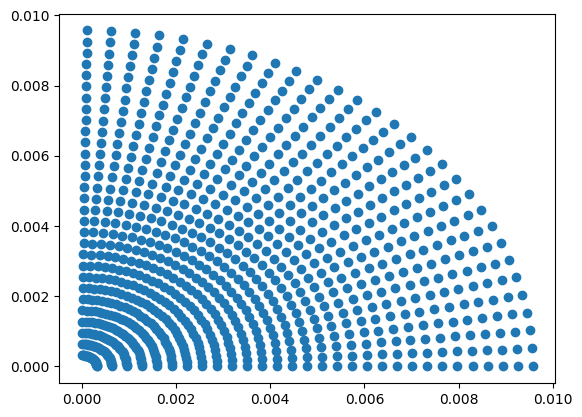

In [17]:
ax = plt.figure()
plt.scatter(X,Y)

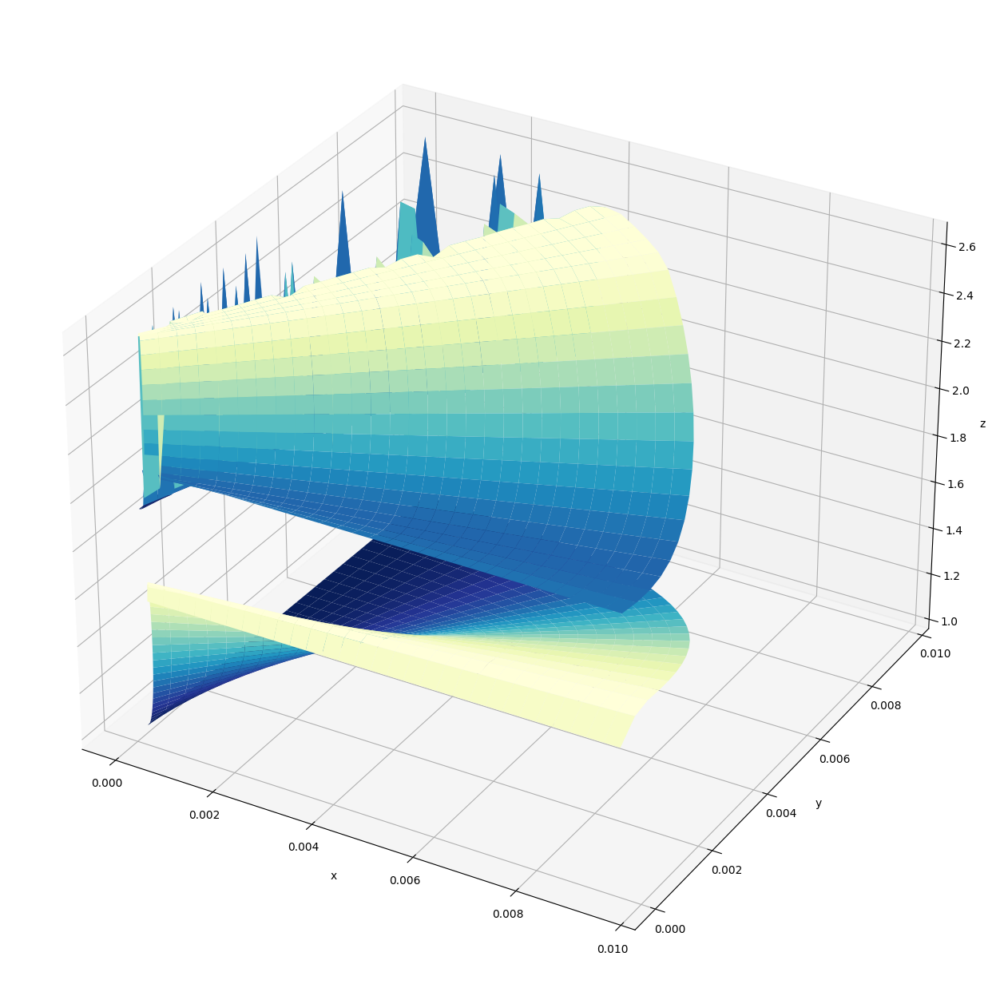

In [18]:
ax = plt.figure(figsize=(16,16)).add_subplot(projection='3d')
X, Y = R*np.cos(Theta), R*np.sin(Theta)
Z = ((R**2 - 1)**2)

ax.plot_surface(X, Y, Gap, cmap=plt.cm.YlGnBu_r)
ax.plot_surface(X, Y, Gap_mf, cmap=plt.cm.YlGnBu_r)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z');

In [289]:
radius = np.linalg.norm(w1 - w0)
R, Theta, Gap, Gap_mf = mf_spectral_distribution(w0, w1, w2, radius, 30)

[-0.70010842 -0.16763406 -0.21609592 -0.29249767  0.644877    0.5983248
  0.05220014 -0.29669539] [-0.20715257 -0.3529175   0.18990409 -0.74811601 -0.09435753  0.35528723
  0.69006934 -0.13971082]
0.6111763738796997
1.834594176437653
1.876093852097451
1.6847011921271249
1.5762202532642102
1.9530831527120587
1.9838592334184846
2.016115483525157
2.0498015682395594
2.084492526185128
2.119966610962192
2.156031005898125
2.19253568803601
2.2293601729283217
2.266407272447456
2.3035982938819397
2.34086877381736
2.3781655500153516
2.4139951995090017
2.4200997698090676
2.4273604140393035
2.4357601802498987
2.4452823467675384
2.4559101802406924
2.467626774824515
2.4804149500460504
2.4942571923009984
2.509135628936089
2.525032026367641
2.541927805687414
2.55980407076834
1.844320604533034
1.86077244857827
1.8813776488711236
1.6136964457110465
1.9324482795906648
1.9620195090051833
1.9933877746064892
2.0262839421673777
2.06035885809202
2.0953466601283006
2.131053652913651
2.1672959273945316
2.2039394

2.1428133283450945
2.1739106566952
2.2054063720644748
2.2372117726123264
2.2692486513131973
2.301448366854622
2.3337506613073766
2.3661029774850437
2.3984594397005328
2.430780288845062
2.4630312627581703
2.495182840089925
2.5272097764076276
1.3930015521864934
1.3343740949626768
1.2757522196984932
1.217127206738392
1.8410694397246297
1.8528668799400767
1.0411093035559158
1.8833336860719094
1.9017311227848648
1.9220303363648583
1.944036621786468
1.9675942590638305
1.992528827762706
2.0186701398362223
2.0458637759711356
2.073960651651558
2.1028300252570435
2.132347007535518
2.162401654345047
2.1928933260569345
2.2237335006981325
2.254842486686959
2.2861501620646103
2.3175939768822
2.3491192686641527
2.380678267308486
2.4122287687323136
2.4437345242284425
2.475163895813355
2.5064898045095574
1.3316421253579964
1.2747264421067135
1.8304407523414827
1.1609242754954556
1.8460245459726736
1.0471110822160077
1.8705750192242299
1.8860124305382566
0.8761609836202986
1.9225879663624637
1.943441364

2.06223187081062
2.0726150482961154
2.0833229648927176
2.0943434241346717
2.105710102629153
2.1173515655439745
2.129307502556036
2.141525730019645
2.1540249492931616
2.166746393177574
2.17977597038869
2.192973451147273
2.206415803250554
2.220112026647715
2.2339498259172994
2.2479918189026273
2.2622002548189153
2.2765523129055665
2.29106435884083
2.3057000354610127


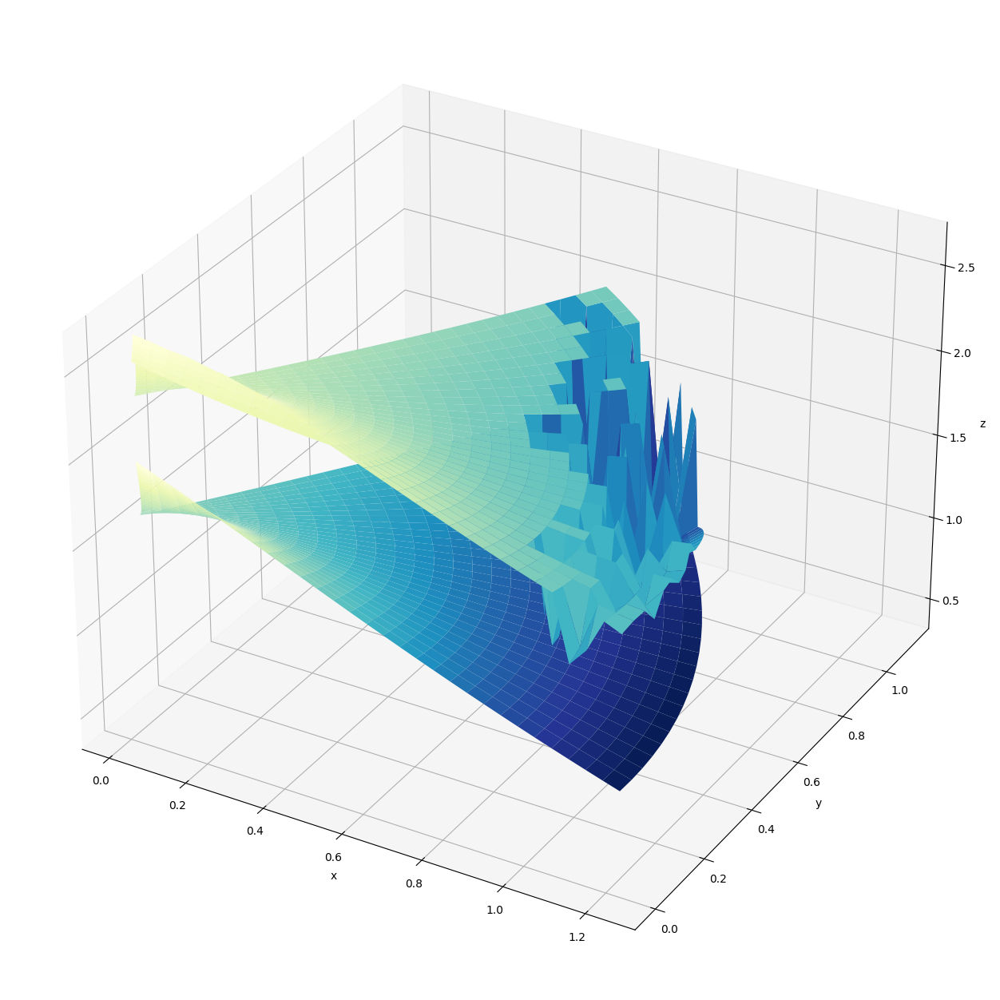

In [290]:
ax = plt.figure(figsize=(16,16)).add_subplot(projection='3d')
X,Y = R*np.cos(Theta), R*np.sin(Theta)
Z = ((R**2 - 1)**2)
ax.plot_surface(X, Y, Gap, cmap=plt.cm.YlGnBu_r)
ax.plot_surface(X, Y, Gap_mf, cmap=plt.cm.YlGnBu_r)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z');

In [26]:
psi = np.random.rand(2)
psi = psi/np.linalg.norm(psi)
psi_X = psi.conj().T @ np.array([[0,1],[1,0]]) @ psi
psi_Y = psi.conj().T @ np.array([[0,-1j],[1j,0]]) @ psi
psi_Z = psi.conj().T @ np.array([[1,0],[0,-1]]) @ psi

psi_X**2 + psi_Y**2 + psi_Z**2

(1+0j)